In [1]:
import sys
import os
import uproot
import numpy as np
import matplotlib.pyplot as plt

from scipy import stats as st
import scipy

import peakutils

from datetime import datetime

import math
from scipy          import stats
from scipy.optimize import curve_fit

In [2]:
### Import functions from peak_functions

repository_path = os.path.abspath('../..')
sys.path.append(repository_path)

import blr_functions  as blr
import peak_functions as pf
import fit_functions  as fitf

In [3]:
import warnings
warnings.filterwarnings("ignore")

In [4]:
plt.rcParams["figure.figsize"] = 9, 6
plt.rcParams["font.size"]      = 14

In [5]:
import matplotlib
# Set Palatino as the serif font
matplotlib.rcParams['font.family'] = 'serif'
matplotlib.rcParams['font.serif']  = 'Palatino'

In [6]:
filename = '/Users/romoluque_c/LEGEND/BACON/datatest/run-11_20_2023-file_1.root'
infile   = uproot.open(filename)
RawTree  = infile['RawTree']

### Plot one event

In [7]:
fav_col = '#418094'

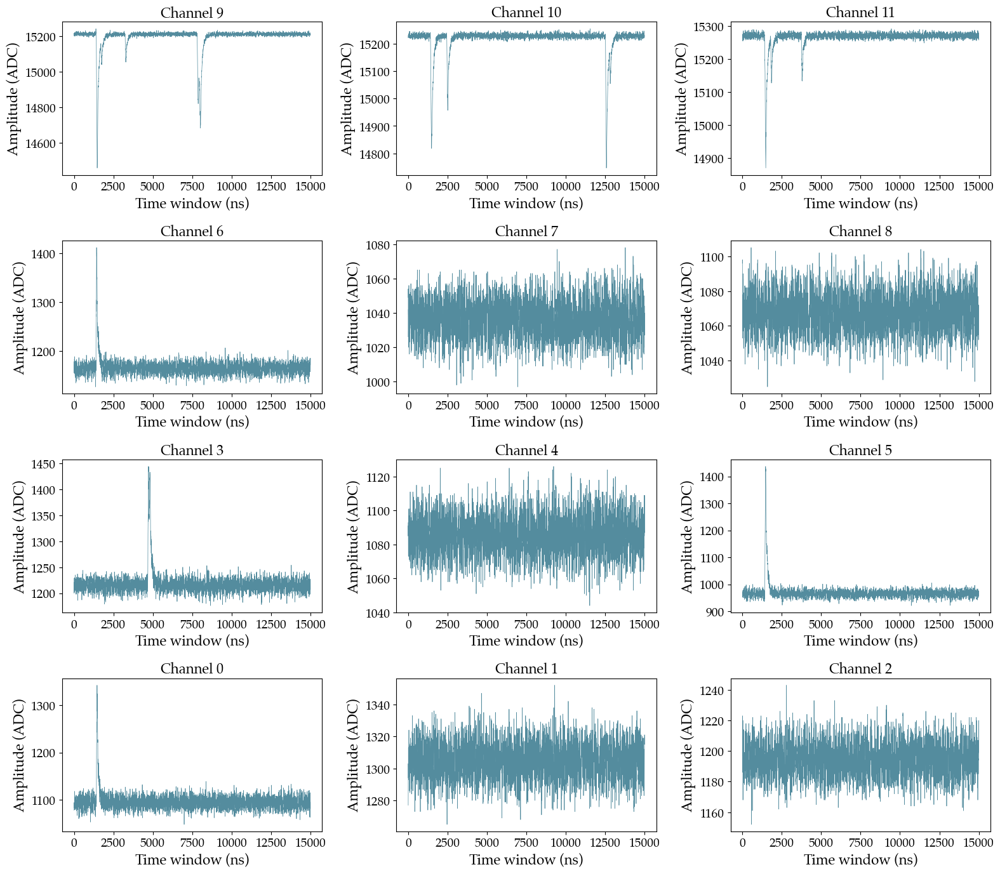

In [8]:
choose_evt = 4
fig, axs   = plt.subplots(4, 3, figsize=(16, 14))
for row, ich in enumerate(reversed(np.arange(0, 12, 3))):
    for col in range(3):
        ch = ich + col
        wf = np.array(RawTree[f'chan{ch}/rdigi'].array())[choose_evt]
        axs[row][col].plot(2*np.arange(len(wf)), wf, linewidth=0.5, color=fav_col, alpha=0.9)
        axs[row][col].set_xlabel('Time window (ns)', fontsize=16)
        axs[row][col].set_ylabel('Amplitude (ADC)',  fontsize=16)
        axs[row][col].set_title(f"Channel {ch}",     fontsize=16)
plt.tight_layout()
#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/event_example_all_SiPMs.pdf', bbox_inches='tight')
plt.show()

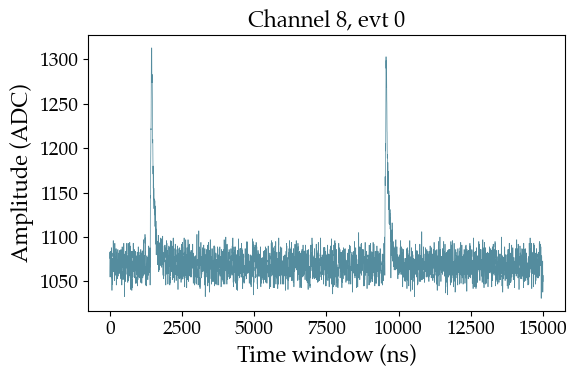

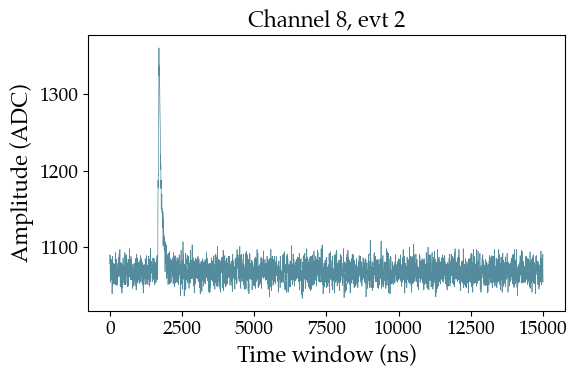

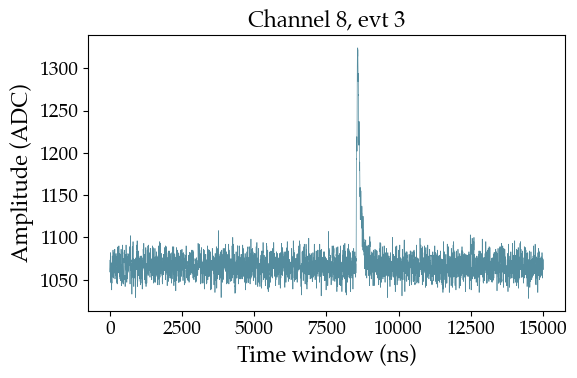

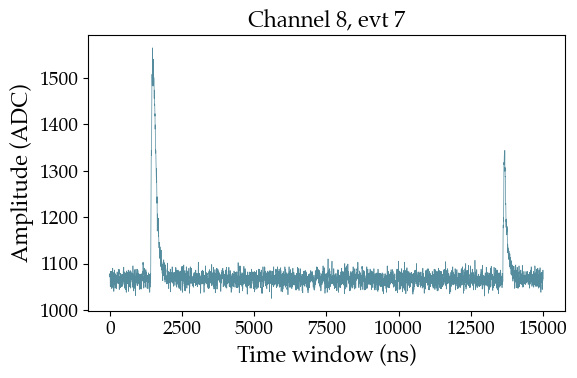

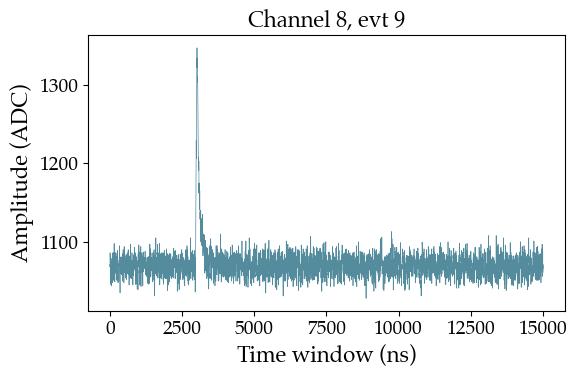

...

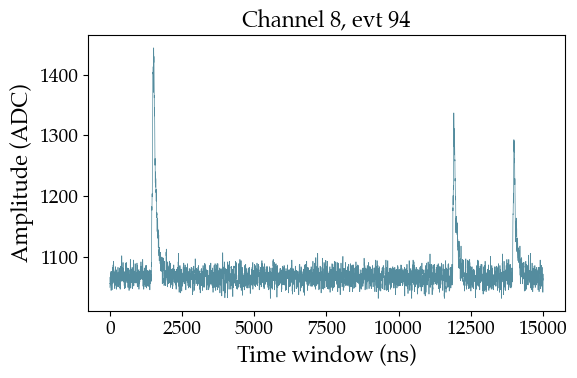

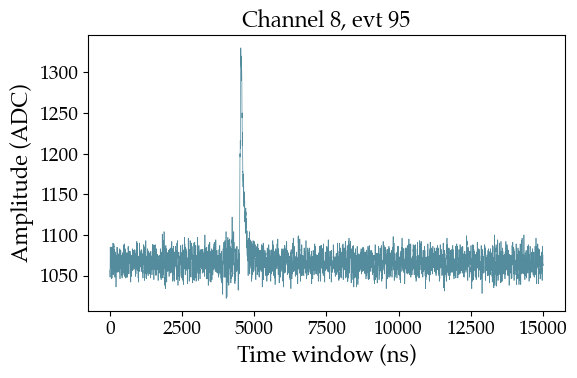

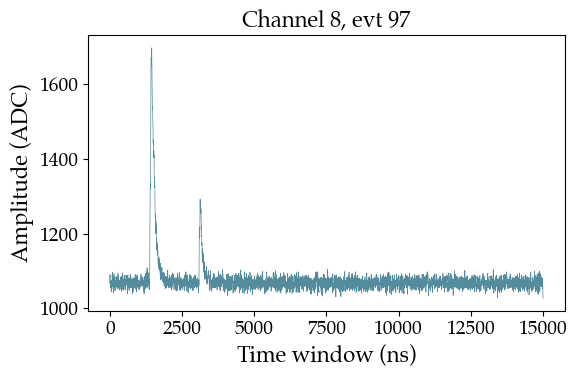

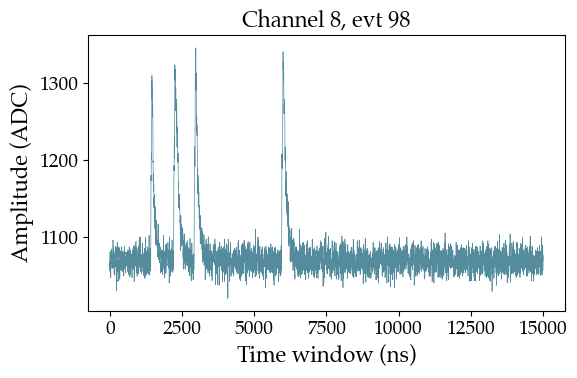

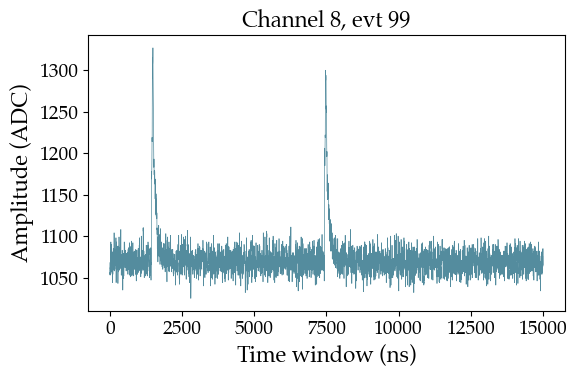

In [9]:
sel_ch     = 8
all_wfs_ch = np.array(RawTree[f'chan{sel_ch}/rdigi'].array())
for evt, wf in enumerate(all_wfs_ch[:100]):
    #if evt in [0, 12, 18, 25]:
    if np.std(wf)>20:
        plt.figure(figsize=(6, 4))
        plt.plot(2*np.arange(len(wf)), wf, linewidth=0.5, color=fav_col, alpha=0.9)
        plt.xlabel('Time window (ns)', fontsize=16)
        plt.ylabel('Amplitude (ADC)',  fontsize=16)
        plt.title(f"Channel {sel_ch}, evt {evt}",     fontsize=16)
        plt.tight_layout()
        #plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/event_example_all_SiPMs.pdf', bbox_inches='tight')
        plt.show()

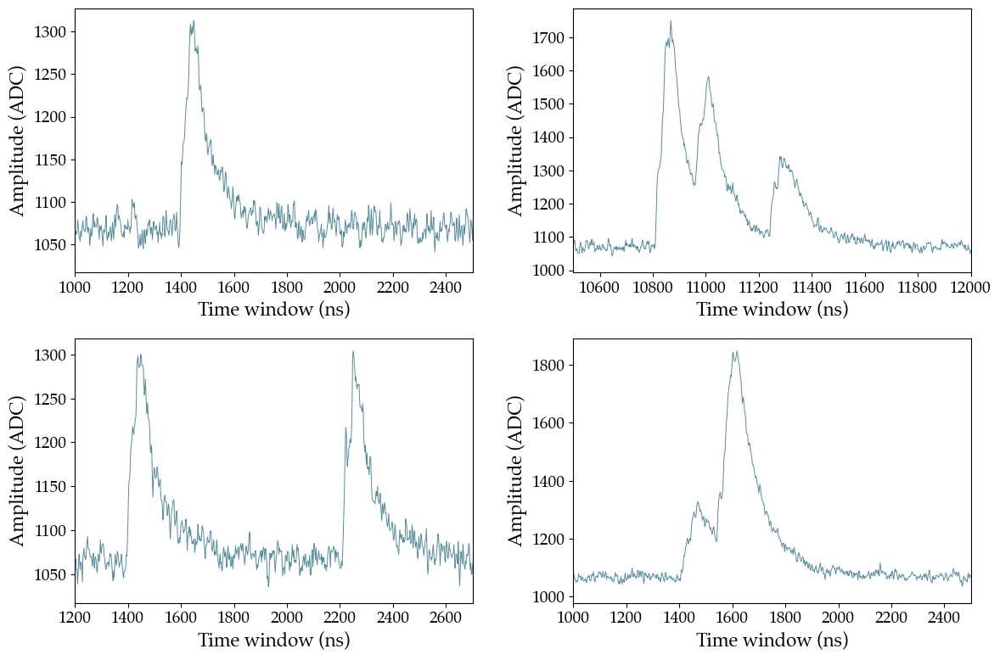

In [10]:
sel_ch     = 8
all_wfs_ch = np.array(RawTree[f'chan{sel_ch}/rdigi'].array())
fig, axs = plt.subplots(2, 2, figsize=(12, 8))
for evt, ax, xlim in zip([0, 37, 18, 56], axs.flatten(), [(1000, 2500), (10500, 12000), (1200, 2700), (1000, 2500)]):
    #if np.std(wf)>20:
    ax.plot(2*np.arange(len(all_wfs_ch[evt])), all_wfs_ch[evt], linewidth=0.7, color=fav_col, alpha=0.9)
    ax.set_xlim(xlim)
    ax.set_xlabel('Time window (ns)', fontsize=16)
    ax.set_ylabel('Amplitude (ADC)',  fontsize=16)
plt.tight_layout()
#plt.savefig(f'/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/4event_example_channel{sel_ch}.pdf', bbox_inches='tight')
plt.show()

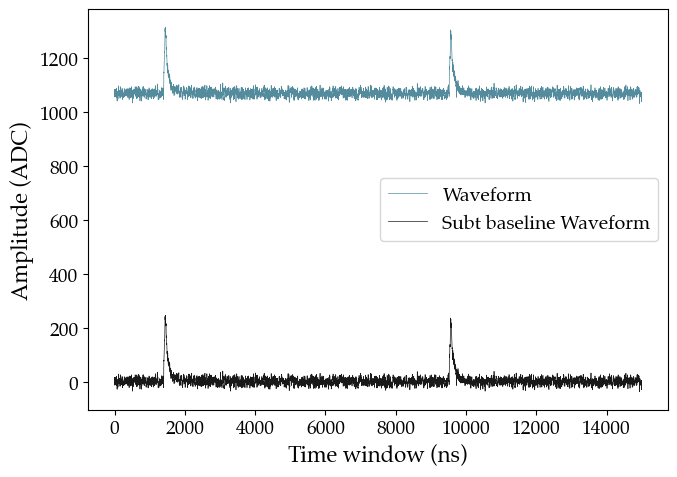

In [11]:
sel_ch     = 8
one_wf_ch  = np.array(RawTree[f'chan{sel_ch}/rdigi'].array())[0]
subt_wf_ch = pf.subtract_baseline(one_wf_ch, mode=True, wf_range_bsl=(0, 650))

plt.figure(figsize=(7, 5))
plt.plot(2*np.arange(len(one_wf_ch)),  one_wf_ch,  linewidth=0.5, color=fav_col, alpha=0.9, label='Waveform')
plt.plot(2*np.arange(len(subt_wf_ch)), subt_wf_ch, linewidth=0.5, color='k',     alpha=0.9, label='Subt baseline Waveform')
plt.xlabel('Time window (ns)', fontsize=16)
plt.ylabel('Amplitude (ADC)',  fontsize=16)
plt.legend()
plt.tight_layout()
#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/event_example_all_SiPMs.pdf', bbox_inches='tight')
plt.show()

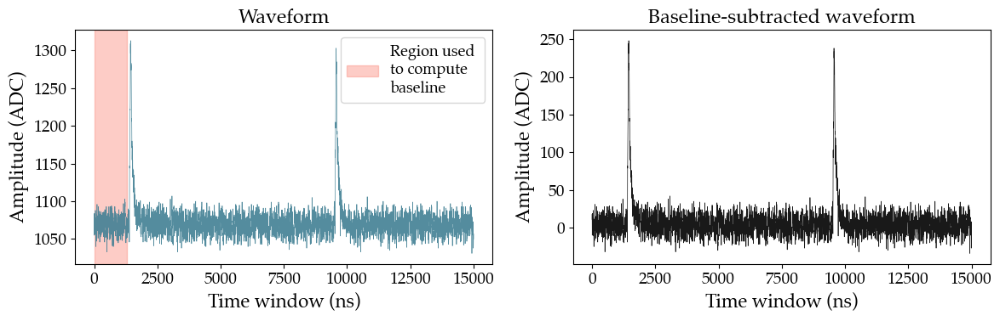

In [12]:
sel_ch      = 8
one_wf_ch   = np.array(RawTree[f'chan{sel_ch}/rdigi'].array())[0]
subt_wf_ch0 = pf.subtract_baseline(one_wf_ch, mode=True,  wf_range_bsl=(0, 650))
subt_wf_ch1 = pf.subtract_baseline(one_wf_ch, mode=False, wf_range_bsl=(0, 650))
fig, axs = plt.subplots(1, 2, figsize=(12, 4))
for i, (ax,wf,col,lab) in enumerate(zip(axs,[one_wf_ch,subt_wf_ch],[fav_col,'k'],['Waveform','Baseline-subtracted waveform'])):
    ax.plot(2*np.arange(len(wf)),  wf,  linewidth=0.5, color=col, alpha=0.9)
    if i==0:
        ax.axvspan(0, 1300, color='salmon', alpha=0.4, label='Region used \nto compute \nbaseline')
        ax.legend(fontsize=13)
    ax.set_xlabel('Time window (ns)', fontsize=16)
    ax.set_ylabel('Amplitude (ADC)',  fontsize=16)
    ax.set_title(lab)
plt.tight_layout()
#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/Baseline_subtraction_data.pdf', bbox_inches='tight')
plt.show()

In [13]:
wfs_ch       = np.array(RawTree[f'chan{sel_ch}/rdigi'].array())
subt_wfs_ch0 = pf.subtract_baseline(wfs_ch, mode=True,  wf_range_bsl=(0, 650))
subt_wfs_ch1 = pf.subtract_baseline(wfs_ch, mode=False, wf_range_bsl=(0, 650))

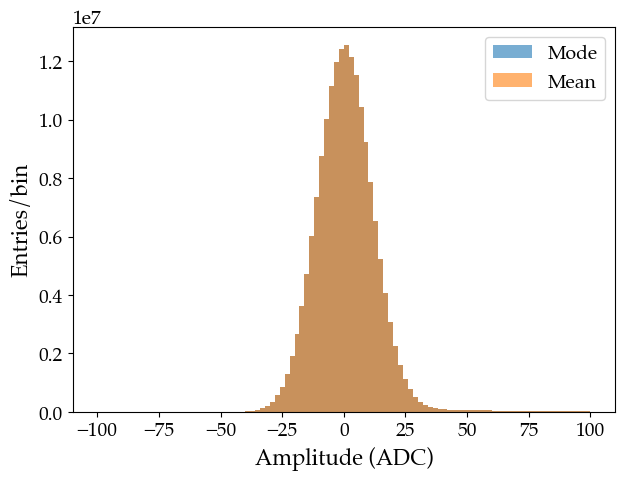

In [14]:
plt.figure(figsize=(7, 5))
plt.hist(subt_wfs_ch0.flatten(), bins=100, range=(-100, 100), alpha=0.6, label='Mode')
plt.hist(subt_wfs_ch1.flatten(), bins=100, range=(-100, 100), alpha=0.6, label='Mean')
plt.xlabel('Amplitude (ADC)', fontsize=16)
plt.ylabel('Entries/bin',     fontsize=16)
plt.legend()
plt.show()

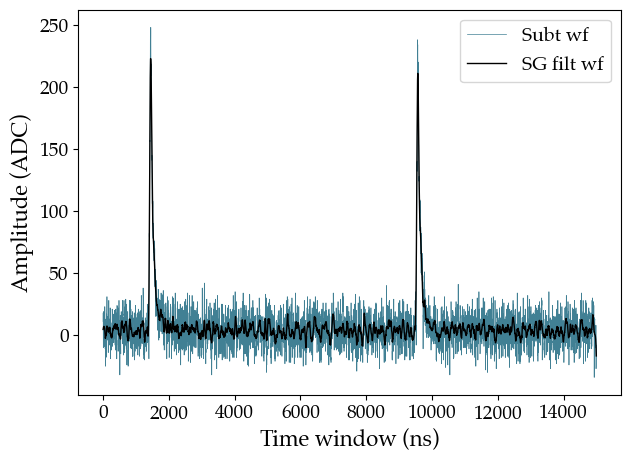

In [15]:
from scipy.signal import savgol_filter

sel_ch      = 8
one_wf_ch   = np.array(RawTree[f'chan{sel_ch}/rdigi'].array())[0]
subt_wf_ch  = pf.subtract_baseline(one_wf_ch, mode=True, wf_range_bsl=(0, 650))
filt_swf_ch = savgol_filter(subt_wf_ch, window_length=50, polyorder=3)

plt.figure(figsize=(7, 5))
plt.plot(2*np.arange(len(subt_wf_ch)), subt_wf_ch,   linewidth=0.5, color=fav_col, label='Subt wf')
plt.plot(2*np.arange(len(filt_swf_ch)), filt_swf_ch, linewidth=1,   color='k',     label='SG filt wf')
plt.xlabel('Time window (ns)', fontsize=16)
plt.ylabel('Amplitude (ADC)',  fontsize=16)
plt.legend()
#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/SG_waveform.pdf', bbox_inches='tight')
plt.show()

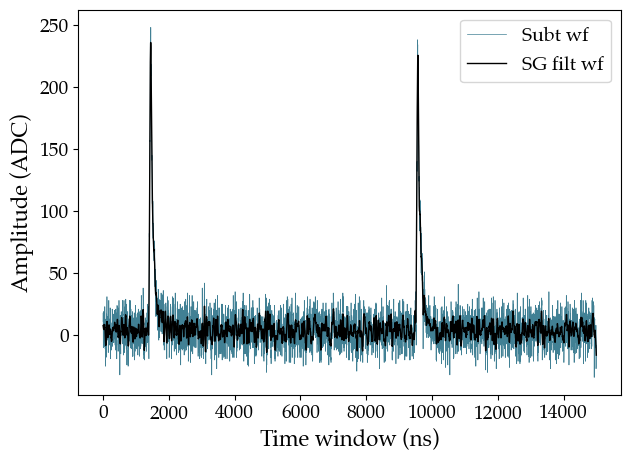

In [96]:
from scipy.signal import savgol_filter

sel_ch      = 8
one_wf_ch   = np.array(RawTree[f'chan{sel_ch}/rdigi'].array())[0]
subt_wf_ch  = pf.subtract_baseline(one_wf_ch, mode=True, wf_range_bsl=(0, 650))
filt_swf_ch = savgol_filter(subt_wf_ch, window_length=30, polyorder=3)

plt.figure(figsize=(7, 5))
plt.plot(2*np.arange(len(subt_wf_ch)), subt_wf_ch,   linewidth=0.5, color=fav_col, label='Subt wf')
plt.plot(2*np.arange(len(filt_swf_ch)), filt_swf_ch, linewidth=1,   color='k',     label='SG filt wf')
plt.xlabel('Time window (ns)', fontsize=16)
plt.ylabel('Amplitude (ADC)',  fontsize=16)
plt.legend()
#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/SG_waveform_wl30ns.pdf', bbox_inches='tight')
plt.show()

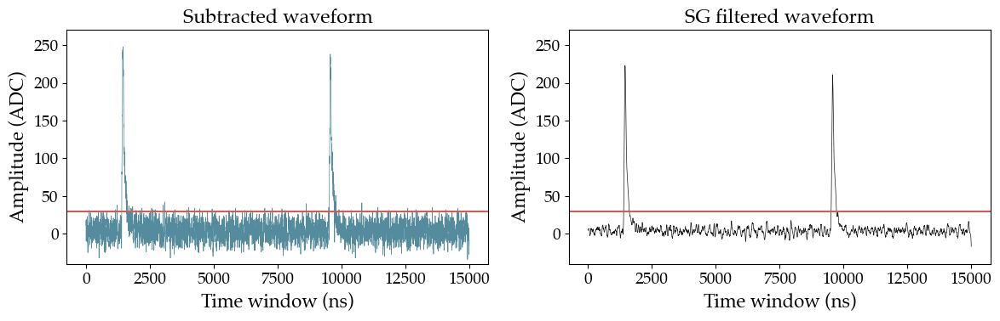

In [16]:
sel_ch      = 8
sel_thr     = 30 #ADC
one_wf_ch   = np.array(RawTree[f'chan{sel_ch}/rdigi'].array())[0]
subt_wf_ch  = pf.subtract_baseline(one_wf_ch, mode=True, wf_range_bsl=(0, 650))
filt_swf_ch = savgol_filter(subt_wf_ch, window_length=50, polyorder=3)

fig, axs = plt.subplots(1, 2, figsize=(12, 4))
for i, (ax,wf,col,lab) in enumerate(zip(axs,[subt_wf_ch,filt_swf_ch],[fav_col,'k'],['Subtracted waveform', 'SG filtered waveform'])):
    ax.plot(2*np.arange(len(wf)),  wf,  linewidth=0.5, color=col, alpha=0.9)
    ax.axhline(y=30, color='indianred')
    ax.set_xlabel('Time window (ns)', fontsize=16)
    ax.set_ylabel('Amplitude (ADC)',  fontsize=16)
    ax.set_title(lab)
    ax.set_ylim(-40, 270)
plt.tight_layout()
#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/SG_waveform_thr.pdf', bbox_inches='tight')
plt.show()

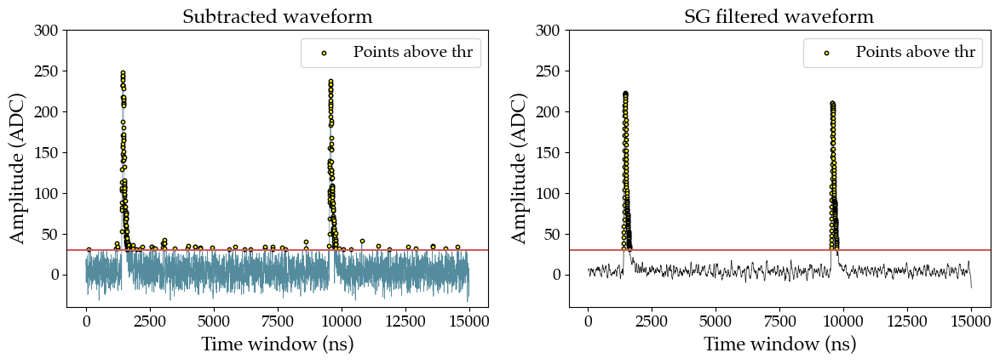

In [17]:
sel_ch      = 8
one_wf_ch   = np.array(RawTree[f'chan{sel_ch}/rdigi'].array())[0]
subt_wf_ch  = pf.subtract_baseline(one_wf_ch, mode=True, wf_range_bsl=(0, 650))
filt_swf_ch = savgol_filter(subt_wf_ch, window_length=50, polyorder=3)

fig, axs = plt.subplots(1, 2, figsize=(12, 4.5))
for i, (ax,wf,col,lab) in enumerate(zip(axs,[subt_wf_ch,filt_swf_ch],[fav_col,'k'],['Subtracted waveform', 'SG filtered waveform'])):
    
    ax.plot(2*np.arange(len(wf)),  wf,  linewidth=0.5, color=col, alpha=0.9)

    idx_ab_thr = np.where(wf>sel_thr)[0]
    ax.scatter(2*idx_ab_thr, wf[idx_ab_thr], color='yellow', edgecolors='black', marker='o', s=10, zorder=2, label=f'Points above thr')

    ax.axhline(y=30, color='indianred')
    ax.set_xlabel('Time window (ns)', fontsize=16)
    ax.set_ylabel('Amplitude (ADC)',  fontsize=16)
    ax.set_title(lab)
    ax.set_ylim(-40, 300)
    ax.legend()
plt.tight_layout()
#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/SG_waveform_thr_points.pdf', bbox_inches='tight')
plt.show()

##### Filter the wf with window_length = 30 ns

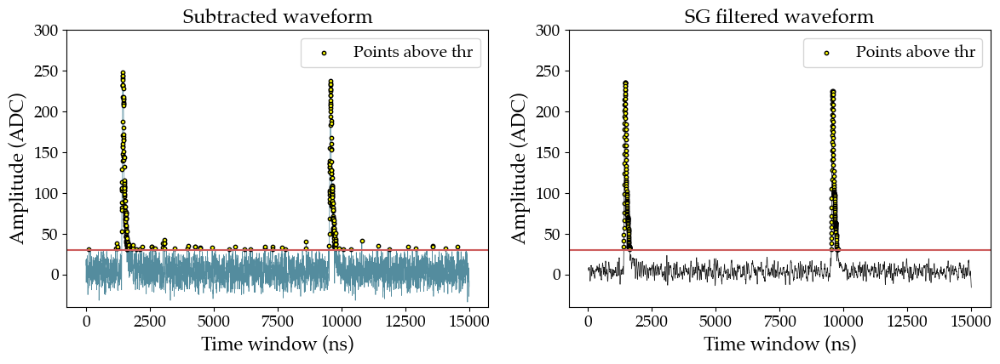

In [97]:
sel_ch      = 8
one_wf_ch   = np.array(RawTree[f'chan{sel_ch}/rdigi'].array())[0]
subt_wf_ch  = pf.subtract_baseline(one_wf_ch, mode=True, wf_range_bsl=(0, 650))
filt_swf_ch = savgol_filter(subt_wf_ch, window_length=30, polyorder=3)

fig, axs = plt.subplots(1, 2, figsize=(12, 4.5))
for i, (ax,wf,col,lab) in enumerate(zip(axs,[subt_wf_ch,filt_swf_ch],[fav_col,'k'],['Subtracted waveform', 'SG filtered waveform'])):
    
    ax.plot(2*np.arange(len(wf)),  wf,  linewidth=0.5, color=col, alpha=0.9)

    idx_ab_thr = np.where(wf>sel_thr)[0]
    ax.scatter(2*idx_ab_thr, wf[idx_ab_thr], color='yellow', edgecolors='black', marker='o', s=10, zorder=2, label=f'Points above thr')

    ax.axhline(y=30, color='indianred')
    ax.set_xlabel('Time window (ns)', fontsize=16)
    ax.set_ylabel('Amplitude (ADC)',  fontsize=16)
    ax.set_title(lab)
    ax.set_ylim(-40, 300)
    ax.legend()
plt.tight_layout()
#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/SG_waveform_wl30ns_thr_points.pdf', bbox_inches='tight')
plt.show()

#### Find a waveform with peaks before the trigger region:

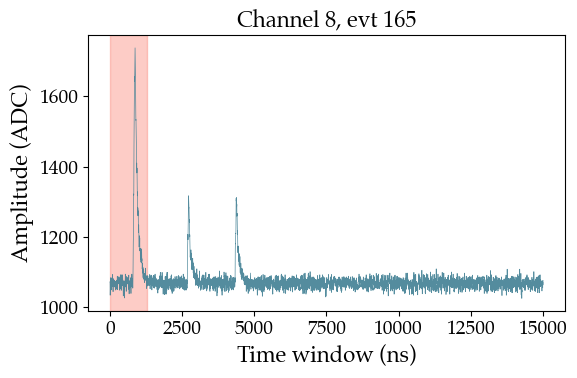

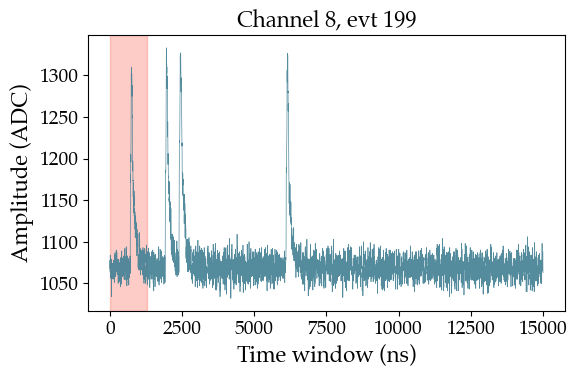

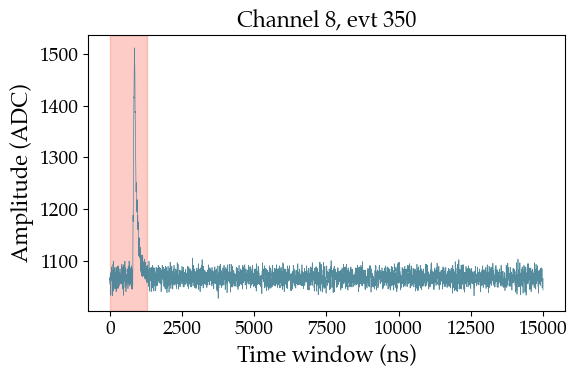

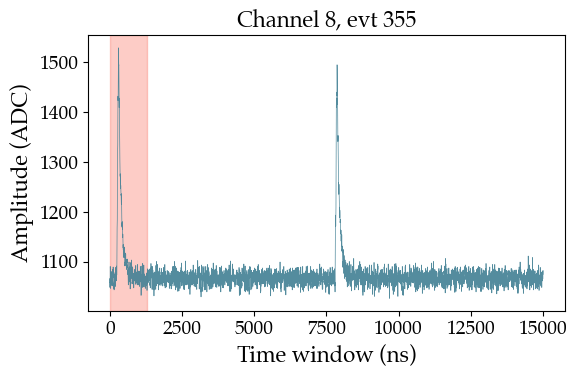

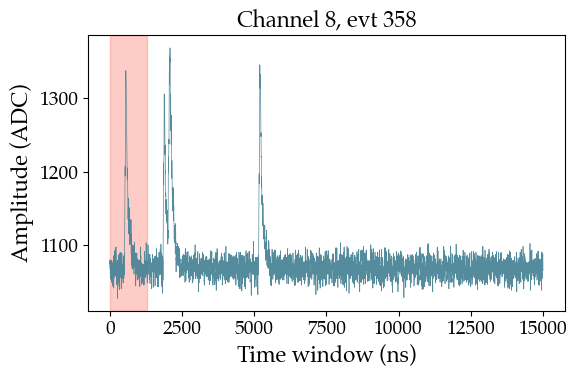

...

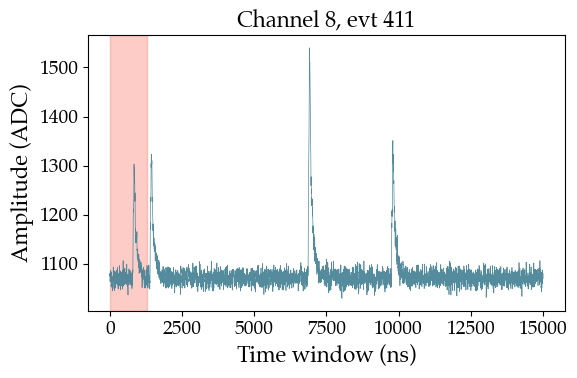

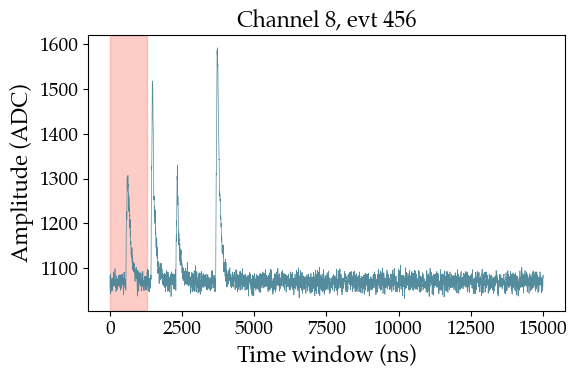

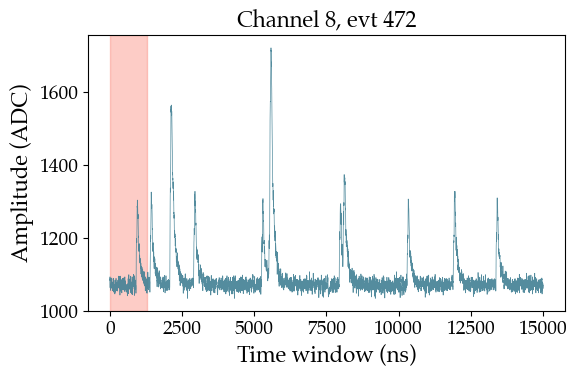

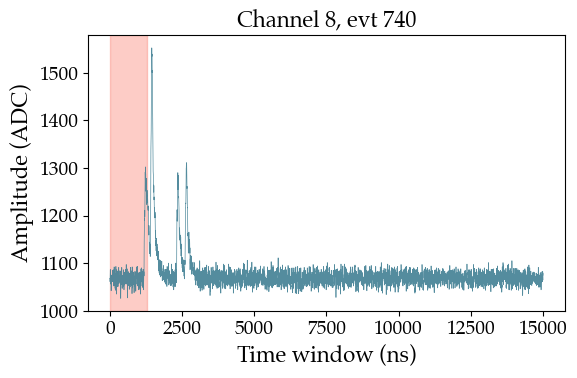

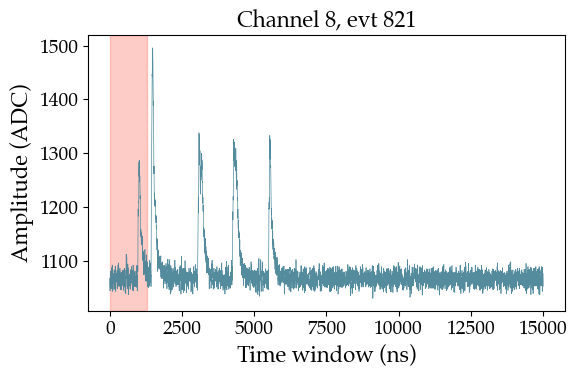

In [18]:
sel_ch       = 8
wf_range_bsl = 650
all_wfs_ch   = np.array(RawTree[f'chan{sel_ch}/rdigi'].array())
for evt, wf in enumerate(all_wfs_ch[:1000]):
    #if evt in [0, 12, 18, 25]:
    if np.std(wf[:wf_range_bsl])>20:
        plt.figure(figsize=(6, 4))
        plt.plot(2*np.arange(len(wf)), wf, linewidth=0.5, color=fav_col, alpha=0.9)
        plt.axvspan(0, 1300, color='salmon', alpha=0.4, label='Region used \nto compute \nbaseline')
        plt.xlabel('Time window (ns)', fontsize=16)
        plt.ylabel('Amplitude (ADC)',  fontsize=16)
        plt.title(f"Channel {sel_ch}, evt {evt}",     fontsize=16)
        plt.tight_layout()
        #plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/event_example_all_SiPMs.pdf', bbox_inches='tight')
        plt.show()

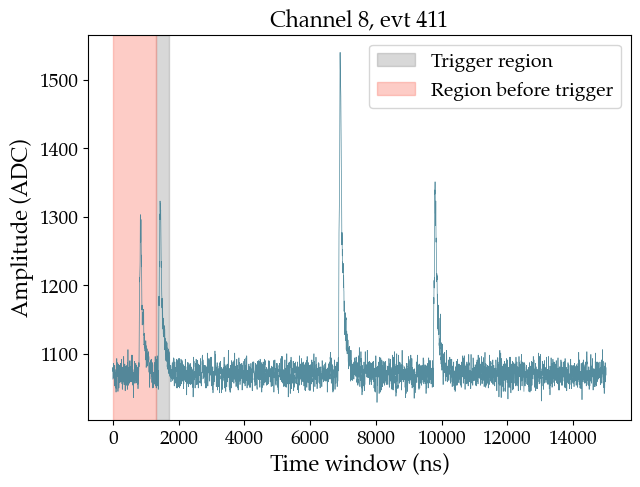

In [19]:
sel_ch       = 8
wf_range_bsl = 650
all_wfs_ch   = np.array(RawTree[f'chan{sel_ch}/rdigi'].array())
for evt, wf in enumerate(all_wfs_ch[:1000]):
    if evt in [411]:
        #if np.std(wf[:wf_range_bsl])>20:
        plt.figure(figsize=(7, 5))
        plt.plot(2*np.arange(len(wf)), wf, linewidth=0.5, color=fav_col, alpha=0.9)
        plt.axvspan(1300, 1700, color='grey',   alpha=0.3, label='Trigger region')
        plt.axvspan(   0, 1300, color='salmon', alpha=0.4, label='Region before trigger')
        plt.xlabel('Time window (ns)', fontsize=16)
        plt.ylabel('Amplitude (ADC)',  fontsize=16)
        plt.title(f"Channel {sel_ch}, evt {evt}",     fontsize=16)
        plt.legend()
        #plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/event_example_all_SiPMs.pdf', bbox_inches='tight')
        plt.show()

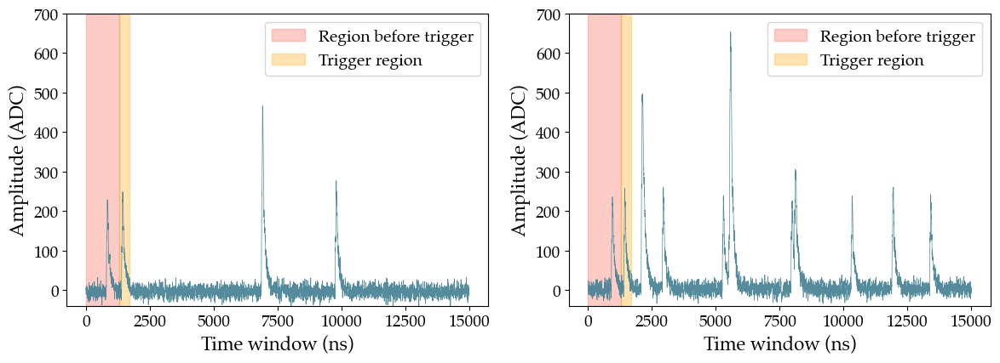

In [20]:
sel_ch       = 8
wf_range_bsl = 650
fig, axs     = plt.subplots(1, 2, figsize=(12, 4.5))
for i, (ax,evt) in enumerate(zip(axs,[411,472])):
    wf  = np.array(RawTree[f'chan{sel_ch}/rdigi'].array())[evt]
    swf = pf.subtract_baseline(wf, mode=True, wf_range_bsl=(0, wf_range_bsl))
    ax.plot(2*np.arange(len(swf)), swf, linewidth=0.5, color=fav_col, alpha=0.9)
    ax.axvspan(   0, 1300, color='salmon', alpha=0.4, label='Region before trigger')
    ax.axvspan(1300, 1700, color='orange', alpha=0.3, label='Trigger region')
    ax.set_xlabel('Time window (ns)', fontsize=16)
    ax.set_ylabel('Amplitude (ADC)',  fontsize=16)
    ax.set_ylim(-40, 700)
    ax.legend()
plt.tight_layout()
#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/Two_evts_with_signal_before_trigger_ch8.pdf', bbox_inches='tight')
plt.show()

#### Zero suppressed waveform

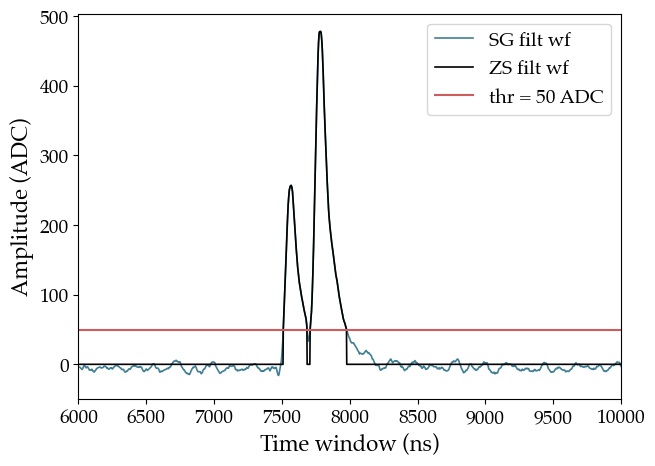

In [21]:
sel_ch      = 8
one_wf_ch   = np.array(RawTree[f'chan{sel_ch}/rdigi'].array())[12]
subt_wf_ch  = pf.subtract_baseline(one_wf_ch, mode=True, wf_range_bsl=(0, 650))
filt_swf_ch = savgol_filter(subt_wf_ch, window_length=50, polyorder=3)
zs_filt_wf  = pf.noise_suppression(filt_swf_ch, threshold=50)

plt.figure(figsize=(7, 5))
plt.plot(2*np.arange(len(filt_swf_ch)), filt_swf_ch, linewidth=1.2, color=fav_col, label='SG filt wf')
plt.plot(2*np.arange(len(zs_filt_wf)),  zs_filt_wf,  linewidth=1.2, color='k',     label='ZS filt wf')
plt.axhline(y=50, color='indianred', label='thr = 50 ADC')
plt.xlabel('Time window (ns)', fontsize=16)
plt.ylabel('Amplitude (ADC)',  fontsize=16)
plt.xlim(6000, 10000)
plt.legend()
#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/ZS_waveform.pdf', bbox_inches='tight')
plt.show()

#### Get peak position using peakutils

[3784 3891]


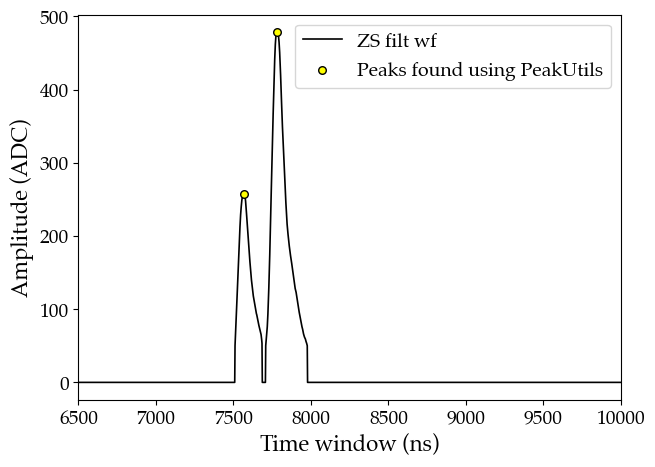

In [22]:
sel_ch      = 8
one_wf_ch   = np.array(RawTree[f'chan{sel_ch}/rdigi'].array())[12]
subt_wf_ch  = pf.subtract_baseline(one_wf_ch, mode=True, wf_range_bsl=(0, 650))
filt_swf_ch = savgol_filter(subt_wf_ch, window_length=50, polyorder=3)
zs_filt_wf  = pf.noise_suppression(filt_swf_ch, threshold=50)
idx_peaks   = pf.get_peaks_peakutils(zs_filt_wf, thres=50, min_dist=50, thres_abs=True)
print(idx_peaks)

plt.figure(figsize=(7, 5))
plt.plot(2*np.arange(len(zs_filt_wf)),  zs_filt_wf,  linewidth=1.2, color='k', label='ZS filt wf')
plt.scatter(2*idx_peaks, zs_filt_wf[idx_peaks], color='yellow', edgecolors='black', marker='o', s=30, zorder=2, label=f'Peaks found using PeakUtils')
#plt.axhline(y=50, color='indianred', label='thr = 50 ADC')
plt.xlabel('Time window (ns)', fontsize=16)
plt.ylabel('Amplitude (ADC)',  fontsize=16)
plt.xlim(6500, 10000)
plt.legend()
#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/ZS_peaks_waveform.pdf', bbox_inches='tight')
plt.show()

#### Compute the hit map of one channel using one file

In [23]:
from functools         import partial
from matplotlib.colors import LogNorm

all_wfs  = pf.wfs_from_rawtree(RawTree, 8)
subt_wfs = np.array([pf.subtract_baseline(fwf, mode=True, wf_range_bsl=(0, 650))
                                          for fwf in all_wfs])

sg_filt_swfs = savgol_filter(subt_wfs, window_length=50, polyorder=3)

## Noise suppression
zs_sg_filt_swfs = pf.noise_suppression(sg_filt_swfs, threshold=50)

## Get peaks above thr_ADC
partial_get_peaks_peakutils = partial(pf.get_peaks_peakutils, thres=50, min_dist=50, thres_abs=True)
idx_peaks_ch = np.array(list(map(partial_get_peaks_peakutils, zs_sg_filt_swfs)), dtype=object)

height_peaks_ch = np.array([wf[idx_peaks_ch[i]] if len(idx_peaks_ch[i])!=0 else np.array([])
                                            for i,wf in enumerate(subt_wfs)], dtype=object)

In [24]:
len(idx_peaks_ch), len(height_peaks_ch)
height_peaks_ch.flatten()
len(np.concatenate(idx_peaks_ch)), len(np.concatenate(height_peaks_ch))

(34360, 34360)

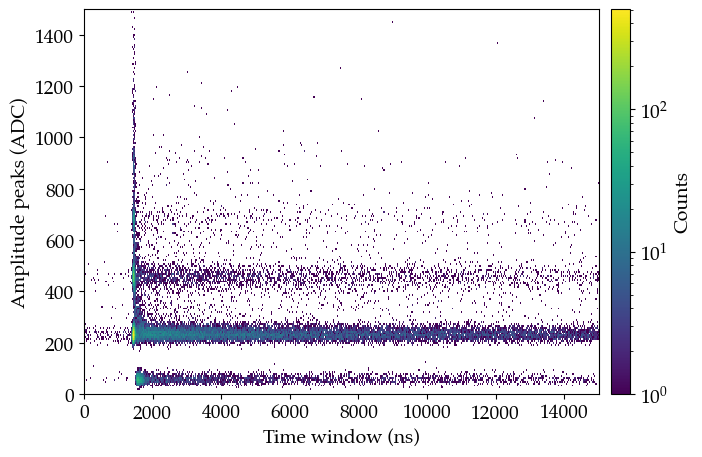

In [25]:
fig = plt.figure(figsize=(8, 5))
h = plt.hist2d(np.concatenate(idx_peaks_ch)*2, np.concatenate(height_peaks_ch), bins=(500, 200), range=((0, 15000), (0, 1500)), cmin=1, norm=LogNorm())
plt.xlabel('Time window (ns)',      fontsize=14)
plt.ylabel('Amplitude peaks (ADC)', fontsize=14)
plt.colorbar(h[3], label='Counts', pad=0.02)
#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/hit_map_example.pdf', bbox_inches='tight')
plt.show()

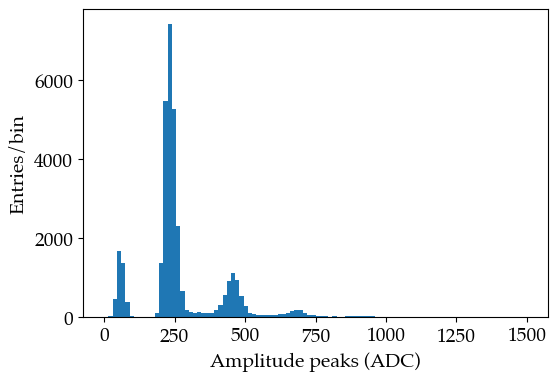

In [26]:
fig = plt.figure(figsize=(6, 4))
plt.hist(np.concatenate(height_peaks_ch), bins=100, range=(0, 1500))
plt.xlabel('Amplitude peaks (ADC)')
plt.ylabel('Entries/bin')
plt.show()

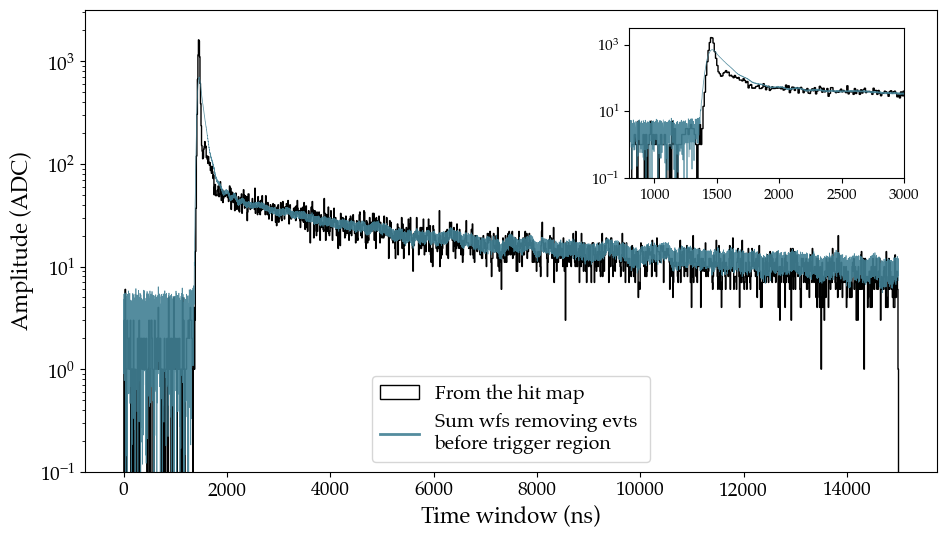

In [27]:
fig = plt.figure(figsize=(11, 6))
channel           = 8
all_wfs           = np.array(RawTree[f'chan{channel}/rdigi'].array())
all_wfs_rem_bckg  = np.array([wf for wf in all_wfs if np.std(wf[:wf_range_bsl])<15])
subt_wfs = pf.subtract_baseline(all_wfs_rem_bckg, mode=True, wf_range_bsl=(0, 500))
sum_wfs  = np.sum(subt_wfs, axis=0)

plt.hist(np.concatenate(idx_peaks_ch)*2, bins=1500, range=(0, 15000), log=True, histtype='step', label='From the hit map', color='k')
plt.plot(2*np.arange(len(sum_wfs)), sum_wfs/3500, linewidth=0.5, label='Sum wfs removing evts \nbefore trigger region', color=fav_col, alpha=0.9)
plt.xlabel('Time window (ns)', fontsize=16)
plt.ylabel('Amplitude (ADC)',  fontsize=16)
plt.ylim(1e-1, 3.1623e3)
plt.yscale('log')
leg = plt.legend(loc='lower center')
for line in leg.get_lines():
    line.set_linewidth(2)

from mpl_toolkits.axes_grid1.inset_locator import inset_axes
ax_inset = fig.add_axes([0.62, 0.60, 0.25, 0.25])
ax_inset.hist(np.concatenate(idx_peaks_ch)*2, bins=1500, range=(0, 15000), log=True, histtype='step', color='k')
ax_inset.plot(2*np.arange(len(sum_wfs)), sum_wfs/3500, linewidth=0.5, color=fav_col, alpha=0.9)
ax_inset.set_xlim(800, 3000)
ax_inset.set_ylim(1e-1, 3.1623e3)
ax_inset.tick_params(axis='x', labelsize=11)
ax_inset.tick_params(axis='y', labelsize=11)

#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/hit_hist_and_summed_wfs_example_norm_evts.pdf', bbox_inches='tight')
plt.show()

In [28]:
idx_peaks_thr_ch = np.array([pf.get_values_thr_from_zswf(wf, idx_peaks_ch[i])
                                      for i,wf in enumerate(zs_sg_filt_swfs)], dtype=object)

height_peaks_deconv_ch = np.array([pf.peak_height_deconv(wf, idx_peaks_ch[i], height_peaks_ch[i].copy())
                                   for i, wf in enumerate(zs_sg_filt_swfs)], dtype=object)

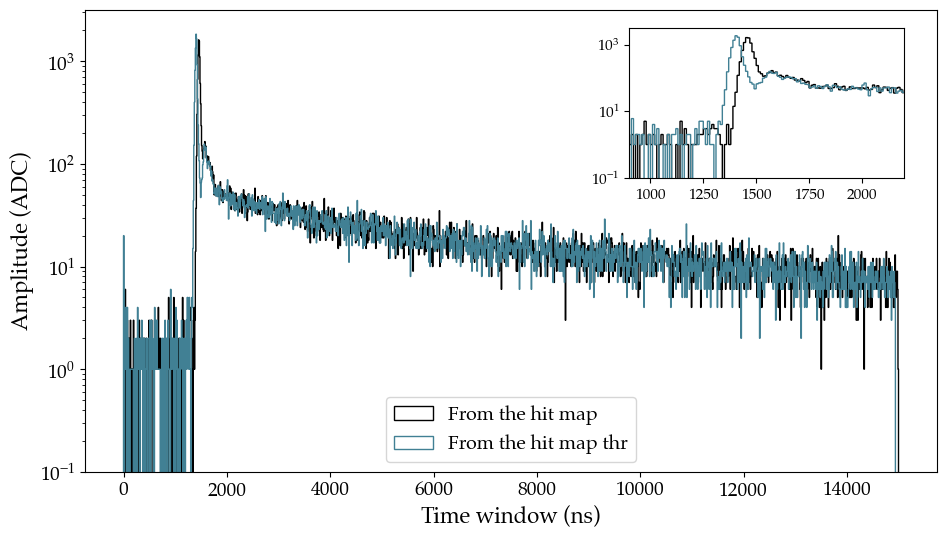

In [29]:
fig = plt.figure(figsize=(11, 6))
plt.hist(np.concatenate(idx_peaks_ch)*2,     bins=1500, range=(0, 15000), log=True, histtype='step', label='From the hit map', color='k')
plt.hist(np.concatenate(idx_peaks_thr_ch)*2, bins=1500, range=(0, 15000), log=True, histtype='step', label='From the hit map thr', color=fav_col)
plt.xlabel('Time window (ns)', fontsize=16)
plt.ylabel('Amplitude (ADC)',  fontsize=16)
plt.ylim(1e-1, 3.1623e3)
plt.yscale('log')
leg = plt.legend(loc='lower center')
for line in leg.get_lines():
    line.set_linewidth(2)
    
ax_inset = fig.add_axes([0.62, 0.60, 0.25, 0.25])
ax_inset.hist(np.concatenate(idx_peaks_ch)*2,     bins=1500, range=(0, 15000), log=True, histtype='step', color='k')
ax_inset.hist(np.concatenate(idx_peaks_thr_ch)*2, bins=1500, range=(0, 15000), log=True, histtype='step', color=fav_col)
ax_inset.set_xlim(900, 2200)
ax_inset.set_ylim(1e-1, 3.1623e3)
ax_inset.tick_params(axis='x', labelsize=11)
ax_inset.tick_params(axis='y', labelsize=11)

#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/hit_hist_and_summed_wfs_example_norm_evts.pdf', bbox_inches='tight')
plt.show()

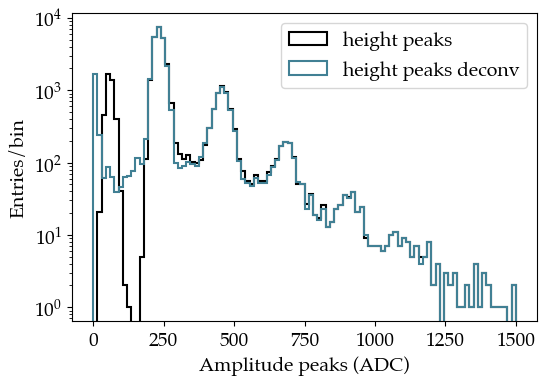

In [30]:
fig = plt.figure(figsize=(6, 4))
plt.hist(np.concatenate(height_peaks_ch),        bins=100, range=(0, 1500), histtype='step', linewidth=1.5, color='k',     label='height peaks')
plt.hist(np.concatenate(height_peaks_deconv_ch), bins=100, range=(0, 1500), histtype='step', linewidth=1.5, color=fav_col, label='height peaks deconv')
plt.xlabel('Amplitude peaks (ADC)')
plt.ylabel('Entries/bin')
plt.yscale('log')
plt.legend()
plt.show()

In [31]:
idx_peaks_no_bef_trigg_time_conc    = np.array([])
height_peaks_no_bef_trigg_time_conc = np.array([])
for i, j in zip(idx_peaks_ch, height_peaks_ch):
    if len(i)==0:
        continue
    if np.any(np.array(i) < 650):
        continue
    for ii,jj in zip(i,j):
        idx_peaks_no_bef_trigg_time_conc    = np.append(idx_peaks_no_bef_trigg_time_conc   , ii)
        height_peaks_no_bef_trigg_time_conc = np.append(height_peaks_no_bef_trigg_time_conc, jj)
        
idx_peaks_no_bef_trigg_time_conc2    = np.array([])
height_peaks_no_bef_trigg_time_conc2 = np.array([])
for i, j in zip(idx_peaks_thr_ch, height_peaks_deconv_ch):
    if len(i)==0:
        continue
    if np.any(np.array(i) < 650):
        continue
    for ii,jj in zip(i,j):
        idx_peaks_no_bef_trigg_time_conc2    = np.append(idx_peaks_no_bef_trigg_time_conc2   , ii)
        height_peaks_no_bef_trigg_time_conc2 = np.append(height_peaks_no_bef_trigg_time_conc2, jj)

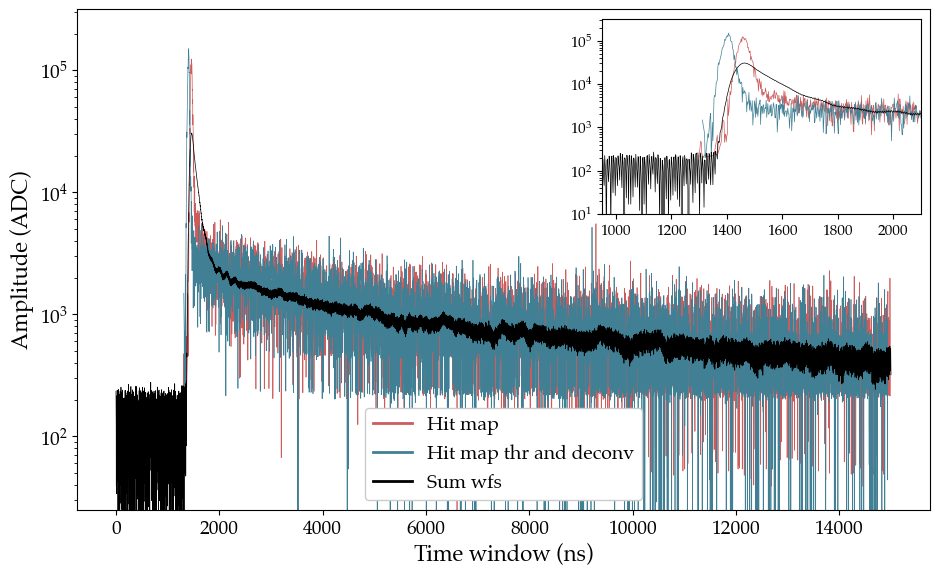

In [32]:
timestamps  = 2*idx_peaks_no_bef_trigg_time_conc    ### np.concatenate(idx_peaks_ch)*2
amplitudes  = height_peaks_no_bef_trigg_time_conc   ### np.concatenate(height_peaks_ch)
timestamps2 = 2*idx_peaks_no_bef_trigg_time_conc2   ### np.concatenate(idx_peaks_thr_ch)*2
amplitudes2 = height_peaks_no_bef_trigg_time_conc2  ### np.concatenate(height_peaks_deconv_ch)

unique_timestamps  = np.unique(timestamps)
unique_timestamps2 = np.unique(timestamps2)

sum_amplitudes  = [np.sum(amplitudes [timestamps  == timestamp ]) for timestamp  in unique_timestamps]
sum_amplitudes2 = [np.sum(amplitudes2[timestamps2 == timestamp2]) for timestamp2 in unique_timestamps2]

fig = plt.figure(figsize=(11, 6.5))
plt.plot(unique_timestamps,  sum_amplitudes,    linewidth=0.5, label='Hit map',                color='indianred')
plt.plot(unique_timestamps2, sum_amplitudes2,   linewidth=0.5, label='Hit map thr and deconv', color=fav_col)
plt.plot(2*np.arange(len(sum_wfs)), sum_wfs/80, linewidth=0.5, label='Sum wfs', color='k')

plt.xlabel('Time window (ns)', fontsize=16)
plt.ylabel('Amplitude (ADC)',  fontsize=16)
plt.ylim(2.5e1, 3.1623e5)
plt.yscale('log')
leg = plt.legend(loc='lower center', framealpha=1, fontsize=14)
for line in leg.get_lines():
    line.set_linewidth(2)
    
ax_inset = fig.add_axes([0.602, 0.565, 0.29, 0.30])
ax_inset.plot(unique_timestamps,  sum_amplitudes,    linewidth=0.5, color='indianred')
ax_inset.plot(unique_timestamps2, sum_amplitudes2,   linewidth=0.5, color=fav_col)
ax_inset.plot(2*np.arange(len(sum_wfs)), sum_wfs/80, linewidth=0.5, color='k')
ax_inset.set_xlim(950, 2100)
ax_inset.set_ylim(1e1, 3.1623e5)
ax_inset.set_yscale('log')
ax_inset.tick_params(axis='x', labelsize=11)
ax_inset.tick_params(axis='y', labelsize=11)

#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/hit_map_and_summed_wfs_norm.pdf', bbox_inches='tight')
plt.show()

#### Compute the trigger time for all channels:

In [33]:
idx_peaks_ch_all        = []
height_peaks_ch_all     = []
idx_peaks_thr_all       = []
height_peaks_deconv_all = []

for ch in range(9):
    print(ch)
    wfs   = pf.wfs_from_rawtree(RawTree, ch)
    s_wfs = np.array([pf.subtract_baseline(fwf, mode=True, wf_range_bsl=(0, 650))
                                           for fwf in wfs])
    
    sgf_swfs = savgol_filter(s_wfs, window_length=50, polyorder=3)
    
    zs_sgf_swfs = pf.noise_suppression(sgf_swfs, threshold=50)
    
    partial_get_peaks_peakutils = partial(pf.get_peaks_peakutils, thres=50, min_dist=50, thres_abs=True)
    idx_peaks = np.array(list(map(partial_get_peaks_peakutils, zs_sgf_swfs)), dtype=object)
    
    height_peaks = np.array([wf[idx_peaks[i]] if len(idx_peaks[i])!=0 else np.array([])
                            for i,wf in enumerate(s_wfs)], dtype=object)
    
    idx_peaks_th = np.array([pf.get_values_thr_from_zswf(wf, idx_peaks[i])
                                      for i,wf in enumerate(zs_sgf_swfs)], dtype=object)

    height_peaks_dec = np.array([pf.peak_height_deconv(wf, idx_peaks[i], height_peaks[i].copy())
                                   for i, wf in enumerate(zs_sgf_swfs)], dtype=object)
    
    idx_peaks_ch_all       .append(idx_peaks)
    height_peaks_ch_all    .append(height_peaks)
    idx_peaks_thr_all      .append(idx_peaks_th)
    height_peaks_deconv_all.append(height_peaks_dec)

0
1
2
3
4
5
6
7
8


In [35]:
max_smpl_bsl = 650

idx_peaks_ch_trigger_all        = []
height_peaks_ch_trigger_all     = []
idx_peaks_thr_trigger_all       = []
height_peaks_deconv_trigger_all = []

for ch in range(9, 12):
    print(ch)
    cwfs   = np.array([blr.pmt_deconvolver(wf, wf_range_bsl=(0, max_smpl_bsl))
                                 for wf in pf.wfs_from_rawtree(RawTree, ch)])

    sgf_cwfs = savgol_filter(cwfs, window_length=50, polyorder=3)

    zs_sgf_cwfs = pf.noise_suppression(sgf_cwfs, threshold=50)
    
    idx_peaks = np.array(list(map(partial_get_peaks_peakutils, zs_sgf_cwfs)), dtype=object)
    
    height_peaks = np.array([wf[idx_peaks[i]] if len(idx_peaks[i])!=0 else np.array([])
                            for i,wf in enumerate(cwfs)], dtype=object)
    
    idx_peaks_th = np.array([pf.get_values_thr_from_zswf(wf, idx_peaks[i])
                                      for i,wf in enumerate(zs_sgf_cwfs)], dtype=object)

    height_peaks_dec = np.array([pf.peak_height_deconv(wf, idx_peaks[i], height_peaks[i].copy())
                                   for i, wf in enumerate(zs_sgf_cwfs)], dtype=object)
    
    idx_peaks_ch_trigger_all       .append(idx_peaks)
    height_peaks_ch_trigger_all    .append(height_peaks)
    idx_peaks_thr_trigger_all      .append(idx_peaks_th)
    height_peaks_deconv_trigger_all.append(height_peaks_dec)

9
10
11


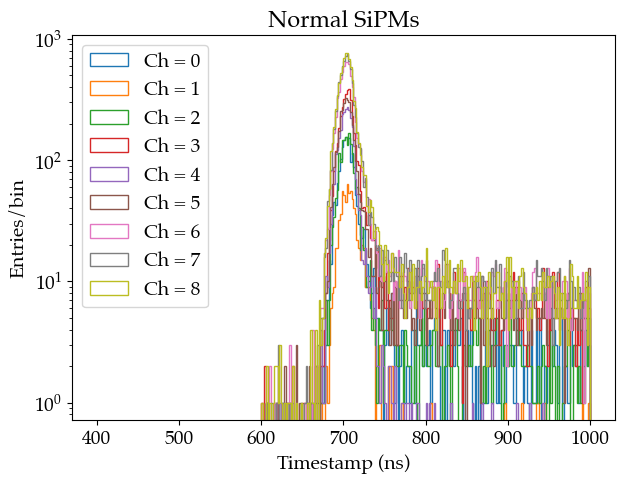

In [36]:
fig = plt.figure(figsize=(7, 5))
for ch, idx_peaks_thr_ch in enumerate(idx_peaks_thr_all):
    idx_ch = []
    for i in idx_peaks_thr_ch:
        if len(i)==0:
            continue
        if np.any(np.array(i) < 600):
            continue
        idx_ch.append(i[0])
    plt.hist(np.array(idx_ch), bins=300, range=(400, 1000), log=True, histtype='step', label=f'Ch = {ch}')
plt.title('Normal SiPMs')
plt.xlabel('Timestamp (ns)')
plt.ylabel('Entries/bin')
plt.legend()
#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/trigger_time_normal_chs.pdf', bbox_inches='tight')
plt.show()

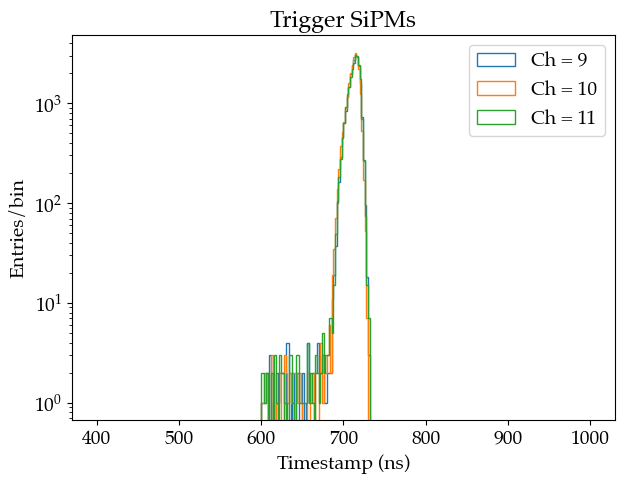

In [37]:
fig = plt.figure(figsize=(7, 5))
for ch, idx_peaks_thr_ch in enumerate(idx_peaks_thr_trigger_all):
    idx_ch = []
    for i in idx_peaks_thr_ch:
        if len(i)==0:
            continue
        if np.any(np.array(i) < 600):
            continue
        idx_ch.append(i[0])
    plt.hist(np.array(idx_ch), bins=300, range=(400, 1000), log=True, histtype='step', label=f'Ch = {ch+9}')
plt.title('Trigger SiPMs')
plt.xlabel('Timestamp (ns)')
plt.ylabel('Entries/bin')
plt.legend()
#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/trigger_time_trigger_chs.pdf', bbox_inches='tight')
plt.show()

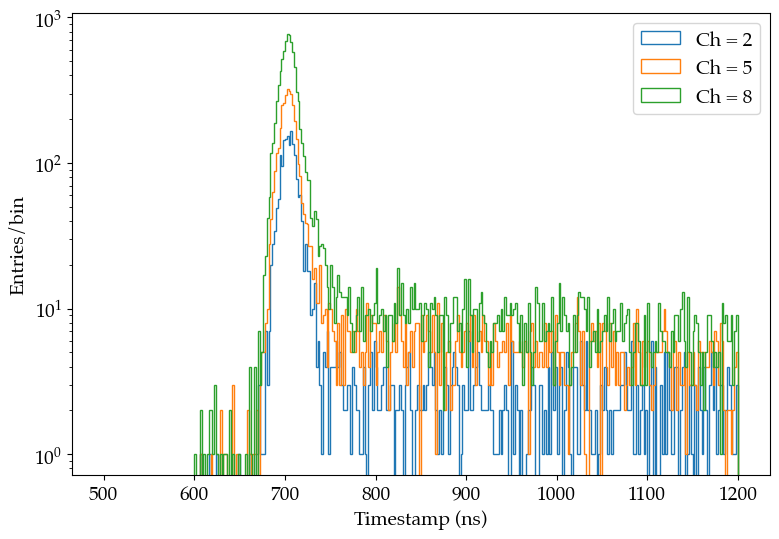

In [38]:
for ch, idx_peaks_thr_ch in enumerate(idx_peaks_thr_all):
    if ch in [2, 5, 8]:
        idx_ch = []
        for i in idx_peaks_thr_ch:
            if len(i)==0:
                continue
            if np.any(np.array(i) < 600):
                continue
            idx_ch.append(i[0])
        plt.hist(np.array(idx_ch), bins=350, range=(500, 1200), log=True, histtype='step', label=f'Ch = {ch}')
plt.xlabel('Timestamp (ns)')
plt.ylabel('Entries/bin')
plt.legend()
plt.show()

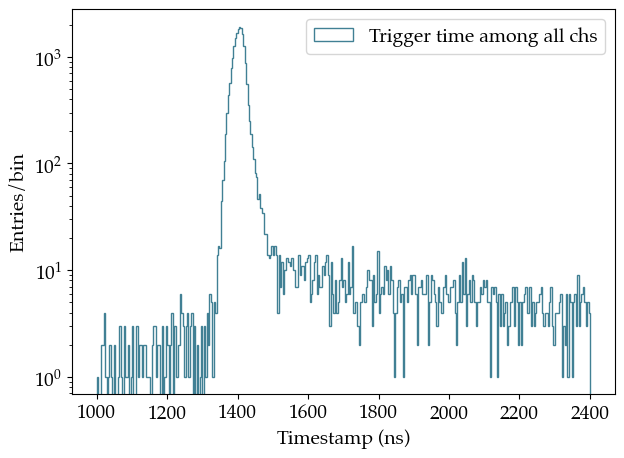

In [39]:
trigg_time = []
for el in np.array(idx_peaks_thr_all).T:
    if len(np.concatenate(el))==0:
        continue
    trigg_time.append(np.min(np.concatenate(el)))

fig = plt.figure(figsize=(7, 5))
plt.hist(np.array(trigg_time)*2, bins=350, range=(1000, 2400), log=True, histtype='step', label=f'Trigger time among all chs', color=fav_col)
plt.xlabel('Timestamp (ns)')
plt.ylabel('Entries/bin')
plt.legend()
plt.show()

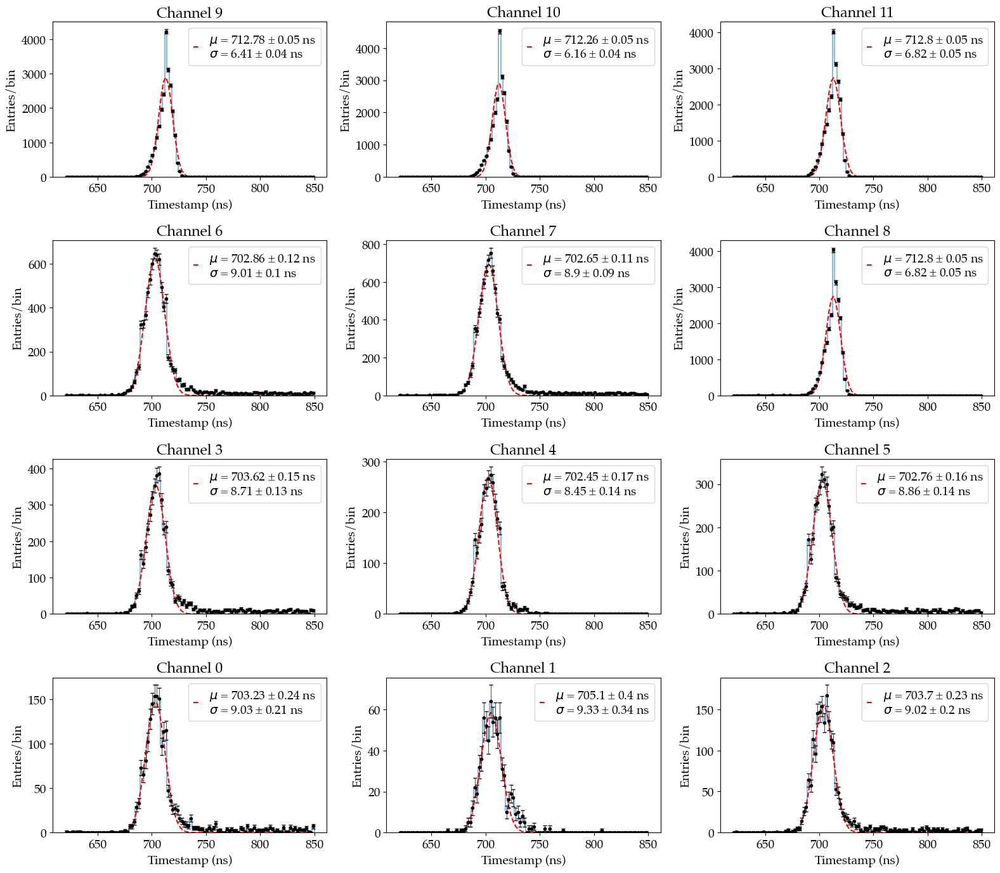

In [40]:
fig, axs = plt.subplots(4, 3, figsize=(16, 14))
for row, ich in enumerate(reversed(np.arange(0, 12, 3))):
    for col in range(3):
        ch = ich + col
        if ch<8:
            idx_peaks_sel = idx_peaks_thr_all
            j = ch
        else:
            idx_peaks_sel = idx_peaks_thr_trigger_all
            j = ch - 9
        idx_ch = []
        for i in idx_peaks_sel[j]:
            if len(i)==0:
                continue
            if np.any(np.array(i) < 600):
                continue
            idx_ch.append(i[0])
        fitf.gaussian_fit_IC_subplot(axs[row][col], np.array(idx_ch), bins=110, prange=(620, 850), ampl=1000,
                                     mean=710, sigma=30, frange=(680, 725), title=f'Channel {ch}', units='ns',
                                     xlabel='Timestamp (ns)', print_chi2=False)
plt.tight_layout()
#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/trigger_time_fit_all.pdf', bbox_inches='tight')
plt.show()

(702.9409717408082,
 0.0485920139235509,
 8.89959108803723,
 0.0410153428222284,
 20.958537012327678,
 0.09659113234634788,
 35.65465627302419)

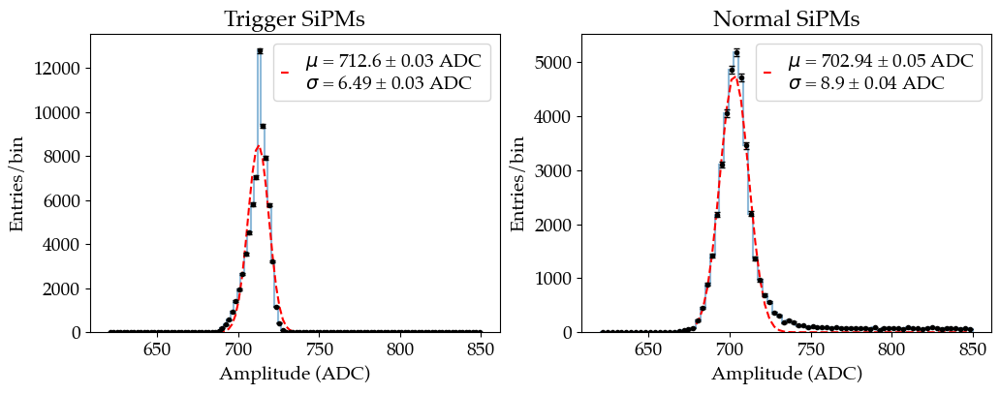

In [41]:
all_idx_ch = []
for j, idx_peaks_thr_ch in enumerate(idx_peaks_thr_all):
    for i in idx_peaks_thr_ch:
        if len(i)==0:
            continue
        if np.any(np.array(i) < 600):
            continue
        all_idx_ch.append(i[0])

all_idx_ch_trigger = []
for j, idx_peaks_thr_ch in enumerate(idx_peaks_thr_trigger_all):
    for i in idx_peaks_thr_ch:
        if len(i)==0:
            continue
        if np.any(np.array(i) < 600):
            continue
        all_idx_ch_trigger.append(i[0])
        
fig, axs = plt.subplots(1, 2, figsize=(12, 4))
fitf.gaussian_fit_IC_subplot(axs[0], np.array(all_idx_ch_trigger), bins=110, prange=(620, 850), ampl=1000, mean=710, sigma=30,
                             frange=(680, 725), title=f'Trigger SiPMs', print_chi2=False)
fitf.gaussian_fit_IC_subplot(axs[1], np.array(all_idx_ch), bins=78, prange=(620, 850), ampl=1000, mean=710, sigma=30,
                             frange=(680, 725), title=f'Normal SiPMs', print_chi2=False)
#fig.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/trigger_time_fit_trigger_and_regular.pdf', bbox_inches='tight')

In [42]:
idx_peaks_thr_all_corr = []
for el in np.array(idx_peaks_thr_all).T:
    print(el)
    if len(np.concatenate(el))==0:
        idx_peaks_thr_all_corr.append(el)
        continue
    idx_peaks_thr_all_corr.append(el+(750 - np.min(np.concatenate(el))))
    
idx_peaks_thr_all_corr = np.array(idx_peaks_thr_all_corr).T

[array([], dtype=float64) array([], dtype=float64)
 array([], dtype=float64) array([], dtype=float64)
 array([], dtype=float64) array([691.]) array([ 695., 2809.])
 array([], dtype=float64) array([ 699., 4761.])]
[array([], dtype=float64) array([], dtype=float64) array([3876.])
 array([689.]) array([], dtype=float64) array([], dtype=float64)
 array([], dtype=float64) array([ 689., 6784., 6869.])
 array([], dtype=float64)]
[array([], dtype=float64) array([], dtype=float64)
 array([], dtype=float64) array([719.]) array([], dtype=float64)
 array([ 837., 3452.]) array([5021.]) array([720., 839.]) array([829.])]
[array([], dtype=float64) array([], dtype=float64)
 array([], dtype=float64) array([], dtype=float64)
 array([], dtype=float64) array([], dtype=float64)
 array([], dtype=float64) array([3395., 5171.]) array([4263.])]
[array([710.]) array([], dtype=float64) array([], dtype=float64)
 array([2342.]) array([], dtype=float64) array([710.]) array([696.])
 array([], dtype=float64) array([]

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



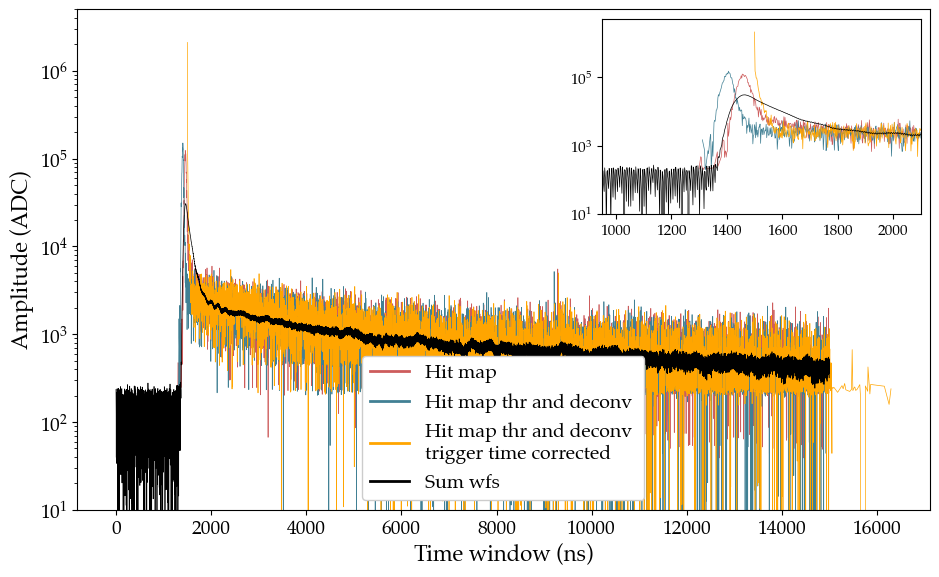

In [43]:
timestamps  = 2*idx_peaks_no_bef_trigg_time_conc    ### np.concatenate(idx_peaks_ch)*2
amplitudes  = height_peaks_no_bef_trigg_time_conc   ### np.concatenate(height_peaks_ch)
timestamps2 = 2*idx_peaks_no_bef_trigg_time_conc2   ### np.concatenate(idx_peaks_thr_ch)*2
amplitudes2 = height_peaks_no_bef_trigg_time_conc2  ### np.concatenate(height_peaks_deconv_ch)
timestamps3 = 2*np.concatenate(idx_peaks_thr_all_corr[8])   ### np.concatenate(idx_peaks_thr_all_corr)*2
amplitudes3 = np.concatenate(height_peaks_deconv_all[8])

sum_amplitudes  = [np.sum(amplitudes [timestamps  == timestamp ]) for timestamp  in np.unique(timestamps)]
sum_amplitudes2 = [np.sum(amplitudes2[timestamps2 == timestamp2]) for timestamp2 in np.unique(timestamps2)]
sum_amplitudes3 = [np.sum(amplitudes3[timestamps3 == timestamp3]) for timestamp3 in np.unique(timestamps3)]

fig = plt.figure(figsize=(11, 6.5))
plt.plot(np.unique(timestamps),  sum_amplitudes,    linewidth=0.5, label='Hit map',                color='indianred')
plt.plot(np.unique(timestamps2), sum_amplitudes2,   linewidth=0.5, label='Hit map thr and deconv', color=fav_col)
plt.plot(np.unique(timestamps3), sum_amplitudes3,   linewidth=0.5, label='Hit map thr and deconv \ntrigger time corrected',            color='orange')
plt.plot(2*np.arange(len(sum_wfs)), sum_wfs/80, linewidth=0.5, label='Sum wfs', color='k')

plt.xlabel('Time window (ns)', fontsize=16)
plt.ylabel('Amplitude (ADC)',  fontsize=16)
plt.ylim(1e1, 5e6)
plt.yscale('log')
leg = plt.legend(loc='lower center', framealpha=1, fontsize=14)
for line in leg.get_lines():
    line.set_linewidth(2)
    
ax_inset = fig.add_axes([0.602, 0.565, 0.29, 0.30])
ax_inset.plot(np.unique(timestamps),  sum_amplitudes,  linewidth=0.5, color='indianred')
ax_inset.plot(np.unique(timestamps2), sum_amplitudes2, linewidth=0.5, color=fav_col)
ax_inset.plot(np.unique(timestamps3), sum_amplitudes3, linewidth=0.5, color='orange')
ax_inset.plot(2*np.arange(len(sum_wfs)), sum_wfs/80, linewidth=0.5, color='k')
ax_inset.set_xlim(950, 2100)
ax_inset.set_ylim(1e1, 5e6)
ax_inset.set_yscale('log')
ax_inset.tick_params(axis='x', labelsize=11)
ax_inset.tick_params(axis='y', labelsize=11)

#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/hit_map_and_summed_wfs_norm.pdf', bbox_inches='tight')
plt.show()

#### Make previous plot for all channels:

In [44]:
def get_conc_idx_and_height(indexes, heights):
    idx_c    = np.array([])
    height_c = np.array([])
    for i, j in zip(indexes, heights):
        if len(i)==0:
            continue
        if np.any(np.array(i) < 650):
            continue
        for ii,jj in zip(i,j):
            idx_c    = np.append(idx_c   , ii)
            height_c = np.append(height_c, jj)
            
    return idx_c, height_c

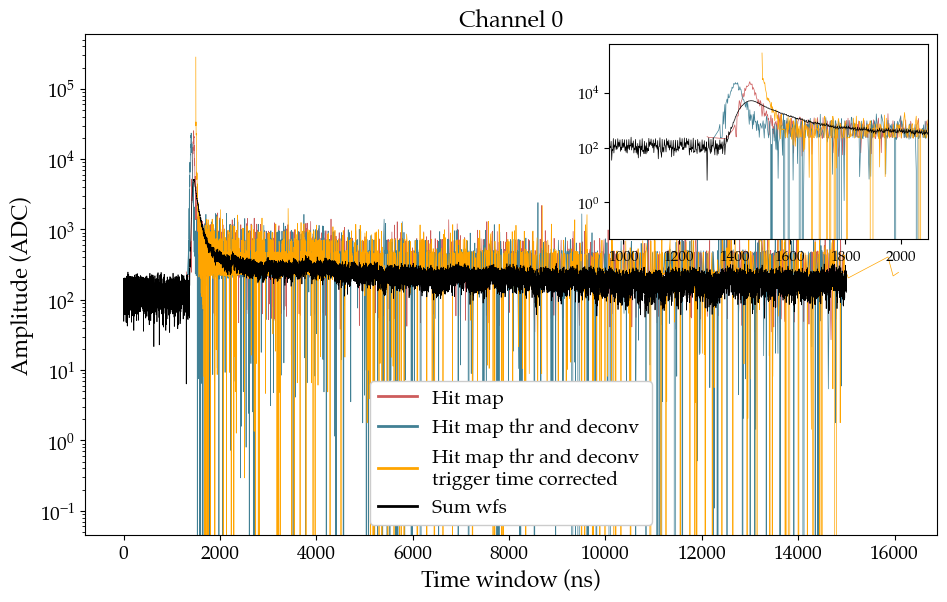

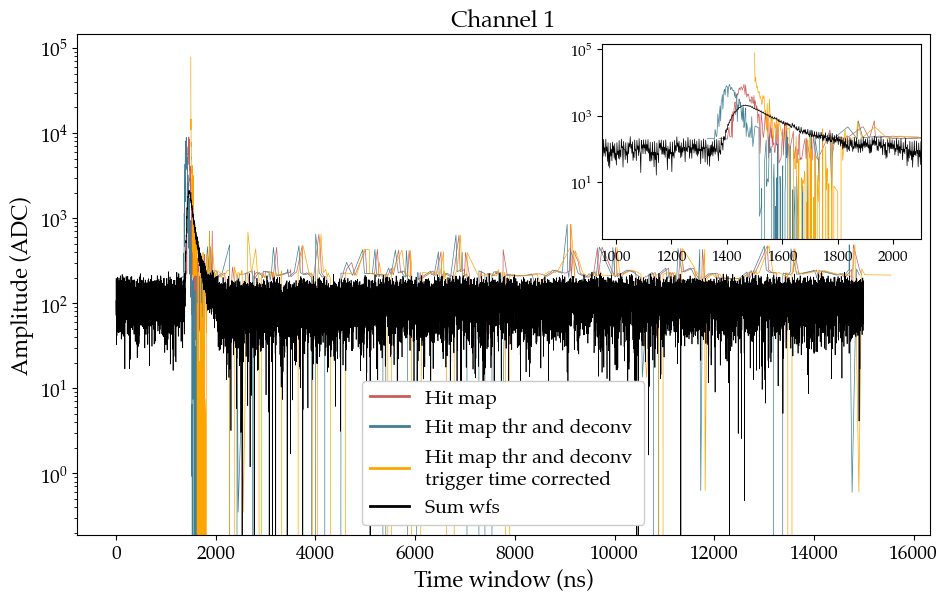

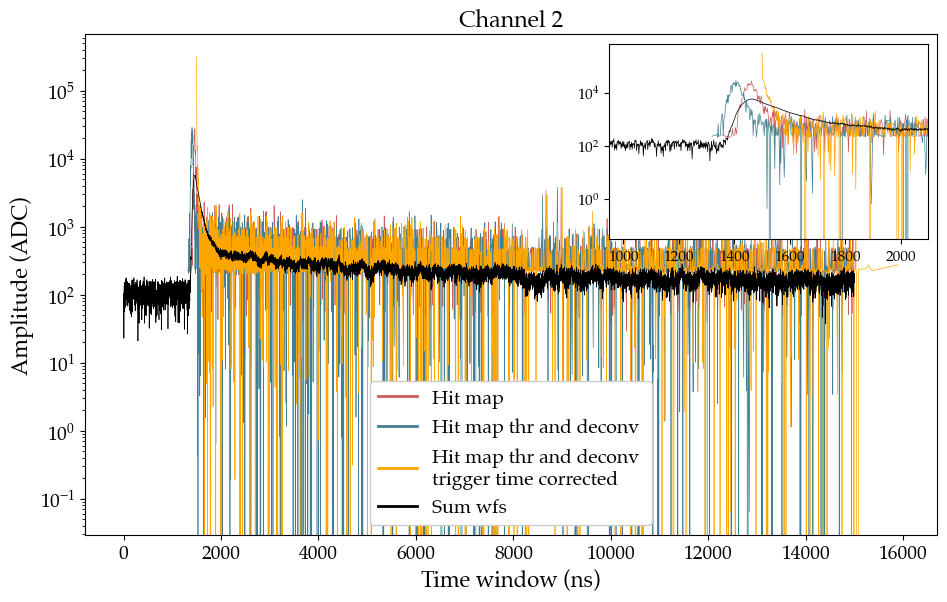

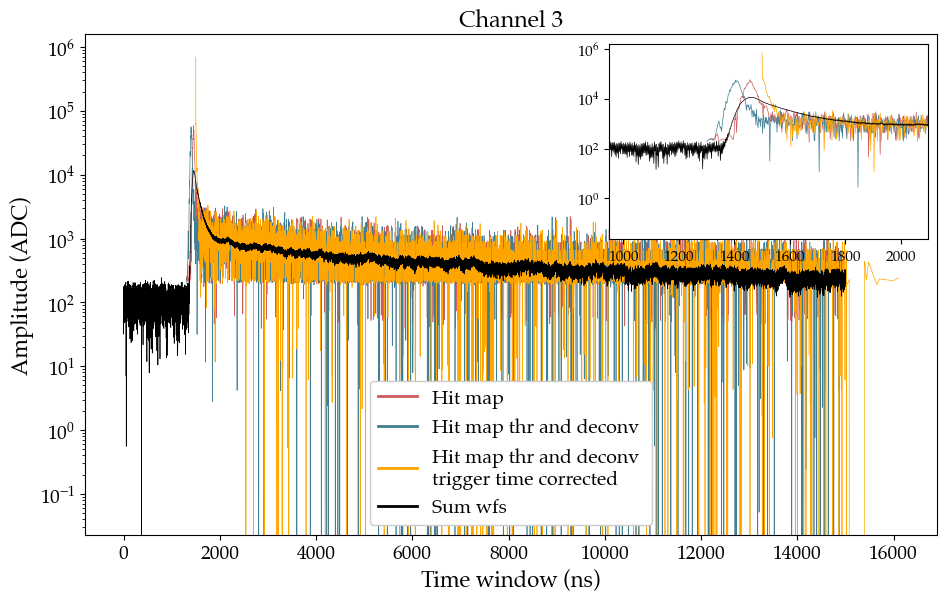

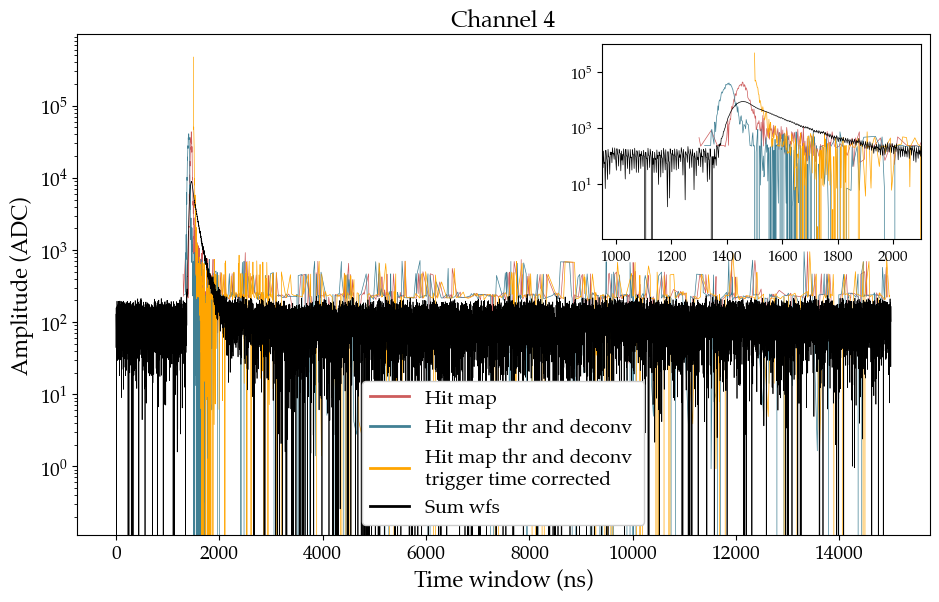

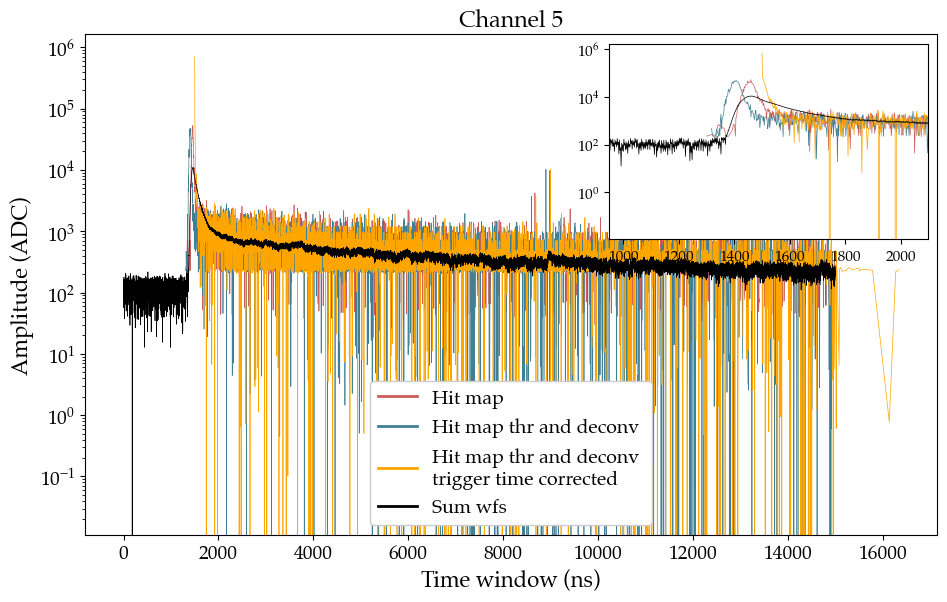

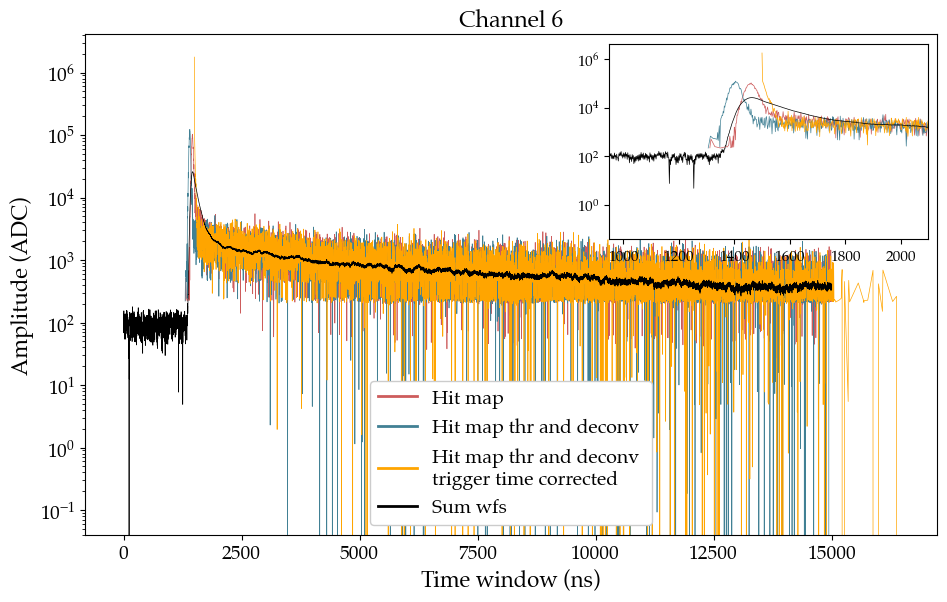

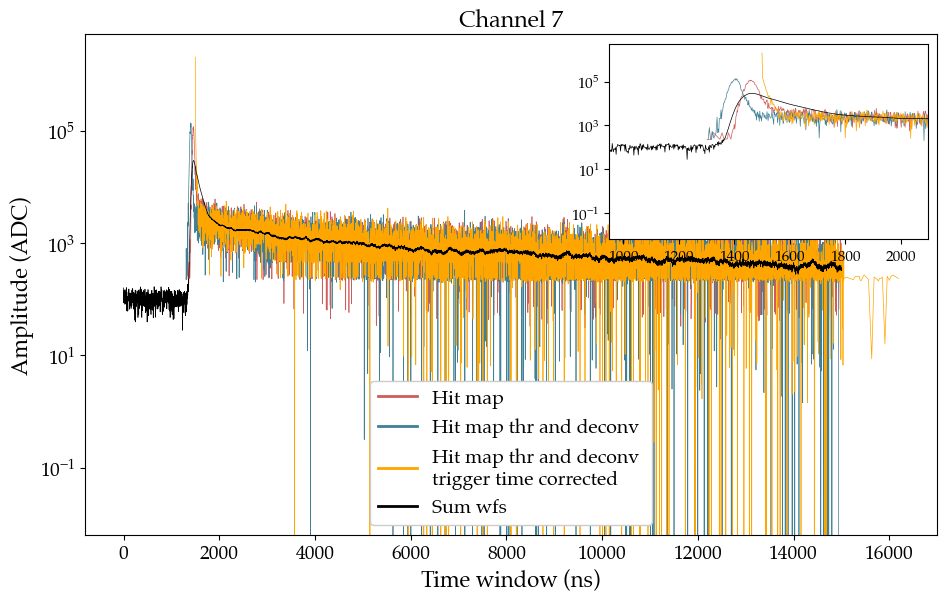

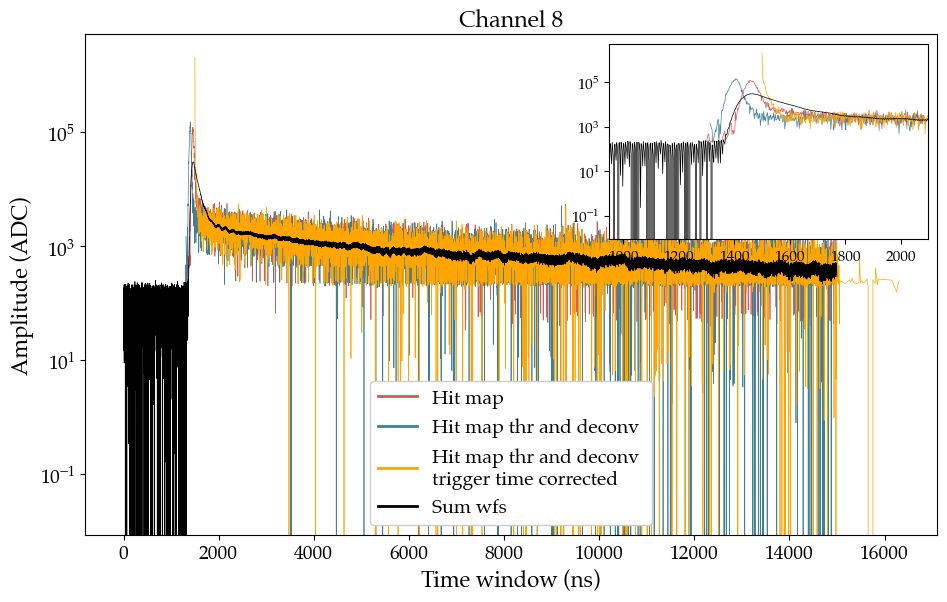

In [45]:
for ch in range(9):
    wfs          = np.array(RawTree[f'chan{ch}/rdigi'].array())
    wfs_rem_bckg = np.array([wf for wf in wfs if np.std(wf[:wf_range_bsl])<15])
    s_wfs        = pf.subtract_baseline(wfs_rem_bckg, mode=True, wf_range_bsl=(0, 650))
    sum_wfs      = np.sum(s_wfs, axis=0)
            
    timestamps0, amplitudes0 = get_conc_idx_and_height(idx_peaks_ch_all[ch], height_peaks_ch_all[ch])
    timestamps1, amplitudes1 = get_conc_idx_and_height(idx_peaks_thr_all[ch], height_peaks_deconv_all[ch])
    timestamps2, amplitudes2 = 2*np.concatenate(idx_peaks_thr_all_corr[ch]), np.concatenate(height_peaks_deconv_all[ch])
    
    sum_amplitudes0 = [np.sum(amplitudes0[timestamps0 == timestamp]) for timestamp in np.unique(timestamps0)]
    sum_amplitudes1 = [np.sum(amplitudes1[timestamps1 == timestamp]) for timestamp in np.unique(timestamps1)]
    sum_amplitudes2 = [np.sum(amplitudes2[timestamps2 == timestamp]) for timestamp in np.unique(timestamps2)]
    
    fig = plt.figure(figsize=(11, 6.5))
    plt.plot(np.unique(timestamps0)*2, sum_amplitudes0, linewidth=0.5, label='Hit map',                color='indianred')
    plt.plot(np.unique(timestamps1)*2, sum_amplitudes1, linewidth=0.5, label='Hit map thr and deconv', color=fav_col)
    plt.plot(np.unique(timestamps2),   sum_amplitudes2, linewidth=0.5, label='Hit map thr and deconv \ntrigger time corrected', color='orange')
    plt.plot(2*np.arange(len(sum_wfs)), sum_wfs/80,   linewidth=0.5, label='Sum wfs', color='k')
    
    plt.xlabel('Time window (ns)', fontsize=16)
    plt.ylabel('Amplitude (ADC)',  fontsize=16)
    plt.title(f'Channel {ch}')
    plt.yscale('log')
    leg = plt.legend(loc='lower center', framealpha=1, fontsize=14)
    for line in leg.get_lines():
        line.set_linewidth(2)
        
    ax_inset = fig.add_axes([0.602, 0.565, 0.29, 0.30])
    ax_inset.plot(np.unique(timestamps0)*2, sum_amplitudes0,  linewidth=0.5, color='indianred')
    ax_inset.plot(np.unique(timestamps1)*2, sum_amplitudes1, linewidth=0.5, color=fav_col)
    ax_inset.plot(np.unique(timestamps2),   sum_amplitudes2, linewidth=0.5, color='orange')
    ax_inset.plot(2*np.arange(len(sum_wfs)), sum_wfs/80, linewidth=0.5, color='k')
    ax_inset.set_xlim(950, 2100)
    ax_inset.set_yscale('log')
    ax_inset.tick_params(axis='x', labelsize=11)
    ax_inset.tick_params(axis='y', labelsize=11)
    
    #plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/hit_map_and_summed_wfs_norm.pdf', bbox_inches='tight')
    plt.show()

In [46]:
idx_peaks_thr_no_bef_trig_t = np.array([])
for i in idx_peaks_thr_ch:
    if len(i)==0:
        continue
    if np.any(np.array(i) < 600):
        continue
    idx_peaks_thr_no_bef_trig_t = np.append(idx_peaks_thr_no_bef_trig_t, i[0])

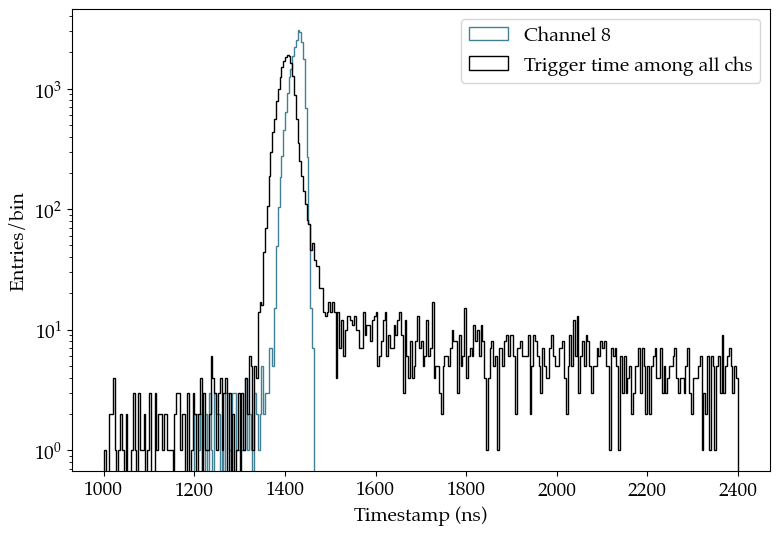

In [47]:
plt.hist(idx_peaks_thr_no_bef_trig_t*2, bins=350, range=(1000, 2400), log=True, histtype='step', label='Channel 8', color=fav_col)
plt.hist(np.array(trigg_time)*2,        bins=350, range=(1000, 2400), log=True, histtype='step', label=f'Trigger time among all chs', color='k')
plt.xlabel('Timestamp (ns)')
plt.ylabel('Entries/bin')
plt.legend()
plt.show()

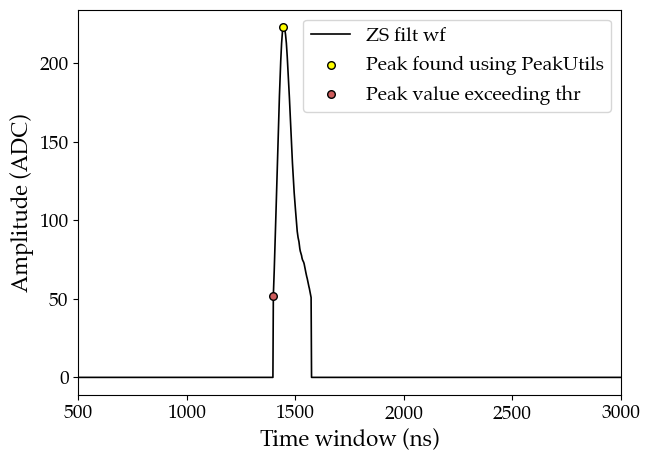

In [48]:
sel_ch        = 8
one_wf_ch     = np.array(RawTree[f'chan{sel_ch}/rdigi'].array())[0]
subt_wf_ch    = pf.subtract_baseline(one_wf_ch, mode=True, wf_range_bsl=(0, 650))
filt_swf_ch   = savgol_filter(subt_wf_ch, window_length=50, polyorder=3)
zs_filt_wf    = pf.noise_suppression(filt_swf_ch, threshold=50)
idx_peaks     = pf.get_peaks_peakutils(zs_filt_wf, thres=50, min_dist=50, thres_abs=True)
idx_peaks_thr = pf.get_values_thr_from_zswf(zs_filt_wf, idx_peaks)
idx_peaks_thr = idx_peaks_thr.astype(int)

plt.figure(figsize=(7, 5))
plt.plot(2*np.arange(len(zs_filt_wf)),  zs_filt_wf,  linewidth=1.2, color='k', label='ZS filt wf')
plt.scatter(2*idx_peaks,     zs_filt_wf[idx_peaks],     color='yellow',    edgecolors='black', marker='o', s=30, zorder=2, label=f'Peak found using PeakUtils')
plt.scatter(2*idx_peaks_thr, zs_filt_wf[idx_peaks_thr], color='indianred', edgecolors='black', marker='o', s=30, zorder=2, label=f'Peak value exceeding thr')
#plt.axhline(y=50, color='indianred', label='thr = 50 ADC')
plt.xlabel('Time window (ns)', fontsize=16)
plt.ylabel('Amplitude (ADC)',  fontsize=16)
plt.xlim(500, 3000)
plt.legend()
#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/ZS_peak_waveform_thr.pdf', bbox_inches='tight')
plt.show()

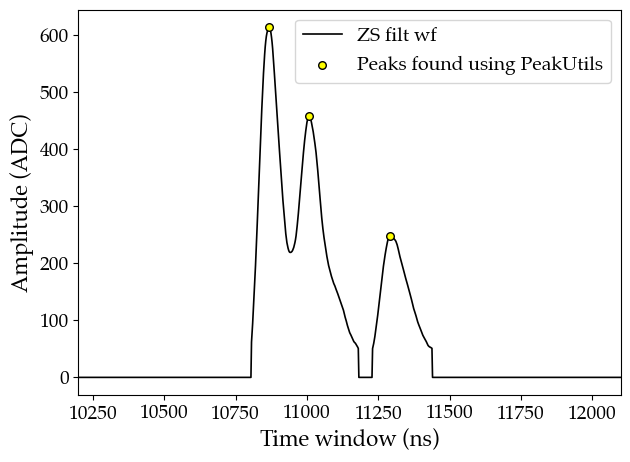

In [49]:
sel_ch        = 8
one_wf_ch     = np.array(RawTree[f'chan{sel_ch}/rdigi'].array())[37]
subt_wf_ch    = pf.subtract_baseline(one_wf_ch, mode=True, wf_range_bsl=(0, 650))
filt_swf_ch   = savgol_filter(subt_wf_ch, window_length=50, polyorder=3)
zs_filt_wf    = pf.noise_suppression(filt_swf_ch, threshold=50)
idx_peaks     = pf.get_peaks_peakutils(zs_filt_wf, thres=50, min_dist=50, thres_abs=True)
idx_peaks_thr = pf.get_values_thr_from_zswf(zs_filt_wf, idx_peaks)
idx_peaks_thr = idx_peaks_thr.astype(int)

plt.figure(figsize=(7, 5))
plt.plot(2*np.arange(len(zs_filt_wf)),  zs_filt_wf,  linewidth=1.2, color='k', label='ZS filt wf')
plt.scatter(2*idx_peaks,     zs_filt_wf[idx_peaks],     color='yellow',    edgecolors='black', marker='o', s=30, zorder=2, label=f'Peaks found using PeakUtils')
#plt.scatter(2*idx_peaks_thr, zs_filt_wf[idx_peaks_thr], color='indianred', edgecolors='black', marker='o', s=30, zorder=2, label=f'Peak value exceeding thr')
#plt.axhline(y=50, color='indianred', label='thr = 50 ADC')
plt.xlabel('Time window (ns)', fontsize=16)
plt.ylabel('Amplitude (ADC)',  fontsize=16)
plt.xlim(10200, 12100)
plt.legend()
#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/ZS_peak_waveform_2nd_peak_minus_1st.pdf', bbox_inches='tight')
plt.show()

### Sum of all the events in a file

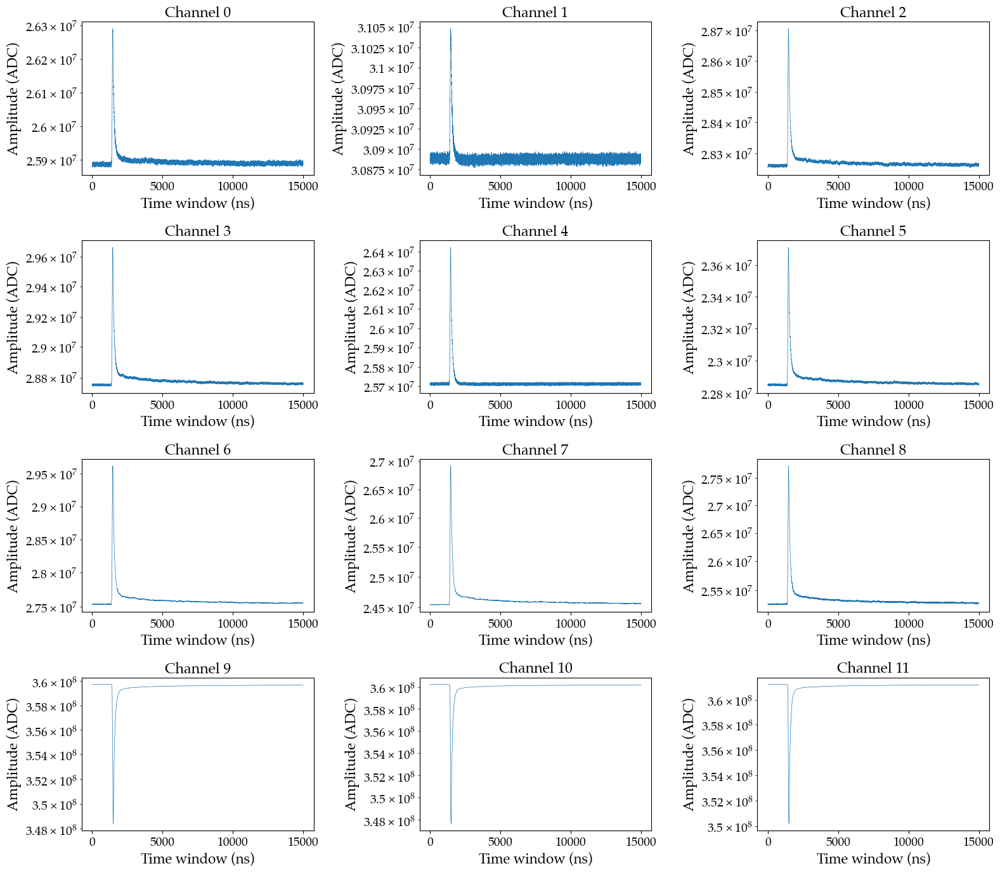

In [50]:
fig, axs = plt.subplots(4, 3, figsize=(16, 14))
for k in range(12):
    i = int(k/3)
    j = k%3
    sum_wf = np.sum(np.array(RawTree[f'chan{k}/rdigi'].array()), axis=0)
    axs[i][j].plot(2*np.arange(len(sum_wf)), sum_wf, linewidth=0.5)
    axs[i][j].set_xlabel('Time window (ns)', fontsize=16)
    axs[i][j].set_ylabel('Amplitude (ADC)', fontsize=16)
    axs[i][j].set_title(f"Channel {k}")
    axs[i][j].set_yscale('log')
plt.tight_layout()
plt.show()

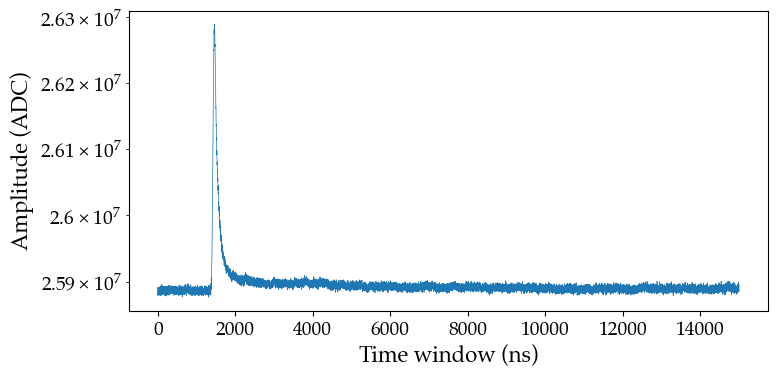

In [51]:
fig, ax = plt.subplots(1, 1, figsize=(8, 4))
sum_wf = np.sum(np.array(RawTree[f'chan0/rdigi'].array()), axis=0)
ax.plot(2*np.arange(len(sum_wf)), sum_wf, linewidth=0.5)
ax.set_xlabel('Time window (ns)', fontsize=16)
ax.set_ylabel('Amplitude (ADC)', fontsize=16)
ax.set_yscale('log')
plt.tight_layout()
plt.show()

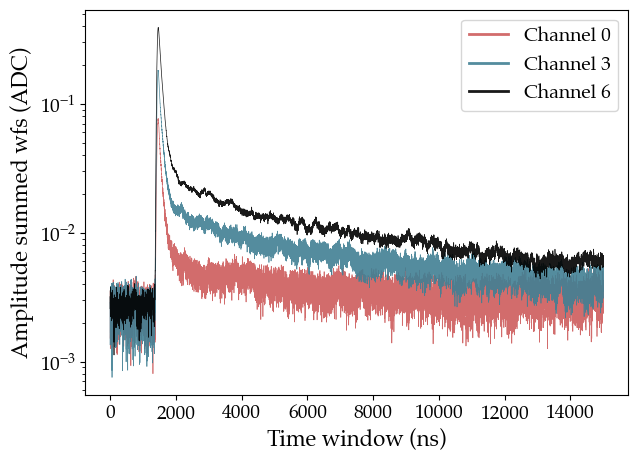

In [52]:
plt.figure(figsize=(7, 5))
gains036 = [228.9358, 215.3758, 226.9014]
for channel, col, gain in zip([0, 3, 6], ['indianred', fav_col, 'k'], gains036):
    all_wfs = np.array(RawTree[f'chan{channel}/rdigi'].array())
    subt_wf = pf.subtract_baseline(all_wfs, mode=True, wf_range_bsl=(0, 500))
    sum_wf  = np.sum(subt_wf, axis=0)
    plt.plot(2*np.arange(len(sum_wf)), sum_wf/(len(subt_wf)*gain), linewidth=0.5, label=f'Channel {channel}', color=col, alpha=0.9)
plt.xlabel('Time window (ns)', fontsize=16)
plt.ylabel('Amplitude summed wfs (ADC)', fontsize=16)
plt.yscale('log')
leg = plt.legend()
for line in leg.get_lines():
    line.set_linewidth(2)
#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/summed_wfs_example_norm_gain_and_evts.pdf', bbox_inches='tight')
plt.show()

23655 23466 189
All evts
Remove bckg


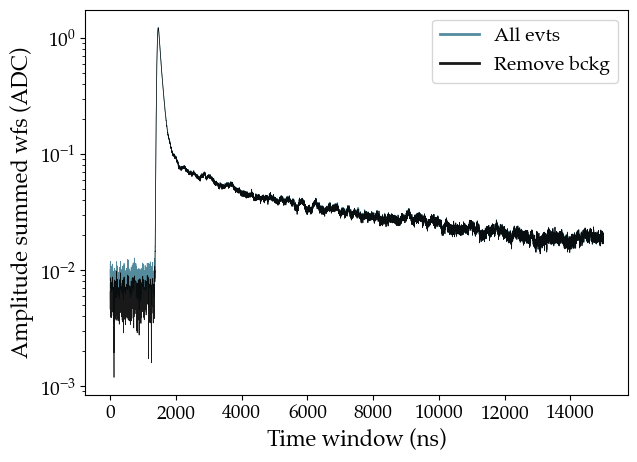

In [53]:
## Compare the sum of waveforms before and after removing bckg wfs
plt.figure(figsize=(7, 5))
channel           = 6
gain0             = gains036[2]
all_wfs           = np.array(RawTree[f'chan{channel}/rdigi'].array())
all_wfs_rem_bckg  = np.array([wf for wf in all_wfs if np.std(wf[:wf_range_bsl])<15])
all_wfs_removed   = np.array([wf for wf in all_wfs if np.std(wf[:wf_range_bsl])>=15])
print(len(all_wfs), len(all_wfs_rem_bckg), len(all_wfs_removed))
for set_wfs, lab, col in zip([all_wfs, all_wfs_rem_bckg], ['All evts', 'Remove bckg'], [fav_col, 'k']):
    print(lab)
    subt_wfs = pf.subtract_baseline(set_wfs, mode=True, wf_range_bsl=(0, 500))
    sum_wfs  = np.sum(subt_wfs, axis=0)
    plt.plot(2*np.arange(len(sum_wfs)), sum_wfs/(len(sum_wfs)*gain0), linewidth=0.5, label=lab, color=col, alpha=0.9)
plt.xlabel('Time window (ns)', fontsize=16)
plt.ylabel('Amplitude summed wfs (ADC)', fontsize=16)
#plt.title(f"Sum of wfs (after bsl subtraction)")
plt.yscale('log')
leg = plt.legend()
for line in leg.get_lines():
    line.set_linewidth(2)
#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/summed_wfs_example_norm_gain_and_evts.pdf', bbox_inches='tight')
plt.show()

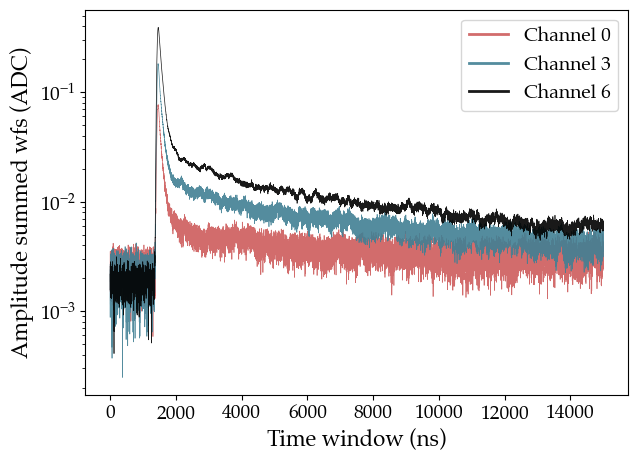

In [54]:
### Sum the previous wfs but rejecting the waveforms with signal before the trigger time
plt.figure(figsize=(7, 5))
for channel, col, gain in zip([0, 3, 6], ['indianred', fav_col, 'k'], [228.9358, 215.3758, 226.9014]):
    all_wfs = np.array(RawTree[f'chan{channel}/rdigi'].array())
    all_wfs = np.array([wf for wf in all_wfs if np.std(wf[:wf_range_bsl])<20])
    subt_wf = pf.subtract_baseline(all_wfs, mode=True, wf_range_bsl=(0, 500))
    sum_wf  = np.sum(subt_wf, axis=0)
    plt.plot(2*np.arange(len(sum_wf)), sum_wf/(len(subt_wf)*gain), linewidth=0.5, label=f'Channel {channel}', color=col, alpha=0.9)
plt.xlabel('Time window (ns)', fontsize=16)
plt.ylabel('Amplitude summed wfs (ADC)', fontsize=16)
#plt.title(f"Sum of wfs (after bsl subtraction)")
plt.yscale('log')
leg = plt.legend()
for line in leg.get_lines():
    line.set_linewidth(2)
#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/summed_wfs_example_norm_gain_and_evts.pdf', bbox_inches='tight')
plt.show()

## Take a look at the file from Dec 28th to compare with Michael:

In [55]:
filename2 = '/Users/romoluque_c/LEGEND/BACON/datatest/run-12_28_2023-file.root'
infile2   = uproot.open(filename2)
RawTree2  = infile2['RawTree']

max_smpl_bsl        = 650
std_bsl_thr         = 15
sg_filter_window    = 50
sg_filter_polyorder = 3
thr_ADC             = 50 #ths for the noise suppression and peak finder after SG filter
min_dist            = 50 #min distance between peaks for peakutils

#normal_chs  = range(9) Channel 5 is dead
normal_chs  = [0, 1, 2, 3, 4, 6, 7, 8]
trigger_chs = [9, 10, 11]

In [56]:
subt_wfs_dict = {ch: pf.subtract_baseline(pf.wfs_from_rawtree(RawTree2, ch),
                                          mode=True,
                                          wf_range_bsl=(0, max_smpl_bsl))
                 for ch in normal_chs}

trigg_cwfs_dict = {ch: np.array([blr.pmt_deconvolver(wf, wf_range_bsl=(0, max_smpl_bsl))
                                 for wf in pf.wfs_from_rawtree(RawTree2, ch)])
                   for ch in trigger_chs}

sg_filt_swfs_dict = {ch: savgol_filter(subt_wfs_dict[ch],
                                       window_length=sg_filter_window,
                                       polyorder=sg_filter_polyorder)
                     for ch in normal_chs}

sg_filt_trigg_dict = {ch: savgol_filter(trigg_cwfs_dict[ch],
                                        window_length=sg_filter_window,
                                        polyorder=sg_filter_polyorder)
                      for ch in trigger_chs}

In [57]:
## Gains for Dec 28th
gains_normal_ch = np.array([226.00663934, 206.7871513 , 221.07788724, 211.56947489,
                            224.78729245, 227.41737901, 221.73063328, 226.28395664, 220.30802631])
gains_trigger_ch = np.array([629.47493763, 622.0613109,  583.77952534])

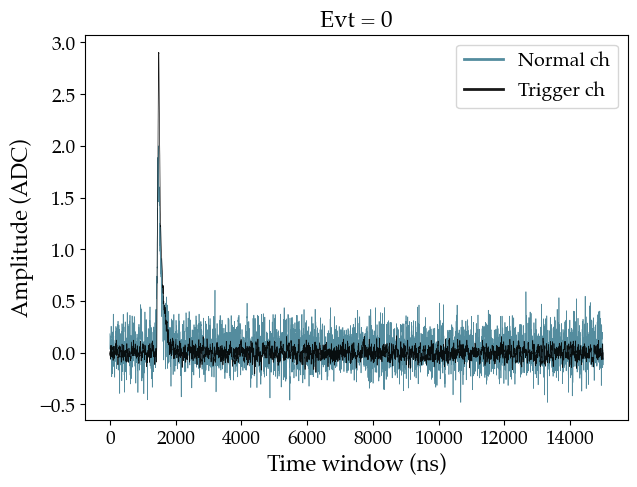

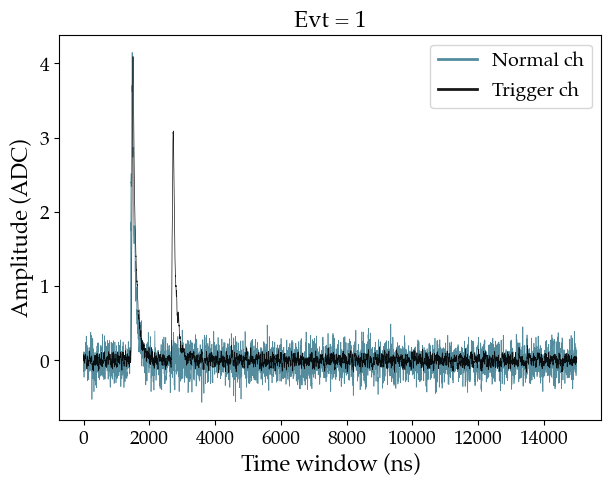

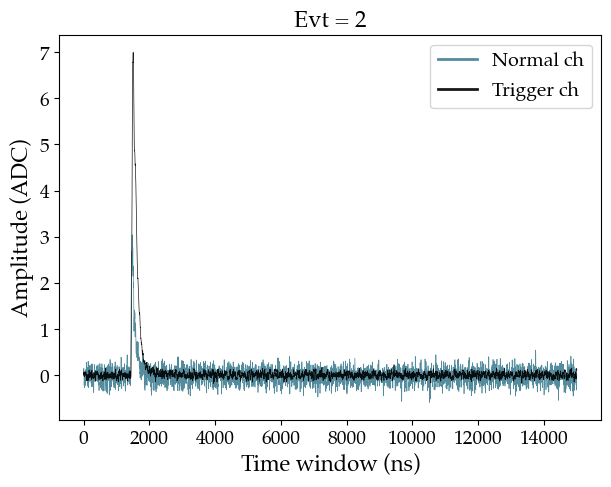

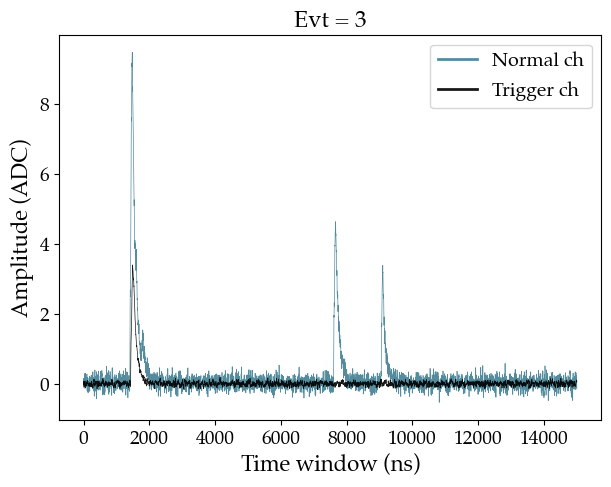

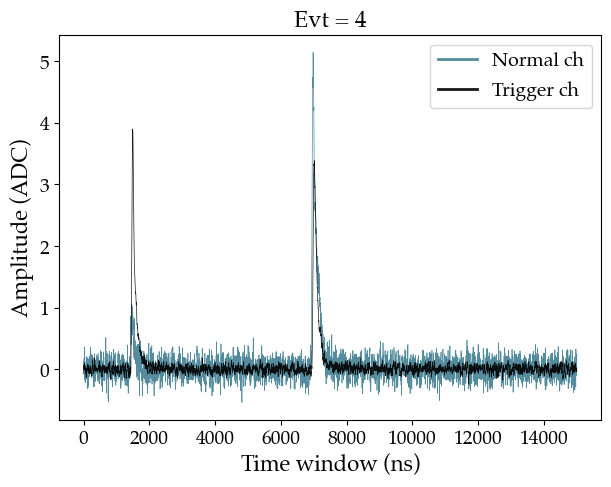

...

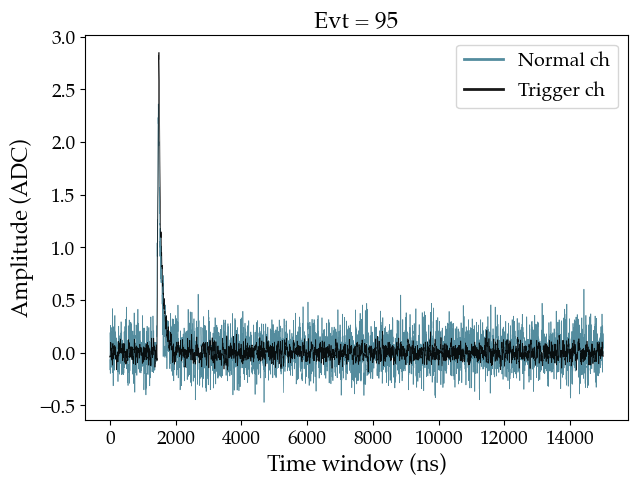

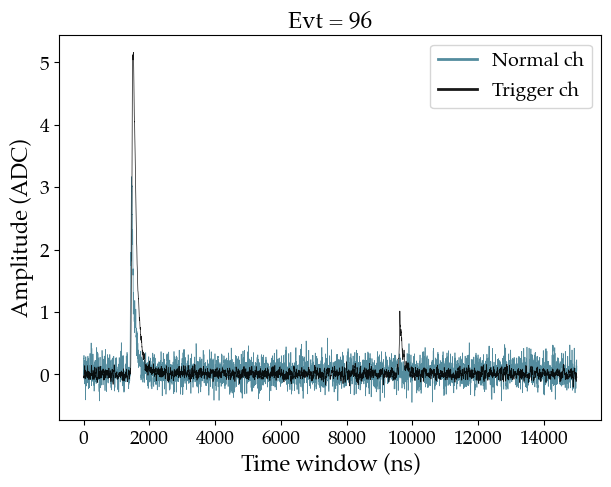

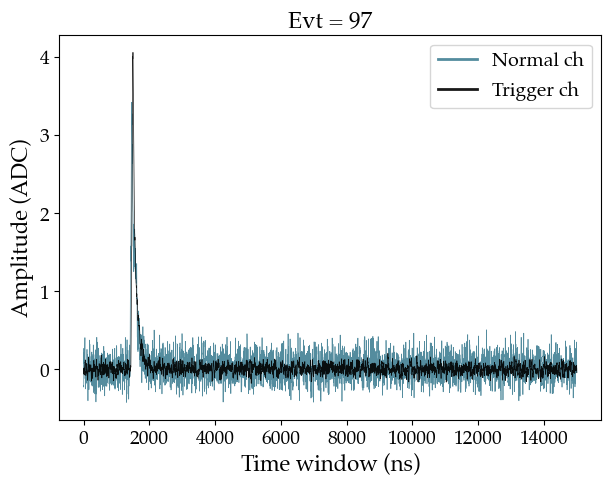

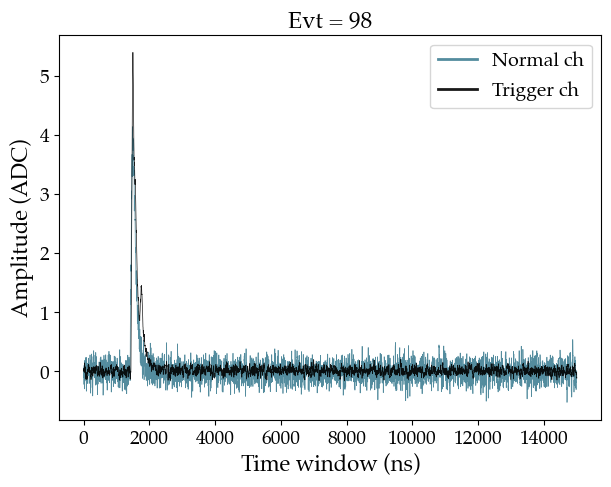

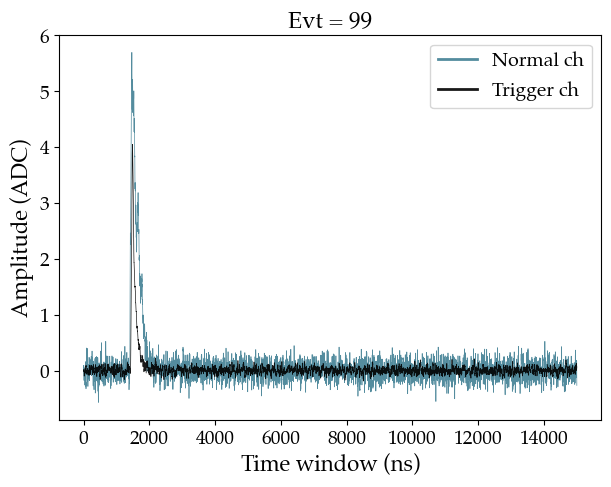

In [59]:
for evt in range(100):
    plt.figure(figsize=(7, 5))
    sum_normal_ch  = np.sum([subt_wfs_dict  [ch][evt]/g for ch,g in zip(normal_chs,  gains_normal_ch)],  axis=0)
    sum_trigger_ch = np.sum([trigg_cwfs_dict[ch][evt]/g for ch,g in zip(trigger_chs, gains_trigger_ch)], axis=0)
    #plt.plot(2*np.arange(len(sum_normal_ch)), sum_normal_ch+sum_trigger_ch, linewidth=0.5, label=f'Channel {ch}', color=fav_col, alpha=0.9)
    plt.plot(2*np.arange(len(sum_normal_ch)),  sum_normal_ch,  linewidth=0.5, color=fav_col, alpha=0.9, label='Normal ch')
    plt.plot(2*np.arange(len(sum_trigger_ch)), sum_trigger_ch, linewidth=0.5, color='k',     alpha=0.9, label='Trigger ch')
    plt.xlabel('Time window (ns)', fontsize=16)
    plt.ylabel('Amplitude (ADC)',  fontsize=16)
    plt.title(f'Evt = {evt}')
    leg = plt.legend()
    for line in leg.get_lines():
        line.set_linewidth(2)

    plt.show()

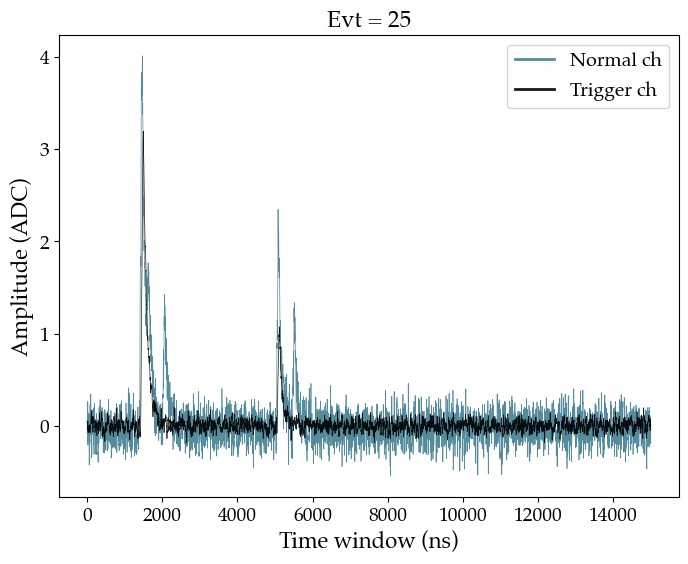

In [60]:
evt = 25
plt.figure(figsize=(8, 6))
sum_normal_ch  = np.sum([subt_wfs_dict  [ch][evt]/g for ch,g in zip(normal_chs,  gains_normal_ch)],  axis=0)
sum_trigger_ch = np.sum([trigg_cwfs_dict[ch][evt]/g for ch,g in zip(trigger_chs, gains_trigger_ch)], axis=0)
#plt.plot(2*np.arange(len(sum_normal_ch)), sum_normal_ch+sum_trigger_ch, linewidth=0.5, label=f'Channel {ch}', color=fav_col, alpha=0.9)
plt.plot(2*np.arange(len(sum_normal_ch)),  sum_normal_ch,  linewidth=0.5, color=fav_col, alpha=0.9, label='Normal ch')
plt.plot(2*np.arange(len(sum_trigger_ch)), sum_trigger_ch, linewidth=0.5, color='k',     alpha=0.9, label='Trigger ch')
plt.xlabel('Time window (ns)', fontsize=16)
plt.ylabel('Amplitude (ADC)',  fontsize=16)
plt.title(f'Evt = {evt}')
leg = plt.legend()
for line in leg.get_lines():
    line.set_linewidth(2)

plt.show()

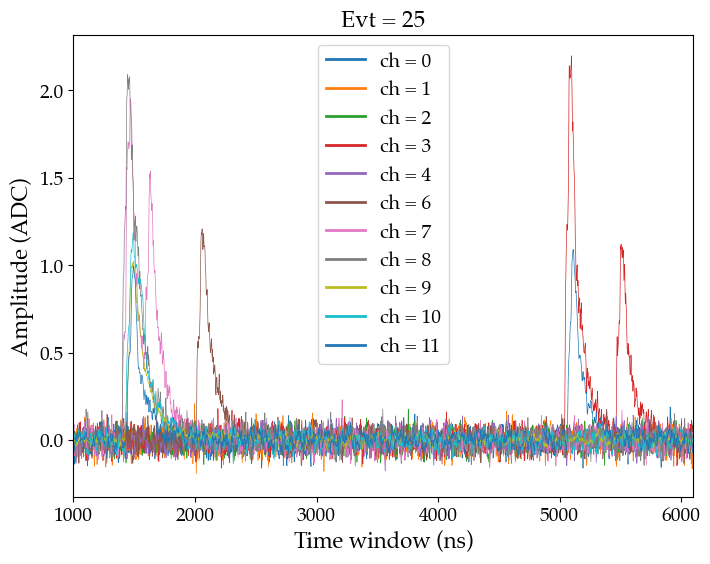

In [61]:
evt = 25
plt.figure(figsize=(8, 6))
for ch,g in zip(normal_chs, gains_normal_ch):
    wf = subt_wfs_dict[ch][evt]/g
    plt.plot(2*np.arange(len(wf)), wf, linewidth=0.5, label=f'ch = {ch}')
for ch,g in zip(trigger_chs, gains_trigger_ch):
    wf = trigg_cwfs_dict[ch][evt]/g
    plt.plot(2*np.arange(len(wf)), wf, linewidth=0.5, label=f'ch = {ch}')
plt.xlabel('Time window (ns)', fontsize=16)
plt.ylabel('Amplitude (ADC)',  fontsize=16)
plt.title(f'Evt = {evt}')
leg = plt.legend()
for line in leg.get_lines():
    line.set_linewidth(2)
plt.xlim(1000, 6100)
plt.show()

In [62]:
### Gains for the SG method

gains_sg = {0: 215.9136058765189,
            1: 197.6173531487562,
            2: 208.09116790825274,
            3: 201.34467649924105,
            4: 209.56593611368697,
            6: 212.5709132476739,
            7: 217.5102713630135,
            8: 211.7111175113524,
            9: 601.3149156238308,
            10: 588.0378833443852,
            11: 555.1266908913976}

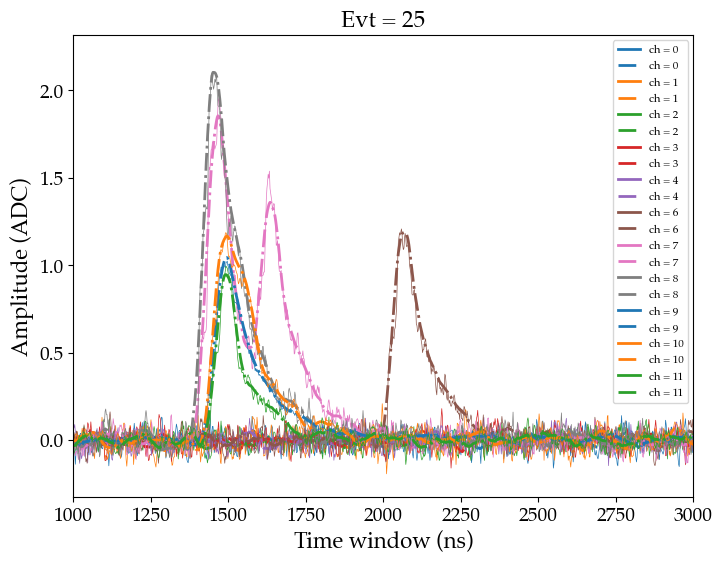

In [63]:
evt = 25
plt.figure(figsize=(8, 6))
prop_cycle = plt.rcParams['axes.prop_cycle']
colors     = prop_cycle.by_key()['color']
ic = 0
for ch,g in zip(normal_chs, gains_normal_ch):
    if ch ==5:
        continue
    wf  = subt_wfs_dict    [ch][evt]/g
    fwf = sg_filt_swfs_dict[ch][evt]/gains_sg[ch]
    plt.plot(2*np.arange(len(wf)),  wf,  linewidth=0.5, label=f'ch = {ch}', color=colors[ic])
    plt.plot(2*np.arange(len(fwf)), fwf, linewidth=2,   label=f'ch = {ch}', color=colors[ic], linestyle='-.')
    ic += 1

ic = 0
for ch,g in zip(trigger_chs, gains_trigger_ch):
    wf  = trigg_cwfs_dict   [ch][evt]/g
    fwf = sg_filt_trigg_dict[ch][evt]/gains_sg[ch]
    plt.plot(2*np.arange(len(wf)), wf, linewidth=0.5, label=f'ch = {ch}', color=colors[ic])
    plt.plot(2*np.arange(len(fwf)), fwf, linewidth=2, label=f'ch = {ch}', color=colors[ic], linestyle='-.')
    ic += 1
plt.xlabel('Time window (ns)', fontsize=16)
plt.ylabel('Amplitude (ADC)',  fontsize=16)
plt.title(f'Evt = {evt}')
leg = plt.legend(fontsize=8)
for line in leg.get_lines():
    line.set_linewidth(2)
plt.xlim(1000, 3000)
plt.show()   
        

In [64]:
thr_spe = 0.5
zs_sg_filt_swfs_dict = {ch: pf.noise_suppression(sg_filt_swfs_dict[ch]/gains_sg[ch],
                                                 threshold=thr_spe)
                        for ch in normal_chs}

zs_sg_filt_trigg_dict = {ch: pf.noise_suppression(sg_filt_trigg_dict[ch]/gains_sg[ch],
                                                  threshold=thr_spe)
                         for ch in trigger_chs}

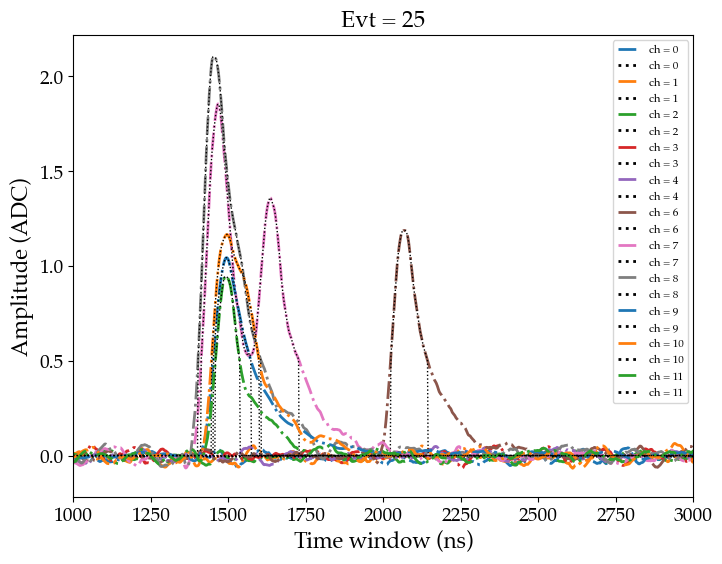

In [65]:
evt = 25
plt.figure(figsize=(8, 6))
prop_cycle = plt.rcParams['axes.prop_cycle']
colors     = prop_cycle.by_key()['color']
ic = 0
for ch,g in zip(normal_chs, gains_normal_ch):
    if ch ==5:
        continue
    wf   = subt_wfs_dict       [ch][evt]/g
    fwf  = sg_filt_swfs_dict   [ch][evt]/gains_sg[ch]
    zswf = zs_sg_filt_swfs_dict[ch][evt]
    #plt.plot(2*np.arange(len(wf)),   wf,   linewidth=0.5, label=f'ch = {ch}', color=colors[ic])
    plt.plot(2*np.arange(len(fwf)),  fwf,  linewidth=2,   label=f'ch = {ch}', color=colors[ic], linestyle='-.')
    plt.plot(2*np.arange(len(zswf)), zswf, linewidth=1,   label=f'ch = {ch}', color='k', linestyle=':')
    ic += 1

ic = 0
for ch,g in zip(trigger_chs, gains_trigger_ch):
    wf   = trigg_cwfs_dict      [ch][evt]/g
    fwf  = sg_filt_trigg_dict   [ch][evt]/gains_sg[ch]
    zswf = zs_sg_filt_trigg_dict[ch][evt]
    #plt.plot(2*np.arange(len(wf)),   wf,   linewidth=0.5, label=f'ch = {ch}', color=colors[ic])
    plt.plot(2*np.arange(len(fwf)),  fwf,  linewidth=2, label=f'ch = {ch}', color=colors[ic], linestyle='-.')
    plt.plot(2*np.arange(len(zswf)), zswf, linewidth=1, label=f'ch = {ch}', color='k', linestyle=':')
    ic += 1
plt.xlabel('Time window (ns)', fontsize=16)
plt.ylabel('Amplitude (ADC)',  fontsize=16)
plt.title(f'Evt = {evt}')
leg = plt.legend(fontsize=8)
for line in leg.get_lines():
    line.set_linewidth(2)
plt.xlim(1000, 3000)
plt.show()

In [66]:
thr_spe = 0.5
partial_get_peaks_peakutils_spe = partial(pf.get_peaks_peakutils, thres=thr_spe, min_dist=50, thres_abs=True)

idx_peaks_ch_dict = {ch: np.array(list(map(partial_get_peaks_peakutils_spe, zs_sg_filt_swfs_dict[ch])), dtype=object)
                     for ch in normal_chs}

idx_peaks_thr_ch_dict = {ch: np.array([pf.get_values_thr_from_zswf(wf, idx_peaks_ch_dict[ch][i])
                                      for i,wf in enumerate(zs_sg_filt_swfs_dict[ch])], dtype=object)
                         for ch in normal_chs}

height_peaks_ch_dict = {ch: np.array([wf[idx_peaks_ch_dict[ch][i]] if len(idx_peaks_ch_dict[ch][i])!=0 else np.array([])
                                            for i, wf in enumerate(subt_wfs_dict[ch])], dtype=object)
                              for ch in normal_chs}

height_peaks_sg_ch_dict = {ch: np.array([pf.peak_height(wf, idx_peaks_ch_dict[ch][i])
                                      for i,wf in enumerate(zs_sg_filt_swfs_dict[ch])], dtype=object)
                        for ch in normal_chs}

height_peaks_deconv_ch_dict = {ch: np.array([pf.peak_height_deconv(wf,
                                                                   idx_peaks_ch_dict   [ch][i],
                                                                   height_peaks_ch_dict[ch][i].copy())
                               for i, wf in enumerate(zs_sg_filt_swfs_dict[ch])], dtype=object)
                               for ch in normal_chs}

height_peaks_sg_deconv_ch_dict = {ch: np.array([pf.peak_height_deconv(wf,
                                                                      idx_peaks_ch_dict      [ch][i],
                                                                      height_peaks_sg_ch_dict[ch][i].copy())
                               for i, wf in enumerate(zs_sg_filt_swfs_dict[ch])], dtype=object)
                               for ch in normal_chs}



idx_peaks_ch_trigg_dict = {ch: np.array(list(map(partial_get_peaks_peakutils_spe, zs_sg_filt_trigg_dict[ch])), dtype=object)
                           for ch in trigger_chs}

idx_peaks_thr_ch_trigg_dict = {ch: np.array([pf.get_values_thr_from_zswf(wf, idx_peaks_ch_trigg_dict[ch][i])
                                            for i,wf in enumerate(zs_sg_filt_trigg_dict[ch])], dtype=object)
                               for ch in trigger_chs}

height_peaks_ch_trigg_dict = {ch: np.array([wf[idx_peaks_ch_trigg_dict[ch][i]] if len(idx_peaks_ch_trigg_dict[ch][i])!=0 else np.array([])
                                            for i,wf in enumerate(trigg_cwfs_dict[ch])], dtype=object)
                              for ch in trigger_chs}

height_peaks_sg_ch_trigg_dict = {ch: np.array([pf.peak_height(wf, idx_peaks_ch_trigg_dict[ch][i])
                                               for i,wf in enumerate(zs_sg_filt_trigg_dict[ch])], dtype=object)
                                 for ch in trigger_chs}

height_peaks_deconv_ch_trigg_dict = {ch: np.array([pf.peak_height_deconv(wf,
                                                                        idx_peaks_ch_trigg_dict   [ch][i],
                                                                        height_peaks_ch_trigg_dict[ch][i].copy())
                                     for i, wf in enumerate(zs_sg_filt_trigg_dict[ch])], dtype=object)
                                     for ch in trigger_chs}

height_peaks_sg_deconv_ch_trigg_dict = {ch: np.array([pf.peak_height_deconv(wf,
                                                                            idx_peaks_ch_trigg_dict      [ch][i],
                                                                            height_peaks_sg_ch_trigg_dict[ch][i].copy())
                                     for i, wf in enumerate(zs_sg_filt_trigg_dict[ch])], dtype=object)
                                     for ch in trigger_chs}


In [67]:
for ch in normal_chs:
    print(len(idx_peaks_thr_ch_dict[ch]))

23376
23376
23376
23376
23376
23376
23376
23376


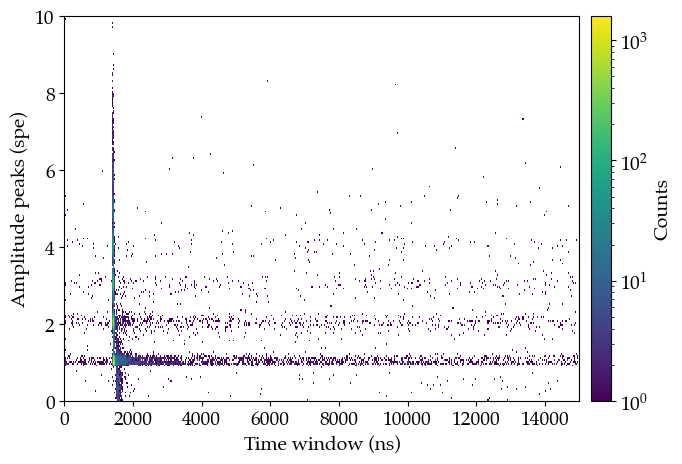

In [68]:
sel_ch = 8

fig = plt.figure(figsize=(8, 5))
h   = plt.hist2d(np.concatenate(idx_peaks_thr_ch_dict[sel_ch])*2, np.concatenate(height_peaks_sg_deconv_ch_dict[sel_ch]), bins=(500, 200), range=((0, 15000), (0, 10)), cmin=1, norm=LogNorm())
plt.xlabel('Time window (ns)',      fontsize=14)
plt.ylabel('Amplitude peaks (spe)', fontsize=14)
plt.colorbar(h[3], label='Counts', pad=0.02)
plt.show()

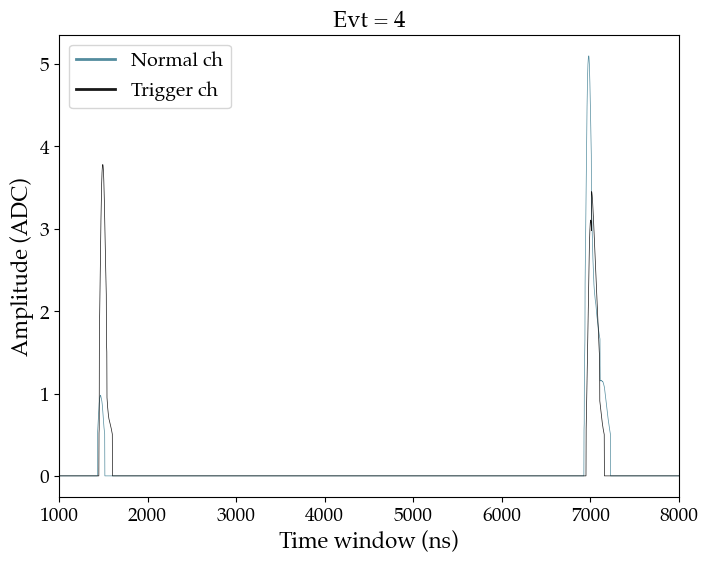

In [69]:
evt = 4
plt.figure(figsize=(8, 6))
sum_normal_ch  = np.sum([zs_sg_filt_swfs_dict [ch][evt] for ch in normal_chs],  axis=0)
sum_trigger_ch = np.sum([zs_sg_filt_trigg_dict[ch][evt] for ch in trigger_chs], axis=0)
#plt.plot(2*np.arange(len(sum_normal_ch)), sum_normal_ch+sum_trigger_ch, linewidth=0.5, label=f'Channel {ch}', color=fav_col, alpha=0.9)
plt.plot(2*np.arange(len(sum_normal_ch)),  sum_normal_ch,  linewidth=0.5, color=fav_col, alpha=0.9, label='Normal ch')
plt.plot(2*np.arange(len(sum_trigger_ch)), sum_trigger_ch, linewidth=0.5, color='k',     alpha=0.9, label='Trigger ch')
plt.xlabel('Time window (ns)', fontsize=16)
plt.ylabel('Amplitude (ADC)',  fontsize=16)
plt.title(f'Evt = {evt}')
leg = plt.legend()
for line in leg.get_lines():
    line.set_linewidth(2)
plt.xlim(1000, 8000)
plt.show()

#### Consider all channels together

In [70]:
for evt in range(10):
    print('--------------------------------------------------')
    for ch in normal_chs:
        print(idx_peaks_thr_ch_dict[ch][evt], height_peaks_sg_deconv_ch_dict[ch][evt])
    for ch in trigger_chs:
        print(idx_peaks_thr_ch_trigg_dict[ch][evt], height_peaks_sg_deconv_ch_trigg_dict[ch][evt])

--------------------------------------------------
[] []
[] []
[] []
[] []
[] []
[710.] [1.0099703]
[] []
[727.] [1.0484593]
[732.] [0.93956063]
[723.] [0.97526004]
[723.] [0.97147194]
--------------------------------------------------
[] []
[] []
[] []
[] []
[] []
[] []
[709.] [2.9237618]
[718.] [0.9743784]
[734.] [0.9461328]
[730.] [0.98738437]
[ 729. 1336.] [2.09647635 3.0186222 ]
--------------------------------------------------
[] []
[] []
[720.] [0.9946882]
[] []
[] []
[720.] [0.99891055]
[] []
[726.] [1.1233591]
[729.] [2.02195257]
[731.] [2.48150331]
[721.] [3.04616719]
--------------------------------------------------
[711.] [0.9304508]
[] []
[711. 879.] [3.9353282 1.0687304]
[] []
[] []
[701.] [4.004304]
[3801. 4521.] [3.4914465 3.0039551]
[ 712.  779. 3808.] [0.99392605 1.1274396  1.0224892 ]
[729.] [0.79553139]
[722.] [1.07169344]
[724.] [1.96812202]
--------------------------------------------------
[] []
[] []
[] []
[] []
[] []
[ 718. 3464.] [0.9787945 2.2420592]
[3466.

In [71]:
idx_peaks_thr_ch_all          = []
height_peaks_sg_deconv_ch_all = []
for evt in range(len(height_peaks_sg_deconv_ch_dict[0])):
    qindex_all_ch = []
    qpeaks_all_ch = []
    for ch in normal_chs:
        for qindex, qpeak in zip(idx_peaks_thr_ch_dict[ch][evt], height_peaks_sg_deconv_ch_dict[ch][evt]):
            qindex_all_ch.append(qindex)
            qpeaks_all_ch.append(qpeak)
    for ch in trigger_chs:
        for qindex, qpeak in zip(idx_peaks_thr_ch_trigg_dict[ch][evt], height_peaks_sg_deconv_ch_trigg_dict[ch][evt]):
            qindex_all_ch.append(qindex)
            qpeaks_all_ch.append(qpeak)

    idx_peaks_thr_ch_all         .append(np.array(qindex_all_ch))
    height_peaks_sg_deconv_ch_all.append(np.array(qpeaks_all_ch))

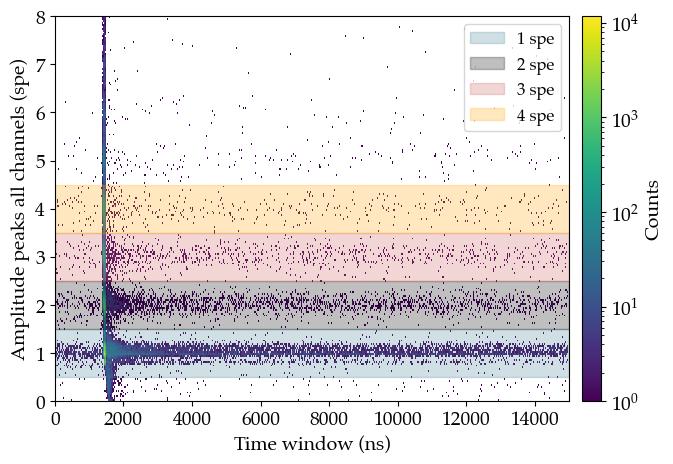

In [72]:
fig = plt.figure(figsize=(8, 5))
h   = plt.hist2d(np.concatenate(idx_peaks_thr_ch_all)*2, np.concatenate(height_peaks_sg_deconv_ch_all), bins=(750, 200), range=((0, 15000), (0, 8)), cmin=1, norm=LogNorm())
plt.xlabel('Time window (ns)',      fontsize=14)
plt.ylabel('Amplitude peaks all channels (spe)', fontsize=14)
plt.colorbar(h[3], label='Counts', pad=0.02)
for i, col in zip(range(1, 5), [fav_col, 'k', 'indianred', 'orange']):
    #plt.axhline(y=i + 0.5, color='r', linewidth=0.8)
    plt.axhspan(i - 0.5, i + 0.5, color=col, alpha=0.25, label=f'{i} spe')
plt.legend(fontsize=12)
#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/hit_map_all_chs_spe.pdf', bbox_inches='tight')
plt.show()

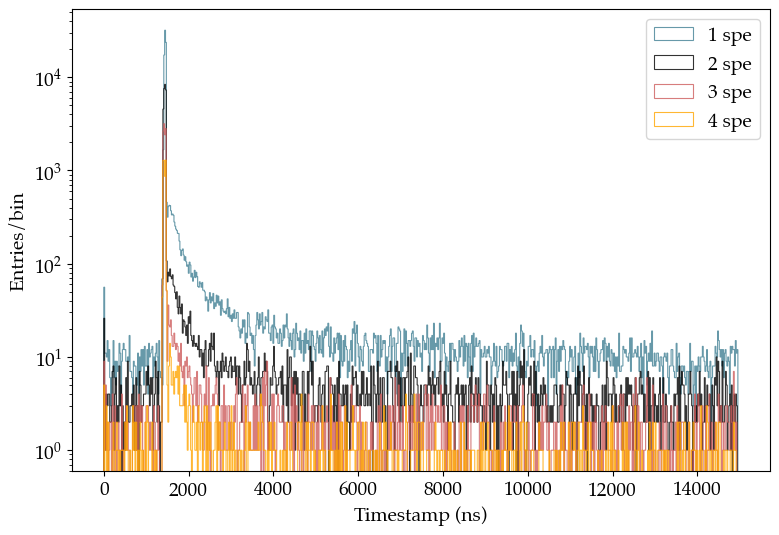

In [73]:
data  = np.concatenate(height_peaks_sg_deconv_ch_all)
data2 = np.concatenate(idx_peaks_thr_ch_all)*2
for nspe, col in zip(range(1, 5), [fav_col, 'k', 'indianred', 'orange']):
    sel_spe  = (data>(nspe-0.5))&(data<(nspe+0.5))
    idx_spe  = data2[sel_spe]
    plt.hist(idx_spe, bins=750, log=True, histtype='step', linewidth=0.8, label=f'{nspe} spe', color=col, alpha=0.8)
plt.xlabel('Timestamp (ns)')
plt.ylabel('Entries/bin')
plt.legend()
#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/sum_hits_all_chs_spe.pdf', bbox_inches='tight')
plt.show()

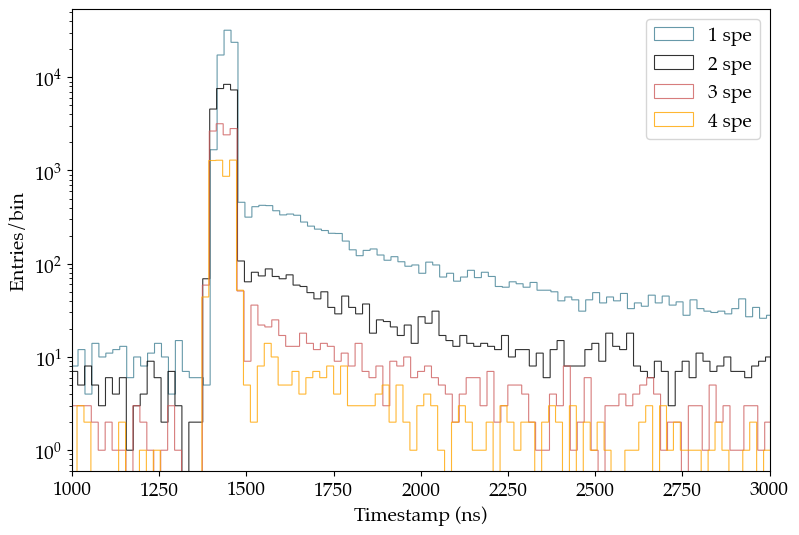

In [74]:
data  = np.concatenate(height_peaks_sg_deconv_ch_all)
data2 = np.concatenate(idx_peaks_thr_ch_all)*2
for nspe, col in zip(range(1, 5), [fav_col, 'k', 'indianred', 'orange']):
    sel_spe  = (data>(nspe-0.5))&(data<(nspe+0.5))
    idx_spe  = data2[sel_spe]
    plt.hist(idx_spe, bins=750, log=True, histtype='step', linewidth=0.8, label=f'{nspe} spe', color=col, alpha=0.8)
plt.xlabel('Timestamp (ns)')
plt.ylabel('Entries/bin')
plt.legend()
plt.xlim(1000, 3000)
#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/sum_hits_all_chs_spe.pdf', bbox_inches='tight')
plt.show()

In [75]:
data  = np.concatenate(height_peaks_sg_deconv_ch_all)
data2 = np.concatenate(idx_peaks_thr_ch_all)*2
sum_hits_all_spe = []
for nspe in range(1, 5):
    sum_hits_spe = []
    sel_spe  = (data>(nspe-0.5))&(data<(nspe+0.5))
    idx_spe  = data2[sel_spe]
    for time_bin in range(0, 15000, 2):
        sum_hits_spe.append(np.sum(data[sel_spe][np.where((idx_spe==time_bin))]))
    sum_hits_all_spe.append(np.array(sum_hits_spe))

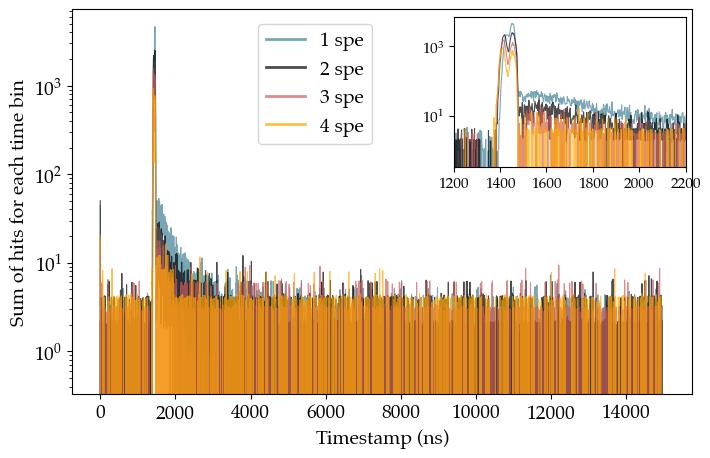

In [76]:
fig = plt.figure(figsize=(8, 5))
for sum_h, nspe, col in zip(sum_hits_all_spe, range(1, 5), [fav_col, 'k', 'indianred', 'orange']):
    plt.plot(range(0, 15000, 2), sum_h, lw=0.8, label=f'{nspe} spe', color=col, alpha=0.7)
plt.xlabel('Timestamp (ns)')
plt.ylabel('Sum of hits for each time bin')
leg = plt.legend(loc=(0.3, 0.65))
for line in leg.get_lines():
    line.set_linewidth(2)

plt.yscale('log')

ax_inset = fig.add_axes([0.602, 0.565, 0.29, 0.30])
for sum_h, nspe, col in zip(sum_hits_all_spe, range(1, 5), [fav_col, 'k', 'indianred', 'orange']):
    ax_inset.plot(range(0, 15000, 2), sum_h, lw=0.8, label=f'{nspe} spe', color=col, alpha=0.7)
ax_inset.set_xlim(1200, 2200)
ax_inset.set_yscale('log')
ax_inset.tick_params(axis='x', labelsize=11)
ax_inset.tick_params(axis='y', labelsize=11)
#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/sum_hits_all_chs_spe.pdf', bbox_inches='tight')
plt.show()

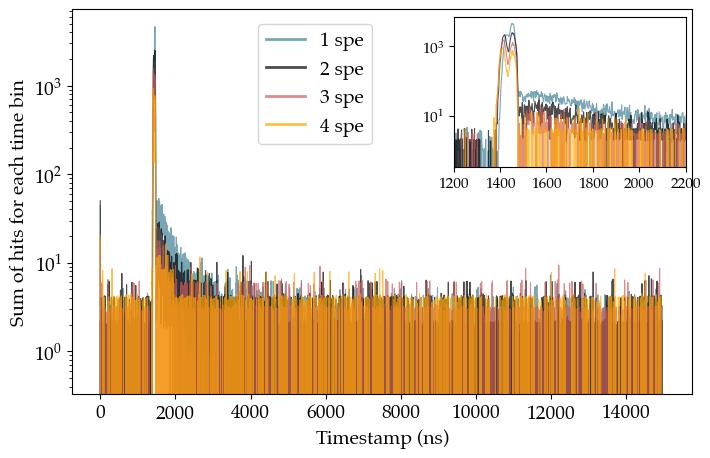

In [77]:
fig = plt.figure(figsize=(8, 5))
for sum_h, nspe, col in zip(sum_hits_all_spe, range(1, 5), [fav_col, 'k', 'indianred', 'orange']):
    plt.plot(range(0, 15000, 2), sum_h, lw=0.8, label=f'{nspe} spe', color=col, alpha=0.7)
plt.xlabel('Timestamp (ns)')
plt.ylabel('Sum of hits for each time bin')
leg = plt.legend(loc=(0.3, 0.65))
for line in leg.get_lines():
    line.set_linewidth(2)

plt.yscale('log')

ax_inset = fig.add_axes([0.602, 0.565, 0.29, 0.30])
for sum_h, nspe, col in zip(sum_hits_all_spe, range(1, 5), [fav_col, 'k', 'indianred', 'orange']):
    ax_inset.plot(range(0, 15000, 2), sum_h, lw=0.8, label=f'{nspe} spe', color=col, alpha=0.7)
ax_inset.set_xlim(1200, 2200)
ax_inset.set_yscale('log')
ax_inset.tick_params(axis='x', labelsize=11)
ax_inset.tick_params(axis='y', labelsize=11)
#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/sum_hits_all_chs_spe.pdf', bbox_inches='tight')
plt.show()

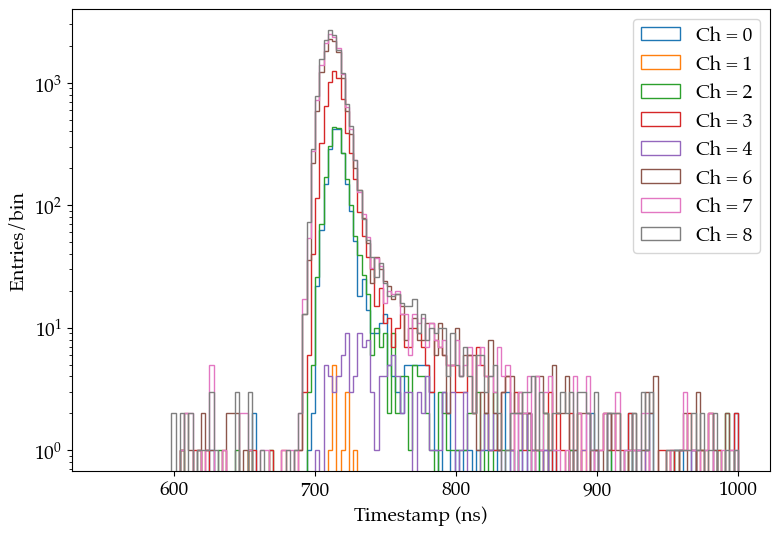

In [78]:
for ch, idx_peaks_thr_ch in idx_peaks_thr_ch_dict.items():
    idx_ch = []
    for i in idx_peaks_thr_ch:
        if len(i)==0:
            continue
        if np.any(np.array(i) < 600):
            continue
        idx_ch.append(i[0])
    plt.hist(np.array(idx_ch), bins=150, range=(550, 1000), log=True, histtype='step', label=f'Ch = {ch}')
plt.xlabel('Timestamp (ns)')
plt.ylabel('Entries/bin')
plt.legend()
plt.show()

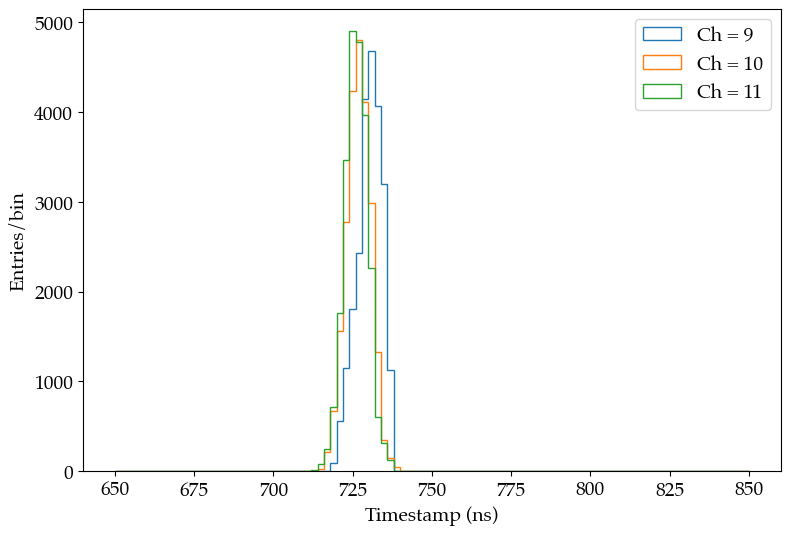

In [79]:
for ch, idx_peaks_thr_ch in idx_peaks_thr_ch_trigg_dict.items():
    idx_ch = []
    for i in idx_peaks_thr_ch:
        if len(i)==0:
            continue
        if np.any(np.array(i) < 600):
            continue
        idx_ch.append(i[0])
    plt.hist(np.array(idx_ch), bins=100, range=(650, 850), log=False, histtype='step', label=f'Ch = {ch}')
plt.xlabel('Timestamp (ns)')
plt.ylabel('Entries/bin')
plt.legend()
plt.show()

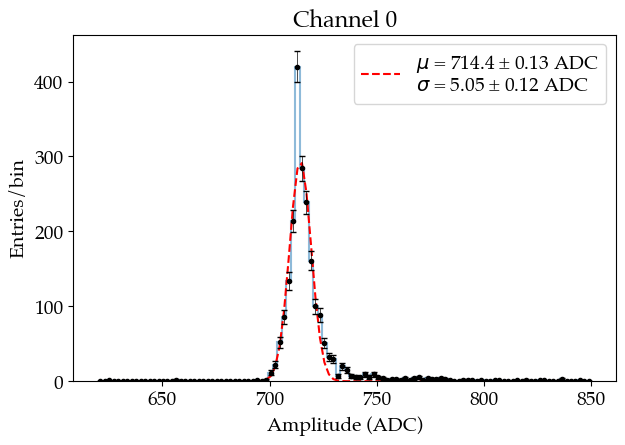

Zero or negative value found in argument sigma. Errors must be greater than 0.
1


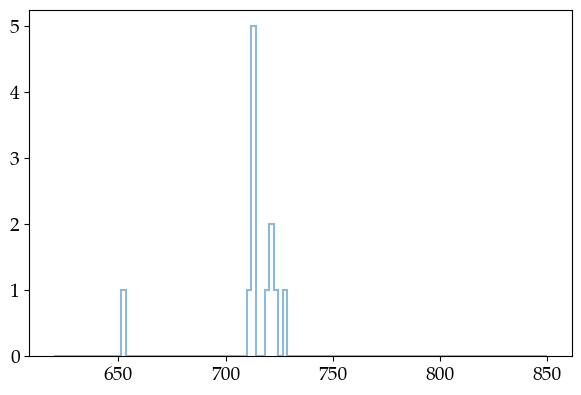

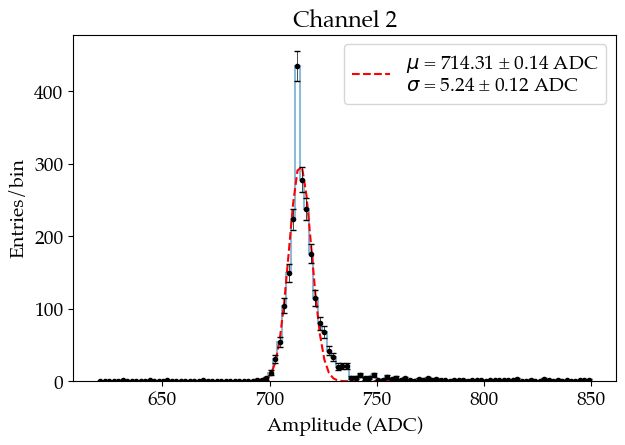

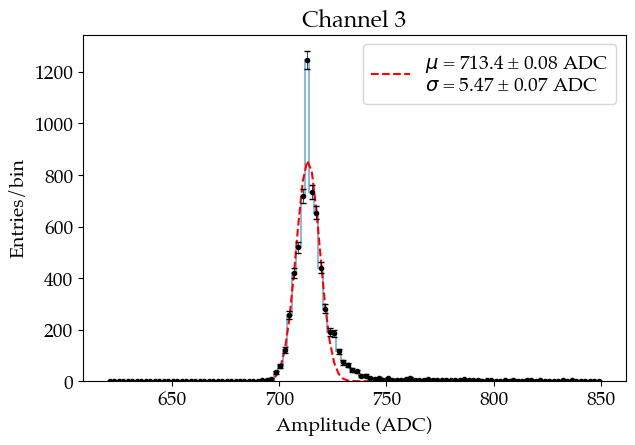

Zero or negative value found in argument sigma. Errors must be greater than 0.
4


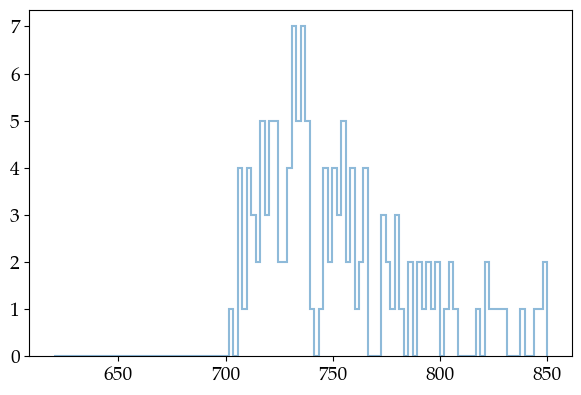

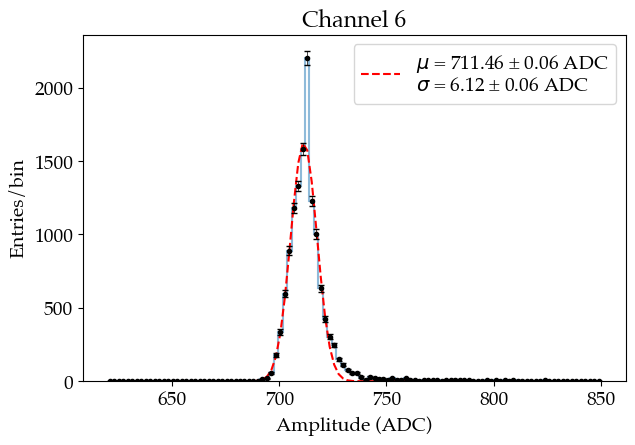

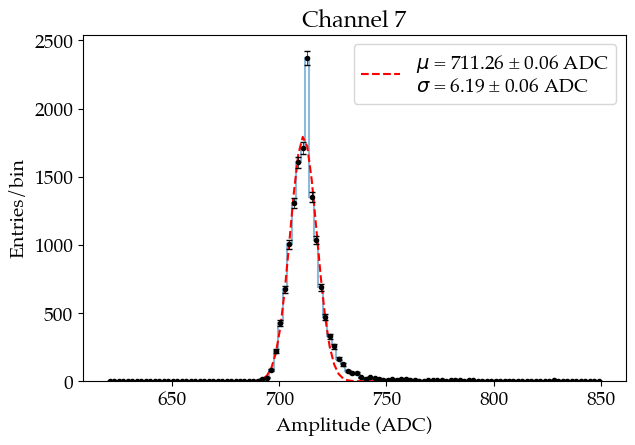

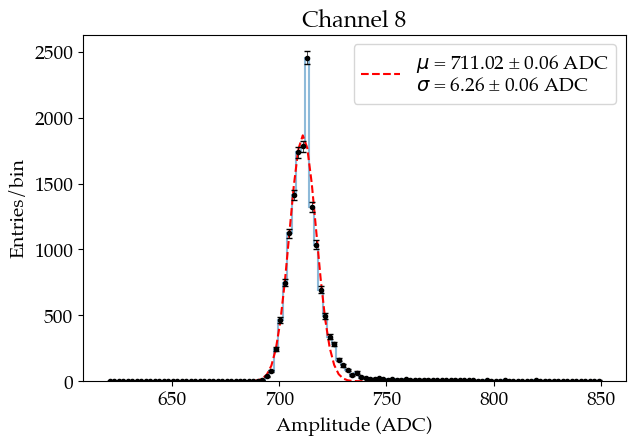

In [80]:
for ch, idx_peaks_thr_ch in idx_peaks_thr_ch_dict.items():
    idx_ch = []
    for i in idx_peaks_thr_ch:
        if len(i)==0:
            continue
        if np.any(np.array(i) < 600):
            continue
        idx_ch.append(i[0])
    try:
        #plt.hist(np.array(idx_ch), bins=150, range=(550, 1000), log=True, histtype='step', label=f'Ch = {ch}')
        fitf.gaussian_fit_IC(np.array(idx_ch), bins=110, prange=(620, 850), ampl=1000, mean=710, sigma=30,
                             frange=(700, 725), title=f'Channel {ch}', print_chi2=False, figsize=(7,4.5))
    except Exception as e:
        print(e)
        print(ch)
        continue

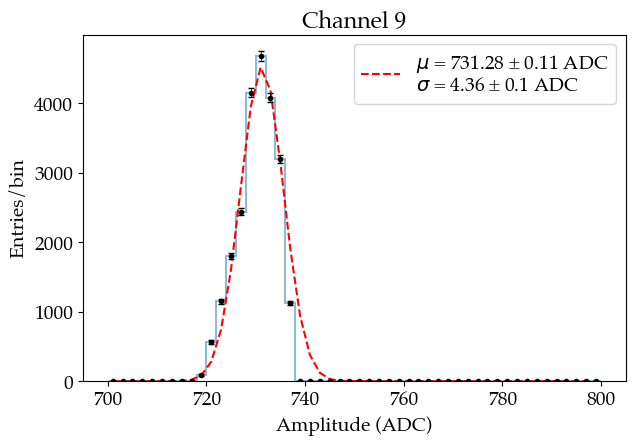

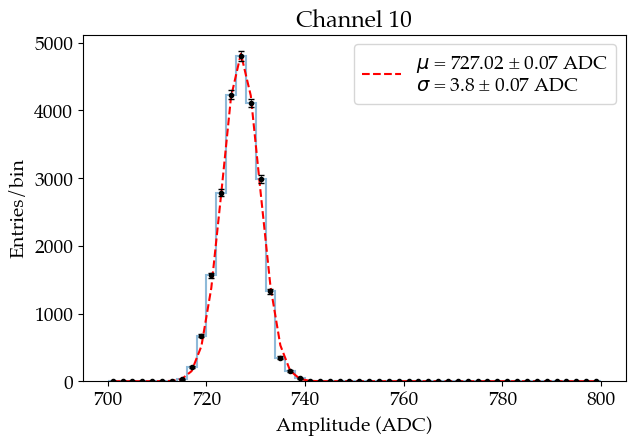

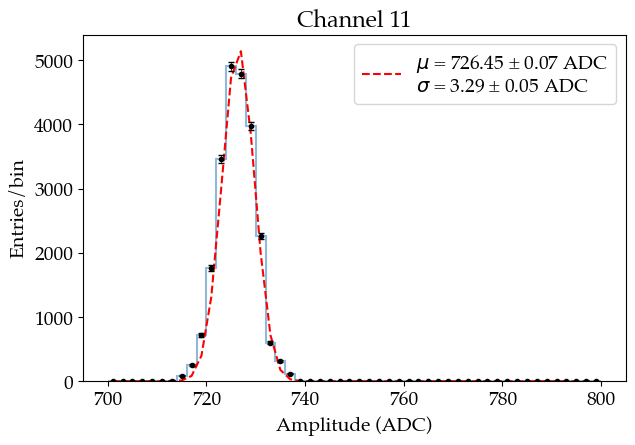

In [81]:
for ch, idx_peaks_thr_ch in idx_peaks_thr_ch_trigg_dict.items():
    idx_ch = []
    for i in idx_peaks_thr_ch:
        if len(i)==0:
            continue
        if np.any(np.array(i) < 600):
            continue
        idx_ch.append(i[0])
    fitf.gaussian_fit_IC(np.array(idx_ch), bins=50, prange=(700, 800), ampl=1000, mean=730, sigma=30,
                             frange=(725, 735), title=f'Channel {ch}', print_chi2=False, figsize=(7,4.5))

#### All cases:

In [82]:
first_time_peaks_thr_ch_all = []
for evt in range(len(height_peaks_sg_deconv_ch_dict[0])):
    qindex_all_ch = []
    for ch in normal_chs:
        for qindex in idx_peaks_thr_ch_dict[ch][evt]:
            qindex_all_ch.append(qindex)
    for ch in trigger_chs:
        for qindex in idx_peaks_thr_ch_trigg_dict[ch][evt]:
            qindex_all_ch.append(qindex)

    if len(qindex_all_ch)==0:
        continue
    if np.any(np.array(qindex_all_ch) < 600):
        continue

    first_time_peaks_thr_ch_all.append(np.min(qindex_all_ch))

In [83]:
def gaussian_fit_IC(data, bins=100, prange=(-50, 150), ampl=100, mean=0, sigma=10, frange=(-50, 50), title='', ndec=2, print_chi2=True, figsize=(8,5), xlabel='Amplitude (ADC)', units='ADC'):
    plt.figure(figsize=figsize)
    y, x, _ = plt.hist(data, bins=bins, alpha=0.5, range=prange, histtype='step', linewidth=1.5)
    f = fitf.fit(fitf.gauss, fitf.shift_to_bin_centers(x), y, (ampl,mean,sigma), fit_range=frange, sigma=np.sqrt(y))

    plt.plot(fitf.shift_to_bin_centers(x), fitf.gauss(fitf.shift_to_bin_centers(x), *f.values[:3]), 'r--',
             label=fitf.string_fit(f, ndec=ndec, print_chi2=print_chi2, units=units))
    plt.errorbar(fitf.shift_to_bin_centers(x), y, yerr=np.sqrt(y), fmt='.k', elinewidth=0.5, capsize=2, capthick=1)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel('Entries/bin')
    plt.legend()
    plt.show()

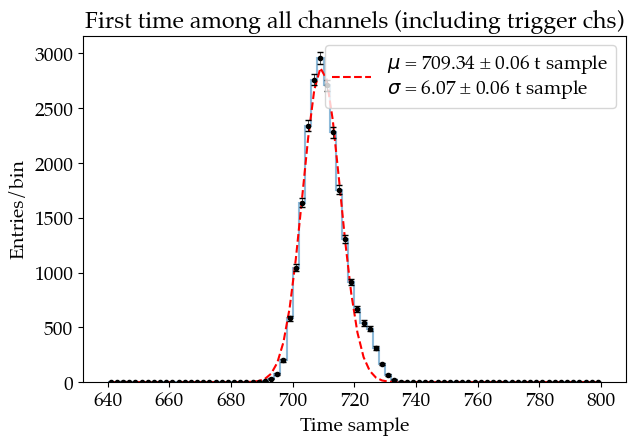

In [84]:
gaussian_fit_IC(np.array(first_time_peaks_thr_ch_all), bins=80, prange=(640, 800), ampl=1000, mean=710,
                sigma=30, frange=(700, 720), title=f'First time among all channels (including trigger chs)',
                print_chi2=False, figsize=(7,4.5), units='t sample', xlabel='Time sample');

### Compute rise time 

In [85]:
diff_t_thr_and_t_max_dict = {}
for ch in normal_chs:
    diff_t_thr_and_t_max = []
    for evt in range(len(height_peaks_sg_deconv_ch_dict[0])):
        for tdiff in (idx_peaks_ch_dict[ch][evt] - idx_peaks_thr_ch_dict[ch][evt]):
            diff_t_thr_and_t_max.append(tdiff)
    diff_t_thr_and_t_max_dict[ch] = np.array(diff_t_thr_and_t_max)

for ch in trigger_chs:
    diff_t_thr_and_t_max = []
    for evt in range(len(height_peaks_sg_deconv_ch_dict[0])):
        for tdiff in (idx_peaks_ch_trigg_dict[ch][evt] - idx_peaks_thr_ch_trigg_dict[ch][evt]):
            diff_t_thr_and_t_max.append(tdiff)
    diff_t_thr_and_t_max_dict[ch] = np.array(diff_t_thr_and_t_max)

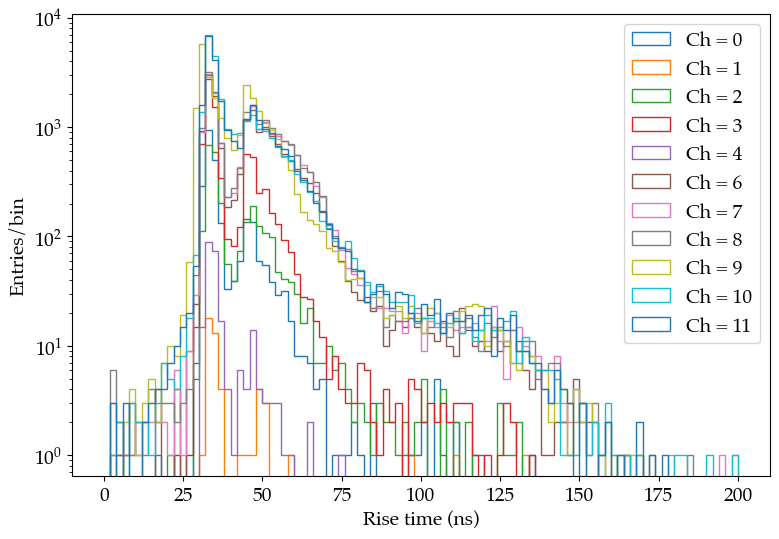

In [86]:
for ch, diff_t in diff_t_thr_and_t_max_dict.items():
    plt.hist(np.array(diff_t)*2, bins=100, range=(0, 200), log=True, histtype='step', label=f'Ch = {ch}')
plt.xlabel('Rise time (ns)')
plt.ylabel('Entries/bin')
plt.legend()
plt.show()

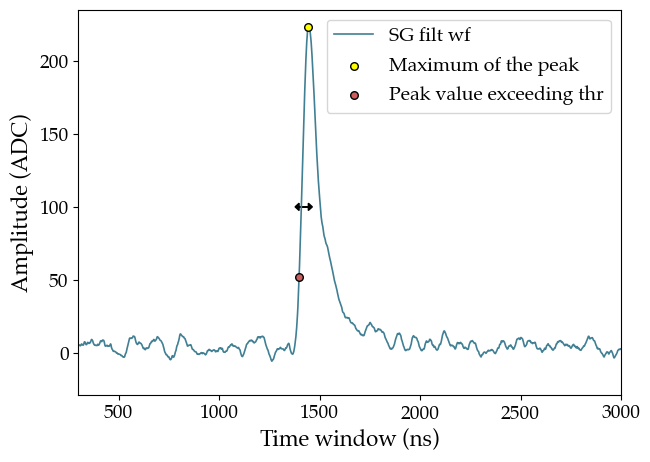

In [87]:
sel_ch        = 8
one_wf_ch     = np.array(RawTree[f'chan{sel_ch}/rdigi'].array())[0]
subt_wf_ch    = pf.subtract_baseline(one_wf_ch, mode=True, wf_range_bsl=(0, 650))
filt_swf_ch   = savgol_filter(subt_wf_ch, window_length=50, polyorder=3)
zs_filt_wf    = pf.noise_suppression(filt_swf_ch, threshold=50)
idx_peaks     = pf.get_peaks_peakutils(zs_filt_wf, thres=50, min_dist=50, thres_abs=True)
idx_peaks_thr = pf.get_values_thr_from_zswf(zs_filt_wf, idx_peaks)
idx_peaks_thr = idx_peaks_thr.astype(int)

plt.figure(figsize=(7, 5))
plt.plot(2*np.arange(len(filt_swf_ch)), filt_swf_ch, linewidth=1.2, color=fav_col, label='SG filt wf')
plt.scatter(2*idx_peaks,     zs_filt_wf[idx_peaks],     color='yellow',    edgecolors='black', marker='o', s=30, zorder=2, label=f'Maximum of the peak')
plt.scatter(2*idx_peaks_thr, zs_filt_wf[idx_peaks_thr], color='indianred', edgecolors='black', marker='o', s=30, zorder=2, label=f'Peak value exceeding thr')
plt.arrow(2*idx_peaks_thr[0], 100,   2*idx_peaks[0] - 2*idx_peaks_thr[0],  0, head_width=5, head_length=20, fc='k', ec='k')
plt.arrow(2*idx_peaks    [0], 100, -(2*idx_peaks[0] - 2*idx_peaks_thr[0]), 0, head_width=5, head_length=20, fc='k', ec='k')
plt.xlabel('Time window (ns)', fontsize=16)
plt.ylabel('Amplitude (ADC)',  fontsize=16)
plt.xlim(300, 3000)
plt.legend()
#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/Rise_time_illustration.pdf', bbox_inches='tight')
plt.show()

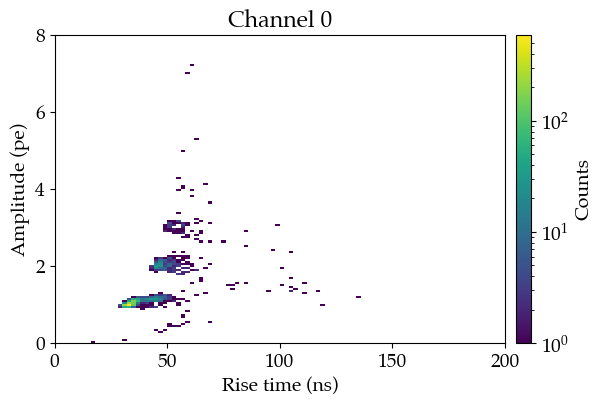

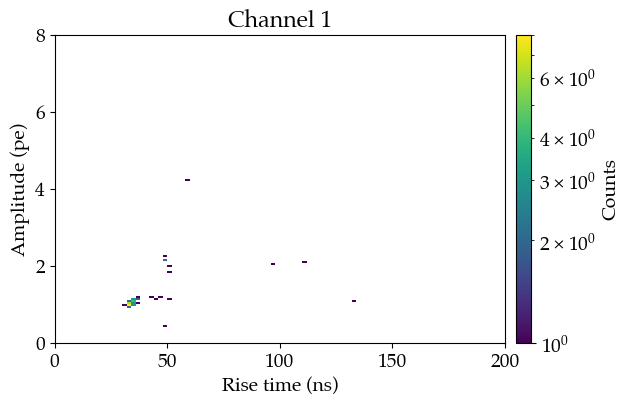

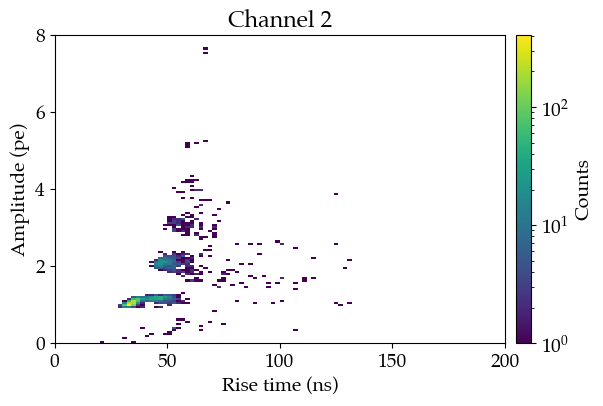

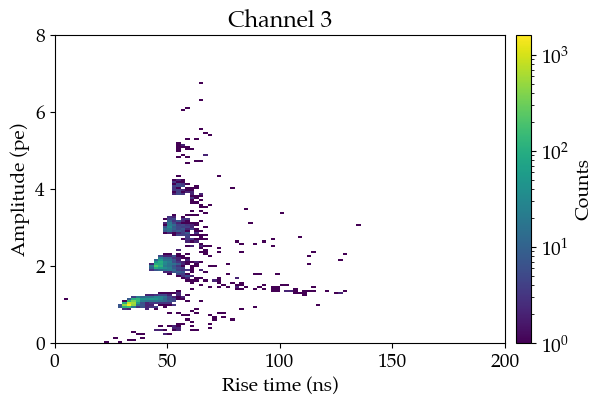

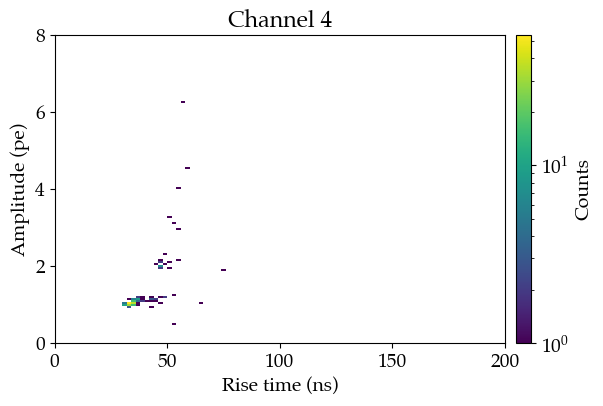

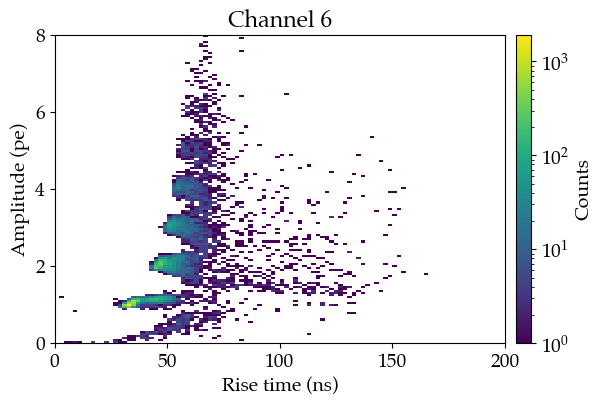

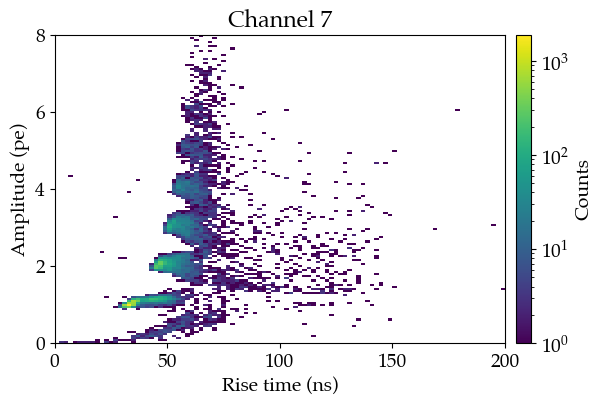

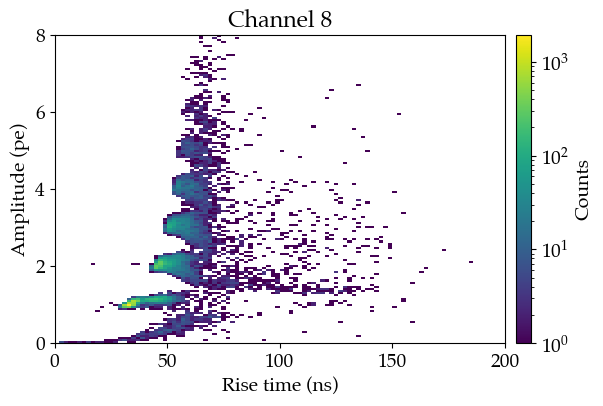

In [88]:
for ch, diff_t in zip(normal_chs, diff_t_thr_and_t_max_dict.values()):
    fig = plt.figure(figsize=(7, 4))
    h = plt.hist2d(np.array(diff_t)*2, np.concatenate(height_peaks_sg_deconv_ch_dict[ch]), bins=(100, 150), range=((0, 200), (0, 8)), cmin=1, norm=LogNorm())
    plt.xlabel('Rise time (ns)')
    plt.ylabel('Amplitude (pe)')
    plt.title(f'Channel {ch}')
    plt.colorbar(h[3], label='Counts', pad=0.02)
    plt.show()

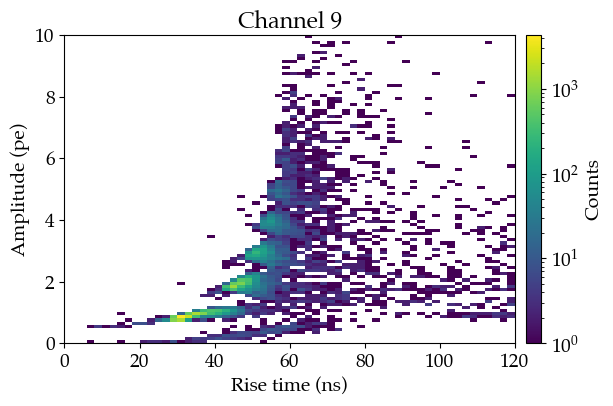

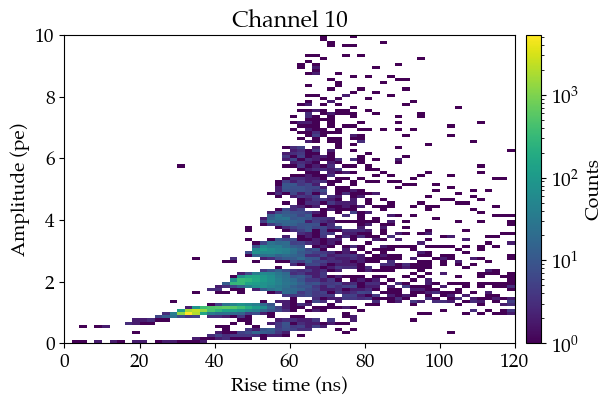

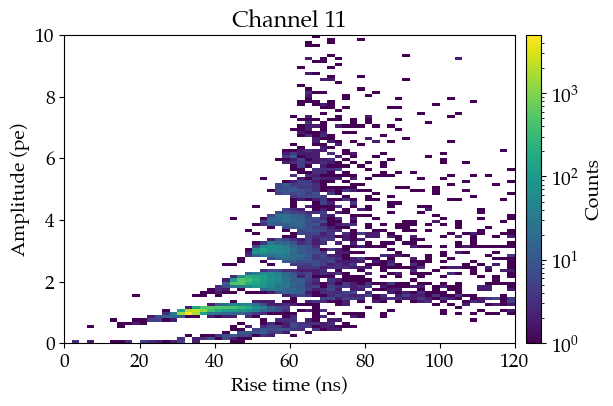

In [89]:
for ch, diff_t in diff_t_thr_and_t_max_dict.items():
    if ch in trigger_chs:
        fig = plt.figure(figsize=(7, 4))
        h = plt.hist2d(np.array(diff_t)*2, np.concatenate(height_peaks_sg_deconv_ch_trigg_dict[ch]), bins=(60, 100), range=((0, 120), (0, 10)), cmin=1, norm=LogNorm())
        plt.xlabel('Rise time (ns)')
        plt.ylabel('Amplitude (pe)')
        plt.title(f'Channel {ch}')
        plt.colorbar(h[3], label='Counts', pad=0.02)
        plt.show()

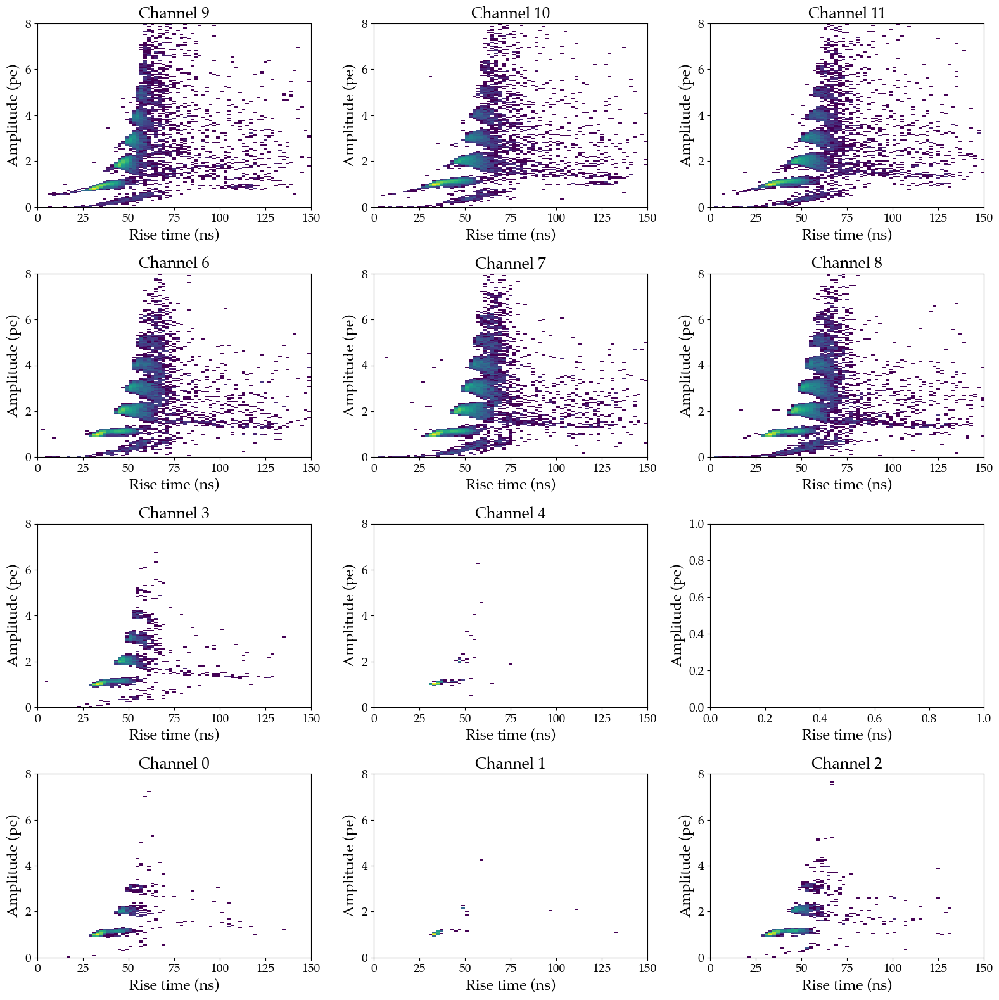

In [90]:
rev_row = [3, 3, 3, 2, 2, 2, 1, 1, 1]

fig, axs = plt.subplots(4, 3, figsize=(16, 16))
for ch, diff_t in diff_t_thr_and_t_max_dict.items():
    if ch > 8:
        continue
    i = rev_row[ch]
    j = ch%3
    axs[i][j].hist2d(np.array(diff_t)*2, np.concatenate(height_peaks_sg_deconv_ch_dict[ch]), bins=(75, 150), range=((0, 150), (0, 8)), cmin=1, norm=LogNorm())
    axs[i][j].set_title(f"Channel {ch}", fontsize=18)

for ch, diff_t in diff_t_thr_and_t_max_dict.items():
    if ch < 9:
        continue
    i = 0
    j = ch%3
    axs[i][j].hist2d(np.array(diff_t)*2, np.concatenate(height_peaks_sg_deconv_ch_trigg_dict[ch]), bins=(75, 150), range=((0, 150), (0, 8)), cmin=1, norm=LogNorm())
    axs[i][j].set_title(f"Channel {ch}", fontsize=18)
    
for ax in axs.flatten():
    ax.set_xlabel('Rise time (ns)',  fontsize=17)
    ax.set_ylabel('Amplitude (pe)', fontsize=17)

plt.tight_layout()
#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/rise_time.pdf', bbox_inches='tight')
plt.show()


## Count the number of photons in the singlet for the trigger SiPMs

In [91]:
singlet_samples = (680, 750)
qpeak_singlet_all_trigg = {}

for ch in trigger_chs:
    qpeak_singlet = []
    for evt in range(len(idx_peaks_thr_ch_trigg_dict[ch])):
        sel_singlet_time = (idx_peaks_thr_ch_trigg_dict[ch][evt]>singlet_samples[0]) & (idx_peaks_thr_ch_trigg_dict[ch][evt]<singlet_samples[1])
        for qpeak in height_peaks_sg_deconv_ch_trigg_dict[ch][evt][sel_singlet_time]:
            qpeak_singlet.append(qpeak)

    qpeak_singlet_all_trigg[ch] = np.array(qpeak_singlet)

In [92]:
qpeak_singlet_all_trigg

{9: array([0.93956063, 0.9461328 , 2.02195257, ..., 0.8399412 , 0.81797385,
        0.85461772]),
 10: array([0.97526004, 0.98738437, 2.48150331, ..., 0.97505859, 0.99957452,
        0.93922268]),
 11: array([0.97147194, 2.09647635, 3.04616719, ..., 1.12424996, 0.98486105,
        2.05269062])}

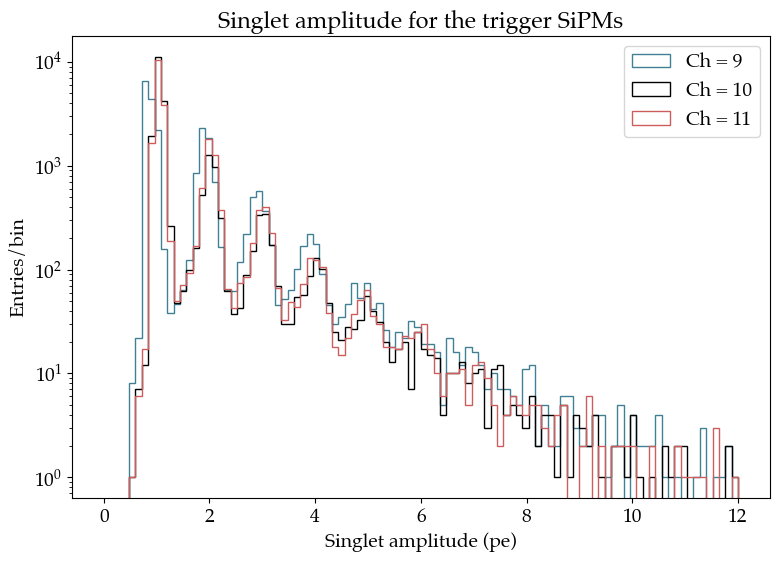

In [93]:
for (ch, qpeak_s), col in zip(qpeak_singlet_all_trigg.items(), [fav_col, 'k', 'indianred']):
    plt.hist(qpeak_s, bins=100, range=(0, 12), log=True, histtype='step', label=f'Ch = {ch}', color=col)
plt.title('Singlet amplitude for the trigger SiPMs')
plt.xlabel('Singlet amplitude (pe)')
plt.ylabel('Entries/bin')
plt.legend()
plt.show()